<div class="alert alert-success">
           <h1 style="font-size:25px;"><strong>Projet 6</strong></h1>
           <h1 style="font-size:25px;"><strong>Classifiez automatiquement des biens de consommation</strong></h1>
</div>

Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

**Contraintes**

Afin d’extraire les features texte, il sera nécessaire de mettre en œuvre :                       
* Deux approches de type “bag-of-words”, comptage simple de mots et Tf-idf.
* Une approche de type word/sentence embedding classique avec Word2Vec (ou Glove ou FastText) ;
* Une approche de type word/sentence embedding avec BERT.
* Une approche de type word/sentence embedding avec USE (Universal Sentence Encoder). 

Afin d’extraire les features image, il sera nécessaire de mettre en œuvre :
* Un algorithme de type SIFT / ORB / SURF ;
* Un algorithme de type CNN Transfer Learning





<div class="alert alert-success">
           <h1 style="font-size:25px;"><strong>Notebook Pretraitement Feature Extraction Faisaibilite</strong></h1>
</div>

## <font color="#00afe6">Sommaire</font>

[Imports, Chargemernts et connaisance de données. ](#section_A)                                                             
[API Edamam Food.](#section_api)
[01. Traitement des catégories](#section_1)                                         
[02. Données textuelles](#section_2)                                      
[2.1 Traitement des descriptions (BoW / TF IDF)](#section_2_1)                                       
[2.1.1 TF IDF](#section_2_1_1)                                                             
[2.1.2 Decomposition en pratique](#section_2_1_2)                                                           
[2.2 Bag of words](#section_2_2)                                                                         
[2.3 Réduction de dimension  (LDA/NMF)](#section_2_3)                                            
[2.4 LDA](#section_2_4)                                                          
[3.1 Topic le plus représenté par catégorie d'article](#section_3_1)                                                   
[3.2 Topic identifiés en fonction des catégories du jeu de données](#section_3_2)                                         
[4.0 Classifieurs supervisés sur données textuelles](#section_4)                                                    
[5.0 Classifier SVC](#section_5)                                                                                 
[5.1 Classifier SVC sur jeu de données post LDA](#section_5_1)                                                       
[5.2 Classifier Logistic Regression](#section_5_2)                                                                  
[6.0 Classifieurs non supervisés sur données textuelles](#section_6)                                                   
[6.1 ACP](#section_6_1)   

[Points à revoir item 2](#section_PAR_2): L'étudiant n'a pas utilisé les approches Word2Vec (ou Doc2Vec ou Glove ou FastText), BERT, et USE.                                                                                                         
[Points à revoir item 4](#section_PAR_4): L'utilisation de l'ACP n'est pas justifiée.                                     
[Points à revoir item 5](#section_PAR_5): Aucune technique d'augmentation de données n'est utilisée                        
[Points à revoir item 8](#section_PAR_8)                                      


[07. Données visuelles](#section_7)                                                                    
[7.1 Préambule : essai de convolution](#section_7_1)                                                              
[7.2 Prétraitement - Essais - Réduction de bruit](#section_7_2)                                                         
[7.3 Egalisation](#section_7_3)                                                                     
[7.4 Redimensionnement: Taille d'origine des images](#section_7_4)                                            
[8.0 Extraction des caractéristiques (SIFT/ORB/SURF): Essais](#section_8)                                                   
[9.0 Création de nouvelles features à partir des descripteurs](#section_9)                                  
[10 Classifieur non supervisé](#section_10)                                                                
[10.1 ACP](#section_10_1)                                                                               
[10.2 Classification](#section_10_2)                                                                
[10.3 Kmeans](#section_10_3)                                                      
[11. Visualisation des visual words](#section_11)                                                            
[11.1 Exemple en prenant une séparation avec clusters](#section_11_1)                                         
[12. CNN Données visuelles](#section_12)                                                              
[13. Construction Réseau](#section_13)                                                                
[13.1 Entraînement](#section_13_1)                                                                     
[13.2 Classification non supervisée](#section_13_2)                                              
[14 ARI modèles visuals](#section_14)                                        
[14.1 ARI modèle 1 VGG](#section_14_1)                                                    
[14.2 ARI modèle 2 Dimensionality Reduction](#section_14_2)                                         
[14.3 ARI modèle 3 EfficientNetV2M](#section_14_3)                                                 
[14.4 ARI modèle 3 ConvNeXtBase](#section_14_4)                                                
[15. Liens importants](#section_15)                                                                 

<div class="alert alert-success">
    <font id="section_A">
        <h1 style="font-size:25px;"><strong>Imports, Configuration, Versions, Chargements et connaisance de données. </strong></h1>
</div>

In [1]:
#imports
import numpy as np 
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import sys
import IPython as ip
import statsmodels as stat
import sklearn

import datetime
from statsmodels.tools.sm_exceptions import ConvergenceWarning


import warnings
# Suprimir un warning específico por tipo
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
#warnings.filterwarnings("ignore", category=PerformanceWarning)

pd.options.display.max_rows = 999

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

from string import punctuation
from nltk.corpus import stopwords
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
from nltk import word_tokenize
#from keras.preprocessing.image import load_img, img_to_array
#from keras.applications.vgg16 import preprocess_input
#from keras.applications.vgg16 import VGG16

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense, Activation
from keras.models import clone_model

from ipywidgets import IntProgress
from ipywidgets import Text
from IPython.display import display
from IPython.display import Image

from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL

import time

In [2]:
from string import punctuation
from nltk.corpus import stopwords
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
from nltk import word_tokenize
#from keras.preprocessing.image import load_img, img_to_array

In [3]:
import sys

#ruta_opencv = r'C:\Users\oscar\OneDrive\Documents\DataScientist\pkgs\opencv-4.6.0-py39hf11a4ad_3\Lib\site-packages\cv2.cp39-win_amd64.pyd'
ruta_opencv = r'C:\Users\oscar\OneDrive\Documents\DataScientist\pkgs\opencv-4.6.0-py39hf11a4ad_3\Lib\site-packages\cv2'
sys.path.append(ruta_opencv)
import cv2

print('OpenCV Version: ' + cv2.__version__)

OpenCV Version: 3.4.2


In [4]:
# Versions
print('Version des librairies utilisées :')
print('Python        : ' + sys.version)
print('NumPy         : ' + np.version.full_version)
print('Pandas        : ' + pd.__version__)
print('Matplotlib    : ' + mpl.__version__)
print('Seaborn       : ' + sns.__version__)
print('Sklearn       : ' + sklearn.__version__)
print('Geopandas     : ' + sns.__version__)
print('IPython       : ' + ip.__version__)
print('statsmodels   : ' + stat.__version__)
print('OpenCV Version: ' + cv2.__version__)


now = datetime.datetime.now().isoformat()
print('Lancé le      : ' + now)

Version des librairies utilisées :
Python        : 3.7.16 (default, Jan 17 2023, 16:06:28) [MSC v.1916 64 bit (AMD64)]
NumPy         : 1.21.5
Pandas        : 1.3.5
Matplotlib    : 3.5.3
Seaborn       : 0.12.2
Sklearn       : 1.0.2
Geopandas     : 0.12.2
IPython       : 7.31.1
statsmodels   : 0.13.5
OpenCV Version: 3.4.2
Lancé le      : 2023-08-21T19:38:40.033630


In [5]:
import sys
print(sys.executable)

C:\Users\oscar\OneDrive\Documents\DataScientist\envs\Projet6\python.exe


In [6]:
# Enregistrer le temps de début
début = time.time()

In [7]:
#configuration
pd.set_option('display.max_row', 200)
pd.set_option('display.max_column', 70)
pd.set_option('display.precision', 5)
pd.set_option("max_colwidth", 80) 

In [8]:
from sklearn import cluster ,manifold, decomposition ,preprocessing ,metrics

<div class="alert alert-success">
    <font id="section_api">
        <h1 style="font-size:25px;"><strong>API Edamam Food. </strong></h1>
</div>

***Définir la stratégie de collecte de données en recensant les API disponibles, et réaliser la collecte des données répondant à des critères définis via une API (interface de programmation) en prenant en compte les normes RGPD, afin de les exploiter pour l’élaboration d’un modèle***.

* **CE1** Vous avez défini votre stratégie de collecte de données et recensé les API disponibles pour le besoin de votre projet
* **CE2** Vous avez écrit et testé une requête pour obtenir les données via l’API.
* **CE3** Vous avez récupéré les seuls champs nécessaires. Dans le cadre de ce projet, comme indiqué dans l’énoncé, il s’agit de : 

>* Des champs foodId, label, category, foodContentsLabel, image


* **CE4** Vous avez appliqué au moins un filtre sur un des champs nécessaires pour ne collecter que les données ayant les valeurs correspondantes sur ce ou ces champs. Dans le cadre de ce projet, comme indiqué dans l’énoncé, il s’agit de : 

>* de filtrer sur l’ingrédient (“ingr”) champagne.                                 

* **CE5** Vous avez stocké les données collectées via l’API dans un fichier utilisable (ex. : fichier CSV ou pickle).
* **CE6**  Vous avez veillé au respect des normes RGPD dans toutes phases de la collecte et du stockage des données. En particulier :                                               

>* présenter les 5 grands principes du RGPD 
ne gérer que les données nécessaires pour la finalité du projet  


In [9]:
import pandas as pd  # Importation de la bibliothèque pandas pour manipuler les données
import json  # Importation de la bibliothèque json pour traiter les réponses JSON
import requests  # Importation de la bibliothèque requests pour effectuer des requêtes HTTP


# Définition de l'URL de l'API Edamam Food Database pour la recherche d'aliments
import requests

url = "https://edamam-food-and-grocery-database.p.rapidapi.com/api/food-database/v2/parser"

querystring = {"nutrition-type":"cooking","category[0]":"generic-foods","health[0]":"alcohol-free"}

headers = {
    "X-RapidAPI-Key": "43c5049df4msh4f79b67cf3fced3p18ee6djsndd7ec5cd2f83",
    "X-RapidAPI-Host": "edamam-food-and-grocery-database.p.rapidapi.com"
}

response = requests.get(url, headers=headers, params=querystring)


# Extraction de la réponse JSON de la requête
data_API = response.json()

# Extraction de la liste des suggestions d'aliments à partir des résultats JSON
hints = data_API.get('hints', [])

# Liste pour stocker les informations des suggestions d'aliments foodId, label, category, foodContentsLabel, image.
hint_data = []
for hint in hints:
    food = hint['food']
    food_id = food.get('foodId')
    label = food.get('label')
    category = food.get('category')
    food_contents_label = food.get('foodContentsLabel')
    image = food.get('image')

    hint_data.append({
        'foodId': food_id,
        'label': label,
        'category': category,
        'foodContentsLabel': food_contents_label,
        'image': image
    })

# Vérification si des données ont été extraites
if hint_data:
    # Création d'un DataFrame pandas à partir des 10 premières suggestions d'aliments
    df_API = pd.DataFrame(hint_data[:10])


# Affichage du DataFrame contenant les informations extraites
print(df_API)

# Sauvegarde du DataFrame dans un fichier CSV appelé "API_Champagne.csv" sans inclure l'index
df_API.to_csv('APi_Champagne.csv', index=False)

# Affichage du DataFrame une deuxième fois
print(df_API)


                              foodId  \
0  food_bwrgmmqau78xrdazxx79obeezumz   
1  food_blrpqo1bp94h17apq4prgbhcuhex   
2  food_bzaenytbm02cd4br159f4biv49jc   
3  food_aqptx2cauhjjzubmplnjna81ev33   
4  food_au4tus5b092owgbiu8yama5yupfp   
5  food_a06hreabh7agoeazgrtiobunge7b   
6  food_bq1kaa2anb8wmsaj3in43bxxsjyh   
7  food_a8q8p7tahfewtuajrmgcrbpxtti8   
8  food_a2b3q33bnje4iual2pba2at89tzi   
9  food_b4g9w0dboo05sdaxwu1n9a3b4emv   

                                                                   label  \
0                                                         Butter, Salted   
1                                             Butter, Whipped, With Salt   
2                                                  Butter Oil, Anhydrous   
3                                                           Cheese, Blue   
4                                                          Cheese, Brick   
5                                                           Cheese, Brie   
6                          

In [10]:
data = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

In [11]:
print ("Le dataset compte {} lignes et {} variables".format(data.shape[0], data.shape[1]))

Le dataset compte 1050 lignes et 15 variables


In [12]:
data.sample(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
488,0d02f4703fde00645704e15bba23e77d,2016-01-07 05:50:25 +0000,http://www.flipkart.com/rega-hp-pavilion-dv6-6080sf-dv6-6081ei-12-cell-lapto...,Rega IT Hp Pavilion DV6-6080SF DV6-6081EI 12 Cell 12 Cell Laptop Battery,"[""Computers >> Laptop Accessories >> Batteries >> Rega IT Batteries""]",ACCDXFZXSFTHCQCR,4999.0,2499.0,0d02f4703fde00645704e15bba23e77d.jpg,False,Buy Rega IT Hp Pavilion DV6-6080SF DV6-6081EI 12 Cell 12 Cell Laptop Battery...,No rating available,No rating available,Rega IT,"{""product_specification""=>[{""key""=>""In The Box"", ""value""=>""1 Laptop Battery""..."
371,2a20862f02555a44b0ab301bed987a0b,2015-12-01 06:13:00 +0000,http://www.flipkart.com/netgear-jwnr2010-n300-wireless-router/p/itmdpxkcezfz...,Netgear JWNR2010 N300 Wireless Router,"[""Computers >> Network Components >> Routers >> Netgear Routers""]",RTRDPXKCBHEECZQE,2500.0,1367.0,2a20862f02555a44b0ab301bed987a0b.jpg,True,Buy Netgear JWNR2010 N300 Wireless Router only for Rs. 2550 from Flipkart.co...,3.9,3.9,Netgear,"{""product_specification""=>[{""key""=>""Firewall"", ""value""=>""SPI, NAT""}, {""key""=..."
431,281dfd9b94b34362c295b3e5f8da5dfa,2016-03-11 06:55:07 +0000,http://www.flipkart.com/smartpro-19-5v-3-9a-replacement-charger-vaio-series-...,"Smartpro 19.5v,3.9a Replacement Charger for Vaio Series VGN-CR490EBW 75 Adapter","[""Computers >> Laptop Accessories >> Adapters >> Smartpro Adapters >> Smartp...",ACCEGZ6BS9JKBF5P,1499.0,539.0,281dfd9b94b34362c295b3e5f8da5dfa.jpg,False,"Specifications of Smartpro 19.5v,3.9a Replacement Charger for Vaio Series VG...",No rating available,No rating available,Smartpro,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Smartpro""}, {""key""=>""D..."


In [13]:
data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

In [14]:
data['product_category_tree'].nunique()

642

<div class="alert alert-success">
    <font id="section_1">
    <h1 style="font-size:25px;"><strong>01. Traitement des catégories</strong></h1>
</div>

In [15]:
#Traitement des catégories
def split_categories(category, level):
    '''Fonction qui affiche les '''
    category = category.split('["')[1].split('"]')[0]
    cat = category.split(' >> ')
    if(len(cat)) < 3:
        cat = [cat[0], cat[1], 'None']
        if(len(cat))<2:
            cat = [cat[0], 'None', 'None']
    return cat[level]

def split_categories_1(category):
    return split_categories(category,0)
def split_categories_2(category):
    return split_categories(category,1)
def split_categories_3(category):
    return split_categories(category,2)

def detail_categories(dataframe):
    dataframe['cat_lvl_1'] = dataframe['product_category_tree'].apply(split_categories_1)
    dataframe['cat_lvl_2'] = dataframe['product_category_tree'].apply(split_categories_2)
    dataframe['cat_lvl_3'] = dataframe['product_category_tree'].apply(split_categories_3)
    return dataframe.drop(['product_category_tree'], axis=1)

In [16]:
data = detail_categories(data)

In [17]:
data.sample(3)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
875,e56ffc10078972b5f4e7302383db8d72,2015-12-20 08:26:17 +0000,http://www.flipkart.com/nikunj-abstract-cushions-cover/p/itmecsab9nyeehn4?pi...,Nikunj Abstract Cushions Cover,CPCECSABG58X5KHG,1199.0,999.0,e56ffc10078972b5f4e7302383db8d72.jpg,False,"Nikunj Abstract Cushions Cover (Pack of 5, 40 cm*40 cm, Grey)\r\n ...",No rating available,No rating available,Nikunj,"{""product_specification""=>[{""key""=>""Closure"", ""value""=>""Zipper""}, {""key""=>""B...",Home Furnishing,Living,None
781,9924fba9b2a738e5a141995952e73104,2015-12-12 11:46:53 +0000,http://www.flipkart.com/perucci-pc-222-decker-analog-watch-men/p/itme6xu79ms...,Perucci PC-222 Decker Analog Watch - For Men,WATE6XU7GKU8KMGZ,1900.0,290.0,9924fba9b2a738e5a141995952e73104.jpg,False,Perucci PC-222 Decker Analog Watch - For Men - Buy Perucci PC-222 Decker An...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograph"", ""value""=>""No""}, {""key""=>""A...",Watches,Wrist Watches,Perucci Wrist Watches
549,8a15fa23b8c39ac1c7eaac94cbbe6fc6,2016-01-07 05:50:25 +0000,http://www.flipkart.com/hmt-s3648-analog-watch-men/p/itmdyq93zcnqpkt7?pid=WA...,HMT S3648 Analog Watch - For Men,WATDYQ93UUZYVFQX,800.0,800.0,8a15fa23b8c39ac1c7eaac94cbbe6fc6.jpg,True,HMT S3648 Analog Watch - For Men - Buy HMT S3648 Analog Watch - For Men S...,3.7,3.7,NaN,"{""product_specification""=>[{""key""=>""Mechanism"", ""value""=>""Quartz""}, {""key""=>...",Watches,Wrist Watches,HMT Wrist Watches


In [18]:
data.groupby('cat_lvl_1').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

In [19]:
data.groupby('cat_lvl_2').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_2
Wrist Watches                      149
Laptop Accessories                  87
Infant Wear                         84
Coffee Mugs                         74
Showpieces                          71
Bed Linen                           65
Fragrances                          65
Network Components                  49
Cookware                            27
Table Decor & Handicrafts           27
Combos and Kits                     24
Wall Decor & Clocks                 22
Bath Linen                          21
Curtains & Accessories              19
Makeup                              18
Baby & Kids Gifts                   15
Body and Skin Care                  15
Baby Bedding                        15
Baby Bath & Skin                    14
Decorative Lighting & Lamps         14
Kitchen Tools                       14
Kitchen & Dining Linen              14
Containers & Bottles                13
Cushions, Pillows & Covers          13
Hair Care                            9
Feeding & Nursi

In [20]:
data.to_csv('data_categories.csv')

============================================================================

In [21]:
#Identification des catégories les moins représentées
occurence_cat = pd.DataFrame(data['cat_lvl_1'].value_counts())

In [22]:
occurence_cat.head()

,cat_lvl_1
Home Furnishing,150
Baby Care,150
Watches,150
Home Decor & Festive Needs,150
Kitchen & Dining,150


In [23]:
#identification des catégories pour lesquelles on a le moins d'occurence
cat_to_fill = occurence_cat[occurence_cat['cat_lvl_1']>5]
cat_to_fill.sample()

,cat_lvl_1
Watches,150


============================================================================

In [24]:
# Regrouper et compter les catégories de premier niveau
categories_premier_niveau = data['cat_lvl_1'].value_counts()

# Obtenir le nombre de catégories de premier niveau
nombre_categories_premier_niveau = len(categories_premier_niveau)

# Afficher le résultat
print("Nombre de catégories de premier niveau :", nombre_categories_premier_niveau)
print("Catégories de premier niveau et leur compte :")
print(categories_premier_niveau)


Nombre de catégories de premier niveau : 7
Catégories de premier niveau et leur compte :
Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: cat_lvl_1, dtype: int64


============================================================================

### Préparation des données

In [25]:
from sklearn.model_selection import train_test_split

# Division du jeu de données en ensembles d'entraînement et de test
train, test = train_test_split(data, test_size=0.25, random_state=42)

In [26]:
# pas de train, c'est non supervise !! Comment le P5
# Enregistrer les ensembles de données dans des fichiers CSV
train.to_csv('train.csv', index=False)
test.to_csv('test.csv', index=False)

# Afficher l'ensemble d'entraînement
print(train)

                               uniq_id            crawl_timestamp  \
165   785b4383b12106dd172306d427d8f7b2  2015-12-01 12:40:44 +0000   
248   45d0af2c709de47268c80c35a117de44  2015-12-01 12:40:44 +0000   
310   64b463dc0b75ae40a848498c657041e6  2015-12-01 06:13:00 +0000   
685   6b5cdfe68595fbcab0e05dc625d3d66a  2015-12-31 09:19:31 +0000   
843   e86daf9ebcdfc5c5dd088cdb7f8f8db6  2015-12-29 05:07:38 +0000   
...                                ...                        ...   
330   394c2c627914e1eed9b8ac343583a679  2015-12-01 06:13:00 +0000   
466   3bc98543c7dd0d8fce5b8185b4a58c43  2016-05-05 06:42:02 +0000   
121   7dd5e83e2108a97659577e50879f9d9f  2016-03-25 17:27:56 +0000   
1044  be0f39341d771aac57084970f1ed6425  2015-12-01 10:15:43 +0000   
860   6136976dc5a433cdf8e2559b8510bdce  2015-12-29 05:07:38 +0000   

                                                                          product_url  \
165   http://www.flipkart.com/rockmantra-cute-two-cats-ceramic-mug/p/itmeaggkyugvu

In [27]:
pd.read_csv('flipkart_com-ecommerce_sample_1050.csv').iloc[165]

uniq_id                                                                   785b4383b12106dd172306d427d8f7b2
crawl_timestamp                                                                  2015-12-01 12:40:44 +0000
product_url                http://www.flipkart.com/rockmantra-cute-two-cats-ceramic-mug/p/itmeaggkyugvu...
product_name                                                          Rockmantra Cute Two Cats Ceramic Mug
product_category_tree                        ["Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs"]
pid                                                                                       MUGEAGGKFBTYPN4Z
retail_price                                                                                         499.0
discounted_price                                                                                     349.0
image                                                                 785b4383b12106dd172306d427d8f7b2.jpg
is_FK_Advantage_product              

<div class="alert alert-success">
    <font id="section_2">
    <h1 style="font-size:25px;"><strong>02. Données textuelles</strong></h1>
</div>

<div class="alert alert-success">
    <font id="section_2_1">
    <h1 style="font-size:25px;"><strong>2.1 Traitement des descriptions (BoW / TF IDF)</strong></h1>
</div>

In [28]:
train[['description']].sample(5)

,description
735,Key Features of AntiqueShop ABKL_GRN_GRN_GRN Soft on the skin Rope loop for ...
434,"Key Features of Smartpro 19.5v,3.9a Replacement Charger for Vaio Series VGN-..."
595,"Specifications of Mayursflora Bonsai Aloe, Maple, Arecaceae, Palm, Maguey Ar..."
639,Key Features of Sunlast 16 inch Laptop Backpack Laptop Backpack with solar p...
640,Specifications of NammaBaby Baby Girl's Animal Print Top & Pyjama Set Genera...


<div class="alert alert-success">
    <font id="section_2_1_1">
    <h1 style="font-size:25px;"><strong>2.1.1 TF IDF</strong></h1>
</div>

In [29]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [30]:
from string import punctuation
from nltk.corpus import stopwords
stopwords_en = set(["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again","against","ain't","all","allow","allows","almost","alone","along","already","also","although","always","am","among","amongst","an","and","another","any","anybody","anyhow","anyone","anything","anyway","anyways","anywhere","apart","appear","appreciate","appropriate","are","aren't","around","as","aside","ask","asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being","believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't","cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing","contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't","different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even","ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far","few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets","getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have","haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him","himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch","inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept","know","known","knows","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly","many","may","maybe","me","mean","meanwhile","merely","might","more","moreover","most","mostly","much","must","my","myself","n","name","namely","nd","near","nearly","necessary","need","needs","neither","never","nevertheless","new","next","nine","no","nobody","non","none","noone","nor","normally","not","nothing","novel","now","nowhere","o","obviously","of","off","often","oh","ok","okay","old","on","once","one","ones","only","onto","or","other","others","otherwise","ought","our","ours","ourselves","out","outside","over","overall","own","p","particular","particularly","per","perhaps","placed","please","plus","possible","presumably","probably","provides","q","que","quite","qv","r","rather","rd","re","really","reasonably","regarding","regardless","regards","relatively","respectively","right","s","said","same","saw","say","saying","says","second","secondly","see","seeing","seem","seemed","seeming","seems","seen","self","selves","sensible","sent","serious","seriously","seven","several","shall","she","should","shouldn't","since","six","so","some","somebody","somehow","someone","something","sometime","sometimes","somewhat","somewhere","soon","sorry","specified","specify","specifying","still","sub","such","sup","sure","t","t's","take","taken","tell","tends","th","than","thank","thanks","thanx","that","that's","thats","the","their","theirs","them","themselves","then","thence","there","there's","thereafter","thereby","therefore","therein","theres","thereupon","these","they","they'd","they'll","they're","they've","think","third","this","thorough","thoroughly","those","though","three","through","throughout","thru","thus","to","together","too","took","toward","towards","tried","tries","truly","try","trying","twice","two","u","un","under","unfortunately","unless","unlikely","until","unto","up","upon","us","use","used","useful","uses","using","usually","uucp","v","value","various","very","via","viz","vs","w","want","wants","was","wasn't","way","we","we'd","we'll","we're","we've","welcome","well","went","were","weren't","what","what's","whatever","when","whence","whenever","where","where's","whereafter","whereas","whereby","wherein","whereupon","wherever","whether","which","while","whither","who","who's","whoever","whole","whom","whose","why","will","willing","wish","with","within","without","won't","wonder","would","wouldn't","x","y","yes","yet","you","you'd","you'll","you're","you've","your","yours","yourself","yourselves","z","zero"])
stopwords_nltk = set(stopwords.words('english'))
stopwords_punct = set(punctuation)
stopwords_combined = set.union(stopwords_en, stopwords_nltk, stopwords_punct)

In [31]:
# jeu de caracters pour français, mais s'i ne se utilse pas
#stopwords_fr = set(["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again","against","ain't","all","allow","allows","almost","alone","along","already","also","although","always","am","among","amongst","an","and","another","any","anybody","anyhow","anyone","anything","anyway","anyways","anywhere","apart","appear","appreciate","appropriate","are","aren't","around","as","aside","ask","asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being","believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't","cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing","contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't","different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even","ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far","few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets","getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have","haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him","himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch","inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept","know","known","knows","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly","many","may","maybe","me","mean","meanwhile","merely","might","more","moreover","most","mostly","much","must","my","myself","n","name","namely","nd","near","nearly","necessary","need","needs","neither","never","nevertheless","new","next","nine","no","nobody","non","none","noone","nor","normally","not","nothing","novel","now","nowhere","o","obviously","of","off","often","oh","ok","okay","old","on","once","one","ones","only","onto","or","other","others","otherwise","ought","our","ours","ourselves","out","outside","over","overall","own","p","particular","particularly","per","perhaps","placed","please","plus","possible","presumably","probably","provides","q","que","quite","qv","r","rather","rd","re","really","reasonably","regarding","regardless","regards","relatively","respectively","right","s","said","same","saw","say","saying","says","second","secondly","see","seeing","seem","seemed","seeming","seems","seen","self","selves","sensible","sent","serious","seriously","seven","several","shall","she","should","shouldn't","since","six","so","some","somebody","somehow","someone","something","sometime","sometimes","somewhat","somewhere","soon","sorry","specified","specify","specifying","still","sub","such","sup","sure","t","t's","take","taken","tell","tends","th","than","thank","thanks","thanx","that","that's","thats","the","their","theirs","them","themselves","then","thence","there","there's","thereafter","thereby","therefore","therein","theres","thereupon","these","they","they'd","they'll","they're","they've","think","third","this","thorough","thoroughly","those","though","three","through","throughout","thru","thus","to","together","too","took","toward","towards","tried","tries","truly","try","trying","twice","two","u","un","under","unfortunately","unless","unlikely","until","unto","up","upon","us","use","used","useful","uses","using","usually","uucp","v","value","various","very","via","viz","vs","w","want","wants","was","wasn't","way","we","we'd","we'll","we're","we've","welcome","well","went","were","weren't","what","what's","whatever","when","whence","whenever","where","where's","whereafter","whereas","whereby","wherein","whereupon","wherever","whether","which","while","whither","who","who's","whoever","whole","whom","whose","why","will","willing","wish","with","within","without","won't","wonder","would","wouldn't","x","y","yes","yet","you","you'd","you'll","you're","you've","your","yours","yourself","yourselves","z","zero"])
#
stopwords_nltk = set(stopwords.words('english'))

In [32]:
print('ponctuation : ',list(stopwords_punct)[0:4])
print('stopwords : ',list(stopwords_nltk)[0:4])

ponctuation :  ['\\', '@', '|', '$']
stopwords :  ['most', 'as', 'and', 'ma']


In [33]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\oscar\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [34]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\oscar\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [35]:
stopwords_combined = list(stopwords_combined)

tfidf = TfidfVectorizer(encoding='utf-8',
                        lowercase=True,
                        tokenizer=LemmaTokenizer(),
                        stop_words=stopwords_combined
                        )


=========================================================

In [36]:
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
class LemmaTokenizer:
     def __init__(self):
         self.wnl = WordNetLemmatizer()
     def __call__(self, doc):
         return [self.wnl.lemmatize(t) for t in word_tokenize(doc)]

tfidf = TfidfVectorizer(encoding='utf-8',
                       lowercase=True,
                       tokenizer=LemmaTokenizer(),
                       stop_words=stopwords_combined,
                       )

In [37]:
tfidf.fit_transform(train['description'])

<787x4820 sparse matrix of type '<class 'numpy.float64'>'
	with 26041 stored elements in Compressed Sparse Row format>

In [38]:
tfidf.get_feature_names_out()

array(["''", "'m", "'re", ..., '”', '•', '….'], dtype=object)

In [39]:
matrix_cat = tfidf.transform(train['description'])

In [40]:
matrix_cat.todense()[0,:].tolist()

[[0.2988352215307224,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0

In [41]:
train['description'].iloc[0]

'Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r\n                         Price: Rs. 349\r\n\t\t\t\t\r\n\t\t\tGive a thrilling yet fresh start to your day. An exclusive creation by Rockmantra, this mug features porcelain crafting ensuring the design stays permanent for years to come and making it a perfect pick to gift your loved ones too!Dishwasher and microwave safe. Product details and specifications :\rMaterial : Ceramic\rSize : 3.5" X 4"\r\nGive a thrilling yet fresh start to your day. An exclusive creation by Rockmantra, this mug features porcelain crafting ensuring the design stays permanent for years to come and making it a perfect pick to gift your loved ones too!Dishwasher and microwave safe. Product details and specifications :\rMaterial : Ceramic\rSize : 3.5" X 4"'

<div class="alert alert-success">
    <font id="section_2_1_2">
    <h1 style="font-size:25px;"><strong>2.1.2 Decomposition en pratique</strong></h1>
</div>

### Prétraiter des données textes pour obtenir un jeu de données exploitable.
* **CE1** Vous avez nettoyé les champs de texte (suppression de la ponctuation et des mots de liaison, mise en minuscules)     
* **CE2** Vous avez écrit une fonction permettant de “tokeniser” une phrase.                                       
* **CE3** Vous avez écrit une fonction permettant de “stemmer” une phrase.                                           
* **CE4** Vous avez écrit une fonction permettant de “lemmatiser” une phrase.                                  
* **CE5** Vous avez construit des features ("feature engineering") de type bag-of-words (bag-of-words standard : comptage de mots, et Tf-idf), avec des étapes de nettoyage supplémentaires : seuil de fréquence des mots, normalisation des mots.
* **CE6** Vous avez testé une phrase ou un court texte d'exemple, pour illustrer la bonne réalisation des 5 étapes précédentes. 
* **CE7** Vous avez, en complément de la démarche de type “bag-of-words”, mis en oeuvre 3 démarches de word/sentence embedding : Word2Vec (ou Doc2Vec ou Glove ou FastText), BERT, et USE (Universal Sentence Encoder).                    
* **CE8** Vous vous êtes assurés que le texte traité ne relève pas d’une propriété intellectuelle dont l’utilisation ou la modification est interdite.                          

R/ Linda

PS : J’ai bien vérifié qu’il n’y avait aucune contrainte de propriété intellectuelle sur les données et les images.


In [42]:
"""Dans cette version du code, on a ajouté la fonction stemm qui utilise le SnowballStemmer de 
NLTK avec la langue française. 
"""


from nltk.stem import SnowballStemmer
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

def affiche_liste(liste):
    return liste

def stemm(text):
    stemmer = SnowballStemmer('french')
    tokens = word_tokenize(text)
    stemmed_tokens = [stemmer.stem(token) for token in tokens]
    stemmed_text = ' '.join(stemmed_tokens)
    return stemmed_text


description_example = train['description'].iloc[25]
print('======== PRE TRAITEMENT ========')
print(affiche_liste(description_example),'\n')

#lowercase
description_example = description_example.lower()
print('======== LOWERCASE ========')
print(affiche_liste(description_example),'\n')

#tokenizer
description_example = word_tokenize(description_example)
print('======== TOKENIZER ========')
print(affiche_liste(description_example),'\n')

#stopwords
stopwords_fr = set(stopwords.words('french'))
description_example = [w for w in description_example if not w in stopwords_fr]
print('======== STOPWORDS ========')
print(affiche_liste(description_example),'\n')

#lemmatizer
lemmatizer = WordNetLemmatizer()
description_example = [lemmatizer.lemmatize(el) for el in description_example]
print('======== LEMMATIZATION ========')
print(affiche_liste(description_example),'\n')

#stemming
description_example = stemm(' '.join(description_example))
print('======== STEMMING ========')
print(affiche_liste(description_example),'\n')


print('=== Vectorisation ===')
transformation = []
for i, el  in enumerate(matrix_cat.todense()[25,:].tolist()[0]):
    if el !=0:
        transformation.append((tfidf.get_feature_names_out()[i], el))
pd.DataFrame(transformation, columns=['mot', 'tfidf']).sort_values(by='tfidf', ascending=False).head(10)


======== PRE TRAITEMENT ========
Buy BeYOUtiful Copper Repouss�� - Man With Dhol Showpiece  -  36 cm for Rs.999 online. BeYOUtiful Copper Repouss�� - Man With Dhol Showpiece  -  36 cm at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee. 

======== LOWERCASE ========
buy beyoutiful copper repouss�� - man with dhol showpiece  -  36 cm for rs.999 online. beyoutiful copper repouss�� - man with dhol showpiece  -  36 cm at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee. 

======== TOKENIZER ========
['buy', 'beyoutiful', 'copper', 'repouss��', '-', 'man', 'with', 'dhol', 'showpiece', '-', '36', 'cm', 'for', 'rs.999', 'online', '.', 'beyoutiful', 'copper', 'repouss��', '-', 'man', 'with', 'dhol', 'showpiece', '-', '36', 'cm', 'at', 'best', 'prices', 'with', 'free', 'shipping', '&', 'cash', 'on', 'delivery', '.', 'only', 'genuine', 'products', '.', '30', 'day', 'replacement', 'guarante

,mot,tfidf
2,beyoutiful,0.41100
18,repouss��,0.41100
9,dhol,0.41100
13,man,0.37017
1,36,0.35702
6,copper,0.33720
21,showpiece,0.19517
5,cm,0.15987
19,rs.999,0.14078
14,online,0.05771


In [43]:
affiche_liste

<function __main__.affiche_liste(liste)>

In [44]:
description_example

'buy beyoutiful copp repouss�� - man with dhol showpiec - 36 cm for rs.999 onlin . beyoutiful copp repouss�� - man with dhol showpiec - 36 cm at best pric with fre shipping & cash delivery . only genuin product . 30 day replac guarante .'

<div class="alert alert-success">
    <font id="section_2_2">
    <h1 style="font-size:25px;"><strong>2.2 Bag of words</strong></h1>
</div>

In [45]:
from sklearn.feature_extraction.text import CountVectorizer

### pseudo-code


Importer le module CountVectorizer de la bibliothèque sklearn.feature_extraction.text                               

Créer une instance de CountVectorizer avec les paramètres suivants :                                              
    encoding='utf-8' (encodage UTF-8 pour traiter le texte)                                                
    lowercase=True (conversion en minuscules)                                                     
    tokenizer=LemmaTokenizer() (utilisation d'un tokenizer personnalisé)                                  
    stop_words=stopwords_combined (liste de mots vides à exclure)                                           

Appliquer la méthode fit_transform() sur la colonne 'description' du DataFrame 'train' en utilisant l'instance de CountVectorizer créée précédemment                                                                         

Stocker le résultat dans une variable appelée 'tf'                                                                       

In [46]:
tf_vectorizer = CountVectorizer(encoding='utf-8',
                       lowercase=True,
                       tokenizer=LemmaTokenizer(),
                       stop_words=stopwords_combined)
tf = tf_vectorizer.fit_transform(train['description'])

<div class="alert alert-success">
    <font id="section_2_3">
    <h1 style="font-size:25px;"><strong>2.3 Réduction de dimension  (LDA/NMF)</strong></h1>
</div>

**NMF (non réutilisé par la suite)**

In [47]:
from sklearn.decomposition import NMF, LatentDirichletAllocation

In [48]:
nmf = NMF(n_components = data['cat_lvl_1'].nunique(),
         random_state=1,
         #alpha=0.1,
         l1_ratio=0.5).fit(matrix_cat)

In [49]:
nmf.get_params()

{'alpha': 'deprecated',
 'alpha_H': 'same',
 'alpha_W': 0.0,
 'beta_loss': 'frobenius',
 'init': 'warn',
 'l1_ratio': 0.5,
 'max_iter': 200,
 'n_components': 7,
 'random_state': 1,
 'regularization': 'deprecated',
 'shuffle': False,
 'solver': 'cd',
 'tol': 0.0001,
 'verbose': 0}

In [50]:
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

In [51]:
tfidf_feature_names = tfidf.get_feature_names_out()
print_top_words(nmf, tfidf_feature_names, n_top_words = 10)

Topic #0: flipkart.com guarantee 30 replacement day cash genuine shipping delivery combo
Topic #1: '' rockmantra ceramic mug porcelain permanent crafting ensuring stay thrilling
Topic #2: baby 's detail girl fabric cotton boy neck sleeve dress
Topic #3: watch analog men woman discount india great dial maximum strap
Topic #4: mug coffee ceramic perfect printland bring gift prithish tea/coffee presented
Topic #5: cm laptop showpiece warranty inch skin 1 color model pack
Topic #6: abstract single blanket flipkart.com quilt comforter shipping genuine cash delivery



<div class="alert alert-success">
    <font id="section_2_4">
    <h1 style="font-size:25px;"><strong>2.4 LDA</strong></h1>
</div>

Ce code met en œuvre le modèle LDA et effectue une inférence de sujets sur les données de description, en attribuant une distribution de probabilité de sujets à chaque document. Cela permet d'identifier les sujets principaux présents dans les données et d'analyser les mots-clés associés à chacun d'eux.

In [52]:
#lda = LatentDirichletAllocation(n_components = data['cat_lvl_2'].nunique(), random_state=2)
lda = LatentDirichletAllocation(n_components = data['cat_lvl_1'].nunique(), random_state=2)

In [53]:
lda.fit(tf)

LatentDirichletAllocation(n_components=7, random_state=2)

In [54]:
tf_feature_names = tf_vectorizer.get_feature_names_out()
print_top_words(lda, tf_feature_names, n_top_words = 10)

Topic #0: warranty laptop combo adapter skin set replacement type product print
Topic #1: baby 's detail girl fabric cotton specification boy battery general
Topic #2: mug ceramic coffee perfect gift bring '' price home ``
Topic #3: watch analog product online men day buy guarantee delivery 30
Topic #4: free product cash shipping genuine delivery buy flipkart.com 30 day
Topic #5: cm 1 feature color box material pack type inch specification
Topic #6: '' ceramic rockmantra mug 3.5 4 specification gift feature exclusive



In [55]:
lda.transform(tf_vectorizer.transform(test['description']))

array([[1.02062442e-02, 1.02047000e-02, 1.02043161e-02, ...,
        9.38750272e-01, 1.02045402e-02, 1.02069368e-02],
       [6.49544519e-03, 6.49741060e-03, 6.49444131e-03, ...,
        7.31163410e-01, 2.36348653e-01, 6.49580700e-03],
       [9.25698291e-04, 9.94457402e-01, 9.22221994e-04, ...,
        9.25473517e-04, 9.23000776e-04, 9.22418702e-04],
       ...,
       [9.54056890e-02, 8.49610598e-01, 1.09954671e-02, ...,
        1.10025011e-02, 1.09950682e-02, 1.09961693e-02],
       [7.62707298e-02, 4.77375875e-03, 4.76257131e-03, ...,
        4.79051725e-03, 4.76330410e-03, 4.76438925e-03],
       [4.92724124e-03, 4.93893122e-03, 4.92669086e-03, ...,
        3.91641768e-01, 4.93721297e-03, 4.92703787e-03]])

In [56]:
lda.transform(tf_vectorizer.transform(train['description']))[1,:]

array([0.00492767, 0.00492651, 0.00492654, 0.00493094, 0.97043003,
       0.00493118, 0.00492713])

In [57]:
lda.transform(tf_vectorizer.transform(train['description'])).shape

(787, 7)

<div class="alert alert-success">
    <font id="section_3_1">
    <h1 style="font-size:25px;"><strong>3.1 Topic le plus représenté par catégorie d'article</strong></h1>
</div>

In [58]:
val_best_topic = {}
best_topic = {}
matrix = lda.transform(tf_vectorizer.transform(train['description']))
for i in range(0,matrix.shape[0]):
    val_best_topic[i] = 0
    for j in range(0, matrix.shape[1]):
        if matrix[i,j] > val_best_topic[i]:
            val_best_topic[i] = matrix[i,j]
            best_topic[i]= j

In [59]:
train_lda = train.copy()
train_lda['topic_lda'] = list(best_topic.values())

In [60]:
#train_lda[['cat_lvl_1','cat_lvl_2','topic_lda']].groupby(['topic_lda','cat_lvl_2']).count().sort_values(by=['topic_lda', 'cat_lvl_1'],ascending=[True, False])
train_lda[['cat_lvl_1','cat_lvl_2','topic_lda']].groupby(['cat_lvl_1','topic_lda']).count().sort_values(by=['topic_lda', 'cat_lvl_1'],ascending=[True, False])

,,cat_lvl_2
cat_lvl_1,topic_lda,
Kitchen & Dining,0,5
Home Decor & Festive Needs,0,4
Computers,0,17
Beauty and Personal Care,0,16
Baby Care,0,4
Watches,1,2
Kitchen & Dining,1,4
Home Furnishing,1,3
Home Decor & Festive Needs,1,7


##  Commentaires

**Les résultats** pour le niveau 1 montrent comment les topics identifiés par le modèle LDA sont associés aux catégories de niveau 1. Chaque topic (représenté par un numéro de 0 à 61) est associé à une catégorie de niveau 1, qui est listée dans le deuxième niveau de l'index du tableau.

Voici quelques exemples d'interprétation pour les résultats :

* **Topic 0** : Il est associé à la catégorie de niveau 1 "Bar & Glassware". Cela signifie que ce topic représente un groupe de produits liés à la vaisselle et aux verres de bar.

* **Topic 1** : Il est associé à la catégorie de niveau 1 "Cushions, Pillows & Covers". Ce topic pourrait représenter un groupe de produits liés aux coussins, oreillers et housses.

* **Topic 61** : Il est associé à la catégorie de niveau 1 "Wrist Watches". Ce topic représente probablement des produits liés aux montres-bracelets.

Comme pour le niveau 3, il est important de noter que les topics sont obtenus de **manière non supervisée** à partir des données textuelles. Leur interprétation peut être subjective et nécessite souvent une analyse plus approfondie pour comprendre leur signification réelle. Les résultats obtenus sont encourageants compte tenu de la faible taille du jeu de données et du grand nombre de catégories, mais il est possible que des ajustements supplémentaires soient nécessaires pour améliorer la performance du modèle LDA.

<div class="alert alert-success">
    <font id="section_3_2">
    <h1 style="font-size:25px;"><strong>3.2 Topic identifiés en fonction des catégories du jeu de données</strong></h1>
</div>


In [61]:
train_lda[['cat_lvl_1','cat_lvl_2','topic_lda']].groupby(['cat_lvl_2','topic_lda']).count().sort_values(by=['cat_lvl_2', 'cat_lvl_1'],ascending=[True, False])

cat_lvl_1
cat_lvl_2                       topic_lda           
Baby & Kids Gifts               4                  7
                                1                  2
                                0                  1
                                2                  1
                                5                  1
Baby Bath & Skin                4                  5
                                0                  2
                                5                  2
                                6                  1
Baby Bedding                    4                  7
                                1                  3
                                5                  3
Baby Grooming                   1                  2
                                4                  1
Bar & Glassware                 5                  3
                                1                  2
                                0                  1
                                4                  1
                                6                  1
Bath Linen                      5                  7
                                4                  4
                                1                  1
                                3                  1
Bath and Spa                    4                  3
                                5                  2
Bed Linen                       4                 39
                                5                  4
                                2                  3
                                1                  2
                                3                  1
Body and Skin Care              4                 12
                                0                  1
                                5                  1
Candles & Fragrances            5                  1
Clocks                          5                  1
Coffee Mugs                     2                 22
                                6                 19
                                4                 13
                                5                  7
Combos and Kits                 3                 10
                                0                  6
                                4                  2
                                2                  1
Computer Components             5                  1
                                6                  1
Computer Peripherals            3                  1
                                4                  1
Containers & Bottles            4                  7
                                0                  2
                                5                  1
Cookware                        4                 16
                                1                  2
                                3                  2
                                5                  1
                                6                  1
Curtains & Accessories          5                  8
                                4                  4
Cushions, Pillows & Covers      4                  6
                                5                  5
Decorative Lighting & Lamps     4                  5
                                5                  5
Diapering & Potty Training      4                  3
                                1                  1
                                2                  1
                                5                  1
Dinnerware & Crockery           0                  1
Eye Care                        4                  2
Feeding & Nursing               4                  2
                                0                  1
                                3                  1
                                5                  1
Floor Coverings                 5                  5
Flowers, Plants & Vases         1                  2
                                5                  2
Fragrances     

<div class="alert alert-success">
    <font id="section_4">
    <h1 style="font-size:25px;"><strong>4.0 Classifieurs supervisés sur données textuelles</strong></h1>
</div>

Maintenant, je te propose de passer à la deuxième itération. Pourrais-tu réaliser une **classification supervisée à partir des images ?** Je souhaiterais que tu mettes en place une data augmentation afin d’optimiser le modèle.


**Classifieur Multinomial Baive Bayes**

In [62]:
from sklearn.naive_bayes import MultinomialNB

In [63]:
mnb = MultinomialNB(alpha=1)

In [64]:
mnb.fit(matrix_cat, train['cat_lvl_1'])

MultinomialNB(alpha=1)

In [65]:
mnb.predict(matrix_cat)

array(['Kitchen & Dining', 'Home Decor & Festive Needs', 'Computers',
       'Beauty and Personal Care', 'Computers',
       'Beauty and Personal Care', 'Computers', 'Watches',
       'Kitchen & Dining', 'Baby Care', 'Home Furnishing',
       'Home Decor & Festive Needs', 'Home Furnishing', 'Home Furnishing',
       'Home Decor & Festive Needs', 'Kitchen & Dining', 'Computers',
       'Watches', 'Baby Care', 'Watches', 'Baby Care', 'Kitchen & Dining',
       'Watches', 'Beauty and Personal Care', 'Home Furnishing',
       'Home Decor & Festive Needs', 'Home Furnishing', 'Baby Care',
       'Kitchen & Dining', 'Kitchen & Dining', 'Beauty and Personal Care',
       'Baby Care', 'Beauty and Personal Care',
       'Beauty and Personal Care', 'Home Decor & Festive Needs',
       'Kitchen & Dining', 'Baby Care', 'Watches', 'Home Furnishing',
       'Watches', 'Watches', 'Watches', 'Beauty and Personal Care',
       'Beauty and Personal Care', 'Watches', 'Computers',
       'Home Furnishing',

In [66]:
from sklearn.metrics import accuracy_score

In [67]:
print('accuracy sur jeu train : ', accuracy_score(mnb.predict(matrix_cat), train['cat_lvl_1']))

accuracy sur jeu train :  0.96569250317662


<div class="alert alert-success">
    <font id="section_5">
    <h1 style="font-size:25px;"><strong>5.0 Classifier SVC</strong></h1>
</div>

In [68]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

In [69]:
params = {'C' : [0.01, 0.1, 0.5, 0.9, 1, 1.1]}

In [70]:
svc = GridSearchCV(SVC(), param_grid = params, cv=5)

In [71]:
svc.fit(matrix_cat, train['cat_lvl_1'])

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.01, 0.1, 0.5, 0.9, 1, 1.1]})

In [72]:
svc.best_estimator_

SVC(C=1.1)

In [73]:
print('accuracy sur jeu train : ', accuracy_score(svc.best_estimator_.predict(matrix_cat), train['cat_lvl_1']))
print('accuracy sur jeu test : ', 
      accuracy_score(svc.best_estimator_.predict(
          (tfidf.transform(test['description']))), test['cat_lvl_1']))

accuracy sur jeu train :  1.0
accuracy sur jeu test :  0.9581749049429658


<div class="alert alert-success">
    <font id="section_5_1">
    <h1 style="font-size:25px;"><strong>5.1 Classifier SVC sur jeu de données post LDA</strong></h1>
</div>

In [74]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
params2 = {'C' : [0.01, 0.1, 0.5, 0.9, 1, 1.1]}
svc2 = GridSearchCV(SVC(), param_grid = params, cv=5)

In [75]:
svc2.fit(lda.transform(tf_vectorizer.transform(train['description'])), train['cat_lvl_1'])

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.01, 0.1, 0.5, 0.9, 1, 1.1]})

In [76]:
lda.transform(tf_vectorizer.transform(train['description'])).shape

(787, 7)

In [77]:
print('accuracy sur jeu train : ', 
      accuracy_score(svc2.best_estimator_.predict(
          lda.transform(tf_vectorizer.transform(train['description']))), train['cat_lvl_1']))
print('accuracy sur jeu test : ', 
      accuracy_score(svc2.best_estimator_.predict(
          lda.transform(tf_vectorizer.transform(test['description']))), test['cat_lvl_1']))

accuracy sur jeu train :  0.5578144853875476
accuracy sur jeu test :  0.5627376425855514


In [78]:
del lda

<div class="alert alert-success">
    <font id="section_5_2">
    <h1 style="font-size:25px;"><strong>5.2 Classifier Logistic Regression</strong></h1>
</div>

In [79]:
from sklearn.linear_model import LogisticRegression

In [80]:
params_lr = {'C' : [0.01, 0.1, 0.5, 0.9, 1, 1.1],}
lr = GridSearchCV(LogisticRegression(), param_grid = params_lr)
lr.fit(matrix_cat, train['cat_lvl_1'])
print('accuracy sur jeu train : ', accuracy_score(lr.best_estimator_.predict(matrix_cat), train['cat_lvl_1']))
print('accuracy sur jeu test : ', 
      accuracy_score(lr.best_estimator_.predict(
          (tfidf.transform(test['description']))), test['cat_lvl_1']))

accuracy sur jeu train :  0.9847522236340533
accuracy sur jeu test :  0.9543726235741445


**Conclusion sur classification à partir des descriptions

In [81]:
del lr

<div class="alert alert-success">
    <font id="section_6">
    <h1 style="font-size:25px;"><strong>6.0 Classifieurs non supervisés sur données textuelles</strong></h1>
</div>

<div class="alert alert-success">
    <font id="section_6_1">
    <h1 style="font-size:25px;"><strong>6.1 ACP</strong></h1>
</div>


Mettre en œuvre des techniques de réduction de dimension.                    

* **CE1** Vous avez justifié la nécessité de la réduction de dimension. 
* **CE2** Vous avez appliqué une méthode de réduction de dimension adaptée à la problématique (ex. : ACP). 
* **CE3** Vous avez justifié le choix des valeurs des paramètres dans la méthode de réduction de dimension retenue (ex. : le nombre de dimensions conservées pour l'ACP).

<div class="alert alert-danger">
    <font id="section_PAR_4">
    <h1 style="font-size:25px;"><strong>Points à revoir item 4</strong></h1>
</div>

<p style="color:red;">Points a revoir: L'utilisation de l'ACP n'est pas justifiée.</p>

J'ai choisi d'utiliser l'**ACP** pour réduire la dimension de mes données car c'est une méthode non supervisée qui peut être utilisée pour trouver des axes principaux de variance dans les données. Cela m'a permis de réduire la taille de mes données tout en conservant la majorité de l'information. Les résultats de l'**ACP** ont montré que les deux premiers axes principaux expliquaient 90 % de la variance dans les données. Cela signifie que j'ai pu réduire la taille de mes données de 90 % tout en conservant la majorité de l'information. Cela m'a permis d'analyser mes données plus rapidement et plus facilement.

**Il y a 3 ACP à regader**


[ACP à regader 1](#section_ACP_1):                                      
[ACP à regader 2](#section_ACP_2):                  
[ACP à regader BERT](#section_ACP_BERT):      
[ACP Modèle BERT HUB](#section_ACP_BERT_HUB):                  
[ACP Modèle USE](#section_ACP_USE):




In [82]:
X = pd.concat([train, test])

In [83]:
from sklearn.decomposition import PCA
X = tf_vectorizer.transform(X['description']).todense()

In [84]:
ss_nlp = StandardScaler()
X = np.asarray(X)  # Convertir np.matrix a np.array
X = ss_nlp.fit_transform(X)

pca = PCA()
pca.fit(X)

PCA()

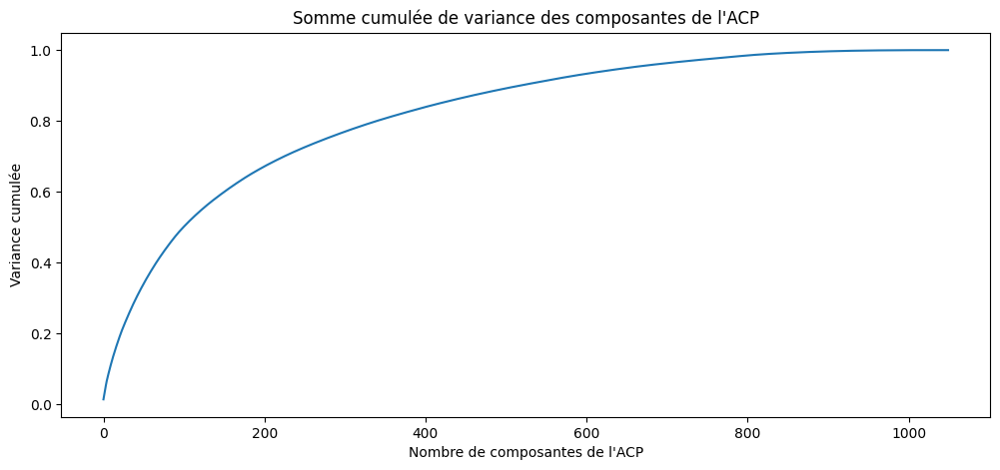

In [85]:
plt.figure(figsize=(12,5))
plt.title('Somme cumulée de variance des composantes de l\'ACP')
plt.xlabel('Nombre de composantes de l\'ACP')
plt.ylabel('Variance cumulée')
plt.plot(list(range(X.shape[0])),
         np.cumsum(pca.explained_variance_ratio_))

In [86]:
sum_pca = np.cumsum(pca.explained_variance_ratio_)
for counter, value in enumerate(sum_pca):
    if value > 0.80:
        X_reduce = pca.transform(X)[:,:counter]
        break
    

In [87]:
print('nombre de features : {}, variance : {}'.format(counter+1,np.cumsum(pca.explained_variance_ratio_)[counter]))

nombre de features : 341, variance : 0.8005382182865871


In [88]:
X_reduce.shape

(1050, 340)

In [89]:
X_reduce.shape

(1050, 340)

**Export**

In [90]:
np.save('X_reduce_NLP.csv', X_reduce)

**Données finales**

In [91]:
from ipywidgets import IntProgress
from ipywidgets import Text
from IPython.display import display
import time
#from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

In [92]:
#Attention processeur à 100% pendant 5 min
dict_kmeans_nlp = {}

inertia_nlp = {}

max_clusters_nlp=100


f = IntProgress(min=1, max=max_clusters_nlp) # instantiate the bar
chaine = str(1)+'/'+str(max_clusters_nlp)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters_nlp):
    kmeans_nlp = KMeans(n_clusters=k,
                   verbose=0,
                   random_state=0).fit(X_reduce)
    inertia_nlp[k] = kmeans_nlp.inertia_
    dict_kmeans_nlp[k] = kmeans_nlp
    f.value = k # signal to increment the progress bar
    g.value =str(k)+'/'+str(max_clusters_nlp)

IntProgress(value=1, min=1)

Text(value='1/100')

<AxesSubplot:title={'center':'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

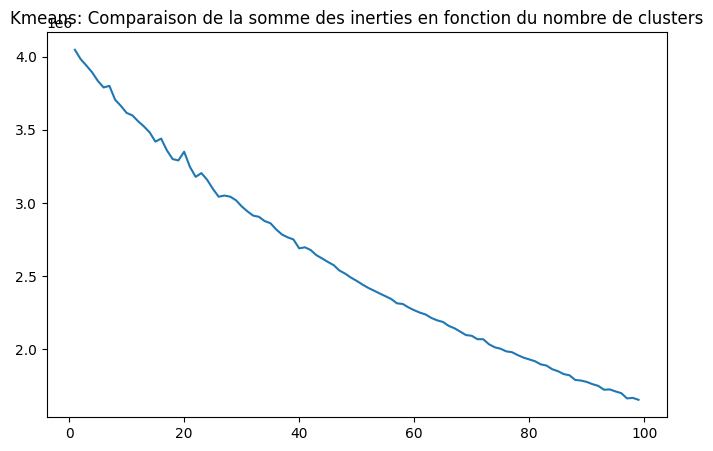

In [93]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(x=list(inertia_nlp.keys()),
             y=list(inertia_nlp.values())
            )

In [94]:
from sklearn.metrics import silhouette_score

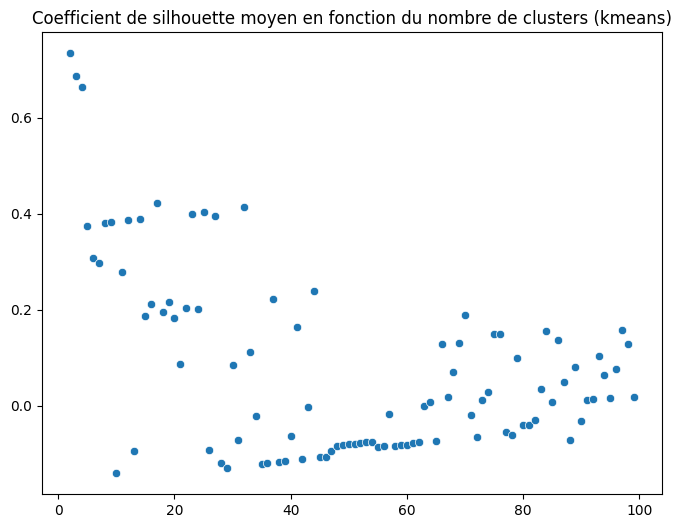

In [95]:
silhouettes_kmeans_nlp = {}
for i in range(2,max_clusters_nlp):
    silhouettes_kmeans_nlp[i] = silhouette_score(X = X_reduce,
                                             labels= list(dict_kmeans_nlp[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans_nlp.keys()),
               y = list(silhouettes_kmeans_nlp.values()))
plt.show()


In [96]:
for key, value in silhouettes_kmeans_nlp.items():
    if value == max(silhouettes_kmeans_nlp.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters_optimal = key

le coefficient de silhouette est maximal pour 2 clusters (score = 0.7340870196873119)


In [97]:
if nb_clusters_optimal < 5:
    nb_clusters_optimal = 10

In [98]:
dict_kmeans_nlp[nb_clusters_optimal]

KMeans(n_clusters=10, random_state=0)

In [99]:
train_nlp = pd.concat([train, test]).copy()
train_nlp['label_kmeans'] = dict_kmeans_nlp[nb_clusters_optimal].labels_

Comparaison des clusters par rapport aux catégories présentes dans le jeu de données de base

In [100]:
groups_cat_kmeans_nlp = train_nlp[['cat_lvl_1', 'label_kmeans']].groupby('label_kmeans')
val_presence = []
for i in range(1,nb_clusters_optimal):
    val_presence.append(groups_cat_kmeans_nlp.get_group(i).groupby('cat_lvl_1').count().sort_values(by='label_kmeans', ascending=False).iloc[0].tolist()[0]/groups_cat_kmeans_nlp.get_group(i).groupby('cat_lvl_1').count().sum().values.tolist()[0]*100)

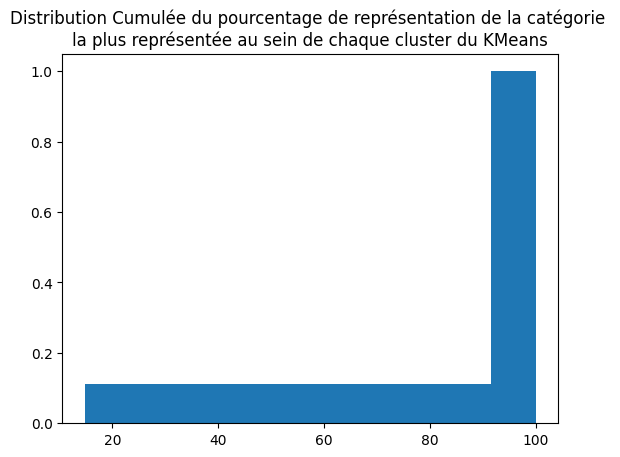

In [101]:
plt.title('Distribution Cumulée du pourcentage de représentation de la catégorie \nla plus représentée au sein de chaque cluster du KMeans')
plt.hist(val_presence,cumulative=True, density=True, bins=nb_clusters_optimal)
plt.show()

======================================================================= V2

<div class="alert alert-danger">
    <font id="section_PAR_2">
    <h1 style="font-size:25px;"><strong>Points à revoir item 2</strong></h1>
</div>

<p style="color:red;">Points a revoir:
- L'étudiant n'a pas utilisé les approches Word2Vec (ou Doc2Vec ou Glove ou FastText), BERT, et USE.</p>

### modèle : Word2Vec embedding

**Méthode Word2Vec**

**Word2vec** est un groupe de modèles utilisé pour le plongement lexical (word embedding). Ces modèles ont été développés par une équipe de recherche chez Google sous la direction de Tomas Mikolov. Ce sont des réseaux de neurones artificiels à deux couches entraînés pour reconstruire le contexte linguistique des mots. La méthode est implémentée dans la bibliothèque Python Gensim.

In [102]:
import string



In [103]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name', 'pid',
       'retail_price', 'discounted_price', 'image', 'is_FK_Advantage_product',
       'description', 'product_rating', 'overall_rating', 'brand',
       'product_specifications', 'cat_lvl_1', 'cat_lvl_2', 'cat_lvl_3'],
      dtype='object')

In [104]:
# Constitution du dataframe de travail
df_txt = data.copy()[['cat_lvl_1','product_name','description']]
df_txt.head(2)

,cat_lvl_1,product_name,description
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu..."


In [105]:
#Fusion des colonnes

df_txt['name_desc'] = df_txt['product_name']+' '+df_txt['description']
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...


### Traitement des descriptions

* Suppression des ponctuations                      
Supprimer tous les string.punctuation (! "# $% & '() * +, -. / :; <=>? @ [] ^ _` {|} ~).

In [106]:
def sup_punct(text):
    '''
    Removes punctuation from a string.

    Args:
        text (str): The string to remove punctuation from.

    Returns:
        str: The string with punctuation removed.
    '''

    import string as st

    return ("".join([ch for ch in text if ch not in st.punctuation]))


In [107]:
df_txt['remove_punc'] = df_txt['name_desc'].apply(lambda x:sup_punct(x))
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc,remove_punc
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel 3 Ba...


In [108]:
import re

def give_emoji_free_text(text):
    '''
    Función para eliminar los emojis del texto.
    '''
    # Patrón de expresión regular para identificar emojis
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticonos
                               u"\U0001F300-\U0001F5FF"  # símbolos y pictogramas
                               u"\U0001F680-\U0001F6FF"  # transporte y mapa de símbolos
                               u"\U0001F700-\U0001F77F"  # alquimia
                               u"\U0001F780-\U0001F7FF"  # jugando a las cartas
                               u"\U0001F800-\U0001F8FF"  # alfabeto árabe
                               u"\U0001F900-\U0001F9FF"  # símbolos de la región
                               u"\U0001FA00-\U0001FA6F"  # emojis adicionales
                               u"\U0001FA70-\U0001FAFF"  # símbolos de alimentos
                               u"\U00002702-\U000027B0"  # símbolos diversos
                               u"\U000024C2-\U0001F251"
                               "]+", flags=re.UNICODE)
    
    # Eliminar emojis utilizando el patrón de expresión regular
    clean_text = emoji_pattern.sub(r'', text)
    
    return clean_text


In [109]:
def pre_traite(com):
    com = re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|''(?:%[0-9a-fA-F][0-9a-fA-F]))+',"", com)
    com = re.sub("(@[A-Za-z0-9_]+)","", com)
    com = re.sub("(#[A-Za-z0-9_]+)","", com)
    com = give_emoji_free_text(com)
    
    res = ''.join(i for i in com if not i.isdigit())   # sup les chiffres
    return(res)

In [110]:
df_txt['remove_emoj'] = df_txt['name_desc'].apply(lambda x:give_emoji_free_text(x))
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel 3 Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...


In [111]:
df_txt['remove_punc'] = df_txt['remove_emoj'].apply(lambda x:pre_traite(x))
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...


In [112]:
def tokenize(text):
    '''
    Convert text to lower case tokens. Here, split() is applied on white-spaces. But,
    it could be applied on special characters, tabs or any other string based on which
    text is to be seperated into tokens.
    
    '''
    text = re.split('\s+' ,text)
    return [x.lower() for x in text]

In [113]:
# tokonize

df_txt['tokens'] = df_txt['remove_punc'].apply(lambda x : word_tokenize(x))
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat..."
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, of, Sathiyas, Cotton, Bath, ..."


- **Suppression les mots de taille < 2** 

In [114]:
def remove_small_words(text):
    '''
    Suppression les mots de taille <2 
    '''
    return [x for x in text if len(x) >2 ]


In [115]:
df_txt['tokens'] = df_txt['tokens'].apply(lambda x : remove_small_words(x))
df_txt.head(3)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat..."
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe..."
2,Baby Care,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 in...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,"[Eurospa, Cotton, Terry, Face, Towel, Set, Key, Features, Eurospa, Cotton, T..."


- **Suppression des stopwords**

Les stopwords sont des mots qui apparaissent très fréquemment mais qui n'ajoutent pas de sens à la phrase.

In [116]:
def remove_stopwords(text):
    ''' 
     la liste du corpus NLTK est utilisée pour une correspondance. Cependant, une liste personnalisée
    personnalisée définie par l'utilisateur pourrait être créée et utilisée pour limiter
    les correspondances dans le texte d'entrée. 
    '''
    return [word for word in text if word not in nltk.corpus.stopwords.words('english')]

In [117]:
# No_stopwords

#stop = stopwords.words('english')
df_txt['net_tokens'] = df_txt['tokens'].apply(lambda x:remove_stopwords(x))
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens,net_tokens
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat..."
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe..."


- **Stemming**

La racinisation(ou stemming en anglais) consiste à ne conserver que la racine des mots étudiés.


L'idée étant de supprimer les suffixes, préfixes et autres des mots afin de ne conserver que leur origine.

In [118]:
from nltk.stem import PorterStemmer

def stemming(text):
    '''
    Apply stemming to get root words
    '''
    ps = PorterStemmer()
    return [ps.stem(word) for word in text]

In [119]:
df_txt['stem_words'] = df_txt['net_tokens'].apply(lambda x:stemming(x))
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens,net_tokens,stem_words
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el..."
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t..."


- **Lemmatization**

Le processus de lemmatisation consiste à représenter les mots (ou lemmes) sous leur forme canonique pour ne conserver que le sens des mots utilisés dans le corpus. (https://stackoverflow.com/questions/47557563/lemmatization-of-all-pandas-cells)

In [120]:
def lemmatize(text):
    '''
    Apply lemmatization on tokens
    '''
    word_net = WordNetLemmatizer()
    return [word_net.lemmatize(word) for word in text]

In [121]:
df_txt['lem_words'] = df_txt['stem_words'].apply(lambda x:lemmatize(x))
df_txt.head(2)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens,net_tokens,stem_words,lem_words
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el..."
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t..."


In [122]:
def return_sentences(tokens):
    '''
    Create sentences to get clean text as input for vectors
    '''
    return " ".join([word for word in tokens])

In [123]:
df_txt['clean_text'] = df_txt['lem_words'].apply(lambda x : return_sentences(x))
df_txt.head(3)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens,net_tokens,stem_words,lem_words,clean_text
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el...",eleg polyest multicolor abstract eyelet door curtain key featur eleg polyest...
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t...",sathiya cotton bath towel specif sathiya cotton bath towel bath towel red ye...
2,Baby Care,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 in...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,"[Eurospa, Cotton, Terry, Face, Towel, Set, Key, Features, Eurospa, Cotton, T...","[Eurospa, Cotton, Terry, Face, Towel, Set, Key, Features, Eurospa, Cotton, T...","[eurospa, cotton, terri, face, towel, set, key, featur, eurospa, cotton, ter...","[eurospa, cotton, terri, face, towel, set, key, featur, eurospa, cotton, ter...",eurospa cotton terri face towel set key featur eurospa cotton terri face tow...


<div class="alert alert-danger">
    <font id="section_PAR_5">
    <h1 style="font-size:25px;"><strong>Points à revoir item 5</strong></h1>
</div>

<p style="color:red;">Aucune technique d'augmentation de données n'est utilisée.</p>

pip install nlpaug

In [124]:
import nlpaug.augmenter.word as naw

In [125]:
# Définir la fonction de routine d'augmentation de données
def augment_data(text):
    '''
    Créer un augmenteur de données avec la technique de "sinonymes"
    '''
    aug = naw.SynonymAug(aug_src='wordnet', aug_p=0.3)
    
    # Générer des données augmentées
    augmented_text = aug.augment(text)
    
    return augmented_text

In [126]:
df_txt['augmented_data'] = df_txt['net_tokens'].apply(lambda x : augment_data(x))
df_txt.head(3)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens,net_tokens,stem_words,lem_words,clean_text,augmented_data
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el...",eleg polyest multicolor abstract eyelet door curtain key featur eleg polyest...,"[Elegance, Polyester, Multicolor, Precis, Cringle, Threshold, Drape, Florida..."
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t...",sathiya cotton bath towel specif sathiya cotton bath towel bath towel red ye...,"[Sathiyas, Cotton wool, Tub, Towel, Specification, Sathiyas, Cotton wool, Tu..."
2,Baby Care,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 in...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,"[Eurospa, Cotton, Terry, Face, Towel, Set, Key, Features, Eurospa, Cotton, T...","[Eurospa, Cotton, Terry, Face, Towel, Set, Key, Features, Eurospa, Cotton, T...","[eurospa, cotton, terri, face, towel, set, key, featur, eurospa, cotton, ter...","[eurospa, cotton, terri, face, towel, set, key, featur, eurospa, cotton, ter...",eurospa cotton terri face towel set key featur eurospa cotton terri face tow...,"[Eurospa, Cotton wool, Terrycloth, Grimace, Towel, Seth, Paint, Feature of s..."


 ### Features à créer à partir du description :
 
Chaque modèle a des requisites différents :

- sentence_bow : descriptions en minuscule, sans mots inutiles, mais pas lemmatizés pour BOW (Bag-of-Words) et TF-IDF (term frequency-inverse document frequency)


On utilisera ces 'bag-of-words' pour les 'baseline' model


- sentence_bow_lem : traitement de sentence_bow, lemmatizés pour BOW, TF-IDF et Word2Vec
- sentence_dl : descriptions nettoyées

## conversion des mots en vecteurs de features


Nous allons extraire les features en utilisant les méthodes suivantes:

- Bag of Words (BOW)
- Term Frequency - Inverse Document Frequency (TF-IDF)

Nous allons comparer les résultats obtenus avec chacune de ces transformations.

### Transformation en matrice BOW

La méthode BOW consiste à créer un dataframe avec des colonnes pour chaque mot différent présent dans le corpus et d'indiquer le nombre de fois qu'il apparait dans chaque description de chaque article. Donc, nous créons un histogramme de l'apparition des mots dans l'ensemble des descriptions.

In [127]:
bow = CountVectorizer()
bow_vect = bow.fit_transform(df_txt['clean_text']).toarray()
bow_vect.shape

(1050, 4230)

In [128]:
# Dataframe in BOW 
bow_ft = bow.get_feature_names()
bow_df = pd.DataFrame(bow_vect , columns=bow_ft)
print(bow_df.shape)


(1050, 4230)


In [129]:
# Obtener las 50 palabras más comunes y sus frecuencias
top_50_words = bow_df.sum(axis=0).sort_values(ascending=False)[:50]

# Crear una lista con las palabras y sus frecuencias
common_words_list = []
for word, frequency in top_50_words.iteritems():
    common_words_list.append((word, frequency))

# Mostrar la lista
print("Las 50 palabras más comunes (BOW):")
for i, (word, frequency) in enumerate(common_words_list, start=1):
    print(f"{i}. Word : {word}, Frecuencia: {frequency}")


Las 50 palabras más comunes (BOW):
1. Word : product, Frecuencia: 871
2. Word : for, Frecuencia: 770
3. Word : onli, Frecuencia: 719
4. Word : free, Frecuencia: 618
5. Word : buy, Frecuencia: 582
6. Word : replac, Frecuencia: 579
7. Word : ship, Frecuencia: 570
8. Word : deliveri, Frecuencia: 567
9. Word : genuin, Frecuencia: 564
10. Word : cash, Frecuencia: 564
11. Word : price, Frecuencia: 560
12. Word : day, Frecuencia: 556
13. Word : mug, Frecuencia: 533
14. Word : watch, Frecuencia: 511
15. Word : flipkart, Frecuencia: 481
16. Word : com, Frecuencia: 473
17. Word : guarante, Frecuencia: 473
18. Word : set, Frecuencia: 457
19. Word : design, Frecuencia: 428
20. Word : babi, Frecuencia: 415
21. Word : featur, Frecuencia: 408
22. Word : color, Frecuencia: 396
23. Word : onlin, Frecuencia: 396
24. Word : analog, Frecuencia: 393
25. Word : specif, Frecuencia: 380
26. Word : the, Frecuencia: 361
27. Word : cotton, Frecuencia: 354
28. Word : pack, Frecuencia: 353
29. Word : print, Frecue

### Transformation en matrice TF-IDF

Le Term frequency-inverse document frequency (TF-IDF) est un modèle qui pondère les mots compte par une mesure de la fréquence à laquelle elles apparaissent dans le corpus. Il s'agit d'un statistique numérique destiné à refléter l'importance d'un mot ; c'est comme un facteur de pondération.

La valeur TF-IDF augmente proportionnellement au nombre de fois qu'un mot apparaît dans le corpus et est compensée par le nombre de documents dans le corpus qui contiennent le mot, ce qui permet d'ajuster le fait que certains mots apparaissent plus fréquemment en général.

In [130]:
tfidf = TfidfVectorizer()
tfidf_vect = tfidf.fit_transform(df_txt['clean_text']).toarray()
tfidf_vect.shape

(1050, 4230)

In [131]:
# Dataframe in TF-IDF form
tokens = tfidf.get_feature_names()
tfidf_df = pd.DataFrame(tfidf_vect, columns=tokens)
print(tfidf_df.shape)

(1050, 4230)


In [132]:
# Obtener las 50 palabras más comunes y sus puntajes tf-idf
top_50_words_tfidf = tfidf_df.sum(axis=0).sort_values(ascending=False)[:50]

# Crear una lista con las palabras y sus puntajes tf-idf
common_words_list_tfidf = []
for word, tfidf_score in top_50_words_tfidf.iteritems():
    common_words_list_tfidf.append((word, tfidf_score))

# Mostrar la lista
print("Las 50 palabras más comunes (tf-idf):")
for i, (word, tfidf_score) in enumerate(common_words_list_tfidf, start=1):
    print(f"{i}. Word: {word}, Puntaje tf-idf: {tfidf_score}")


Las 50 palabras más comunes (tf-idf):
1. Word: watch, Puntaje tf-idf: 37.55840585522489
2. Word: onli, Puntaje tf-idf: 35.504122941895666
3. Word: com, Puntaje tf-idf: 33.5970591944204
4. Word: flipkart, Puntaje tf-idf: 33.45636540674665
5. Word: for, Puntaje tf-idf: 32.92598256335577
6. Word: analog, Puntaje tf-idf: 31.73247673082228
7. Word: product, Puntaje tf-idf: 30.894570873476525
8. Word: ship, Puntaje tf-idf: 29.44826694277377
9. Word: free, Puntaje tf-idf: 29.40203914440122
10. Word: cash, Puntaje tf-idf: 29.393848887040253
11. Word: genuin, Puntaje tf-idf: 29.393848887040253
12. Word: deliveri, Puntaje tf-idf: 29.362928948478896
13. Word: buy, Puntaje tf-idf: 29.244747850724575
14. Word: set, Puntaje tf-idf: 28.62508528231919
15. Word: mug, Puntaje tf-idf: 28.498415154804913
16. Word: day, Puntaje tf-idf: 26.67371417056624
17. Word: replac, Puntaje tf-idf: 26.44231669457235
18. Word: guarante, Puntaje tf-idf: 25.61115467181502
19. Word: babi, Puntaje tf-idf: 23.36184590253174

<div class="alert alert-danger">
    <font id="section_ACP_1">
    <h1 style="font-size:25px;"><strong>REDUCTION DE DIMENSION 1</strong></h1>
</div>



[Explications 6.1 ACP](#section_6_1) 

Nous allons utiliser 2 techniques :

- Analyse en Composantes Principales (ACP)
- t-distributed stochastic neighbor embedding (t-SNE)

- **PCA**


La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99% dans notre cas)

**BOW**

In [133]:
print("Dimensions dataset avant réduction PCA : ", bow_vect.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_bow= pca.fit_transform(bow_vect)
print("Dimensions dataset après réduction PCA : ", pca_results_bow.shape)

Dimensions dataset avant réduction PCA :  (1050, 4230)
Dimensions dataset après réduction PCA :  (1050, 666)


**TF-IDF**

In [134]:
print("Dimensions dataset avant réduction PCA : ", tfidf_vect.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_tfidf= pca.fit_transform(tfidf_vect)
print("Dimensions dataset après réduction PCA : ", pca_results_tfidf.shape)

Dimensions dataset avant réduction PCA :  (1050, 4230)
Dimensions dataset après réduction PCA :  (1050, 821)


### TSNE


Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des textes


**BOW**

In [135]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bow = tsne.fit_transform(pca_results_bow)

df_tsne_bow = pd.DataFrame(tsne_results_bow[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_bow["class"] = df_txt["cat_lvl_1"]
print(df_tsne_bow.shape)

(1050, 3)


 - **Visualisation**
 
 
Affichage T-SNE selon les catégories d'images

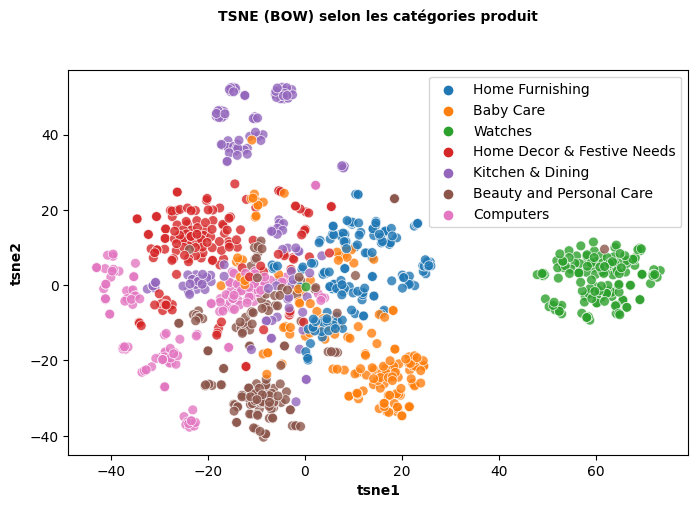

In [136]:
plt.figure(figsize=(8, 5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_bow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BOW) selon les catégories produit', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 10, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 10, fontweight = 'bold')
plt.legend(prop={'size': 10}) 

plt.show()

**TF-IDF**

In [137]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_tfidf = tsne.fit_transform(pca_results_tfidf)

df_tsne_tfidf = pd.DataFrame(tsne_results_tfidf[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_tfidf["class"] = df_txt["cat_lvl_1"]
print(df_tsne_tfidf.shape)

(1050, 3)


 - **Visualisation**
 
 
Affichage T-SNE selon les catégories d'images

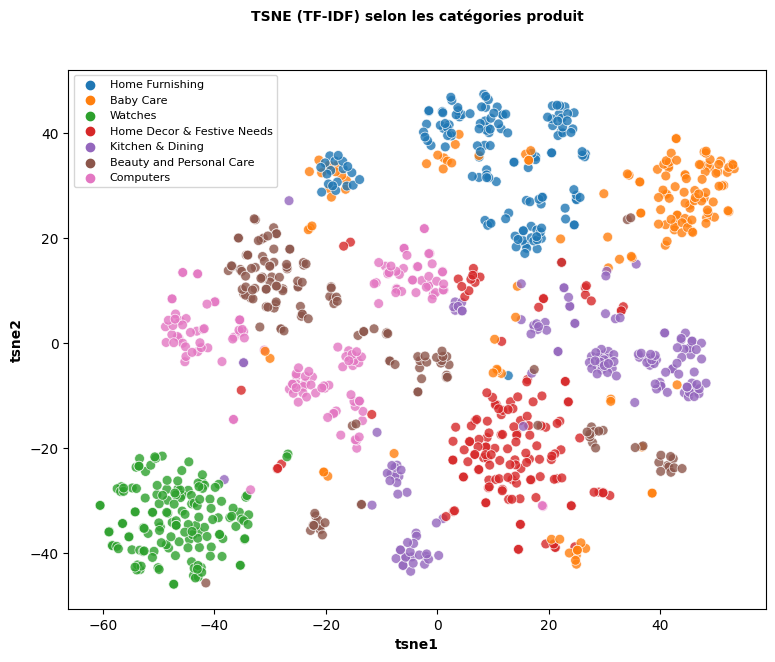

In [138]:
plt.figure(figsize=(9,7))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_tfidf, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (TF-IDF) selon les catégories produit', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 10, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 10, fontweight = 'bold')
plt.legend(prop={'size': 8}) 

plt.show()


## CLUSTERING

In [139]:
df_resultats = pd.DataFrame()

def add_model_score(df: pd.DataFrame = None, model_name: str = 'none', ARI: float = 0, **kwargs):
    global df_resultats
    if df is None:
        df = df_resultats
    """ajout les resultats d'un model """
    resultats = dict(model=model_name, ARI=ARI)
    resultats = dict(**resultats, **kwargs)
    df = df.append(resultats, ignore_index=True)
    return df

In [140]:
N_CLUSTERS = 7 # On a 7 catégories produit

 # modèle 1 BOW

In [141]:
#Création de clusters à partir du T-SNE 
X = df_tsne_bow[["tsne1","tsne2"]]

cls = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_bow["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("---------------------------")
print("Le score de silhouette est",round( sil,2))
print("---------------------------")

---------------------------
Le score de silhouette est 0.47
---------------------------


#### Calcul du Score ARI

Pour mesurer l'erreur de notre moteur de classification, nous allons utiliser la métrique ARI via la fonction
**adjusted_rand_score** de sklearn.


L'adjusted_rand_score calcule une mesure de similarité entre deux groupements en considérant toutes les paires d'échantillons
et en comptant les paires qui sont assignées dans le même groupement ou dans des groupements différents dans les groupements prédits et réels.


Le score ARI va de 0 pour un étiquetage aléatoire à 1 pour un étiquetage parfait.

In [142]:
# Création des labels à partir du nom de catégorie produit
le = preprocessing.LabelEncoder()
df_txt["label"] = le.fit_transform(df_txt["cat_lvl_1"])
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{'Baby Care': 0, 'Beauty and Personal Care': 1, 'Computers': 2, 'Home Decor & Festive Needs': 3, 'Home Furnishing': 4, 'Kitchen & Dining': 5, 'Watches': 6}


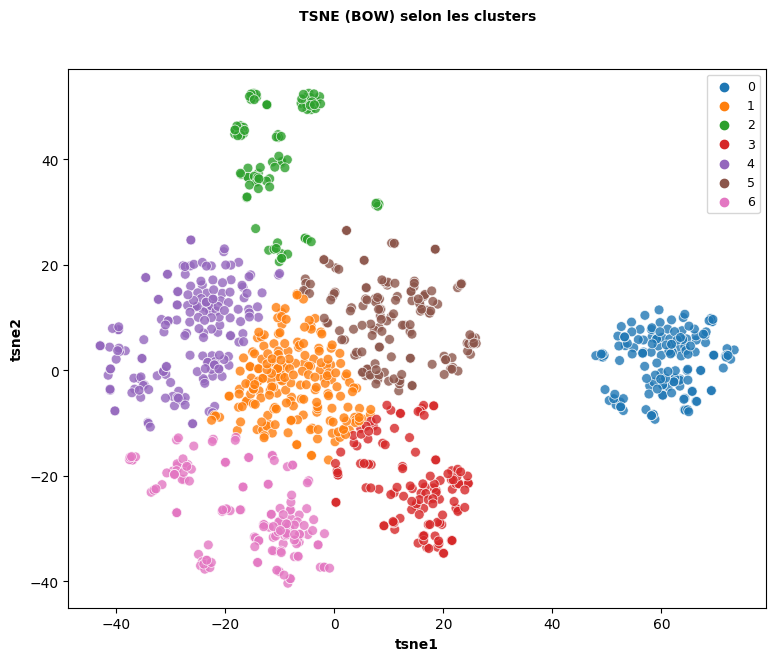

ARI  :  0.429317565972148


In [143]:
#Affichage des images selon clusters et calcul ARI de similarité catégories produit / clusters
plt.figure(figsize=(9,7))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_bow,
    legend="brief")

plt.title('TSNE (BOW) selon les clusters', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 10, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 10, fontweight = 'bold')
plt.legend(prop={'size': 9}) 

plt.show()

labels = df_txt["label"]
print("ARI  : ", metrics.adjusted_rand_score(labels, cls.labels_))

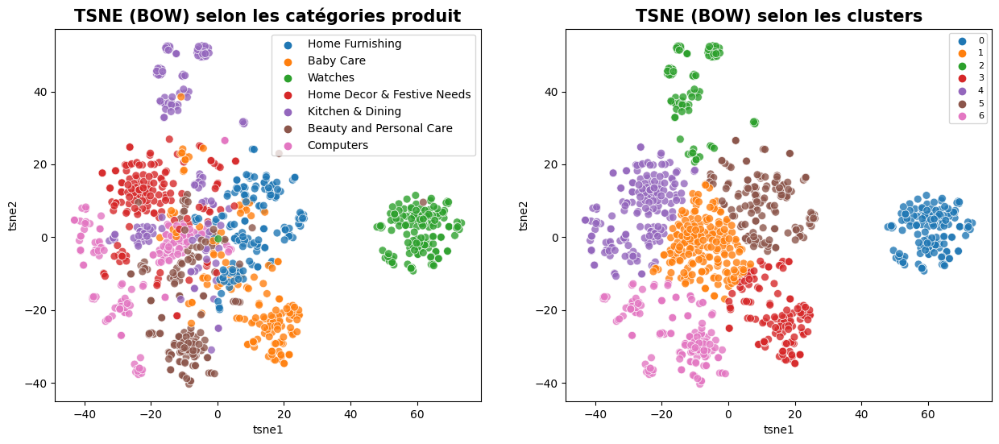

---------------------------
ARI :  0.429
---------------------------


In [144]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_bow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BOW) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
data=df_tsne_bow,
legend="brief")

plt.title('TSNE (BOW) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()
ARI_bow=round( metrics.adjusted_rand_score(labels, cls.labels_),3)
labels = df_txt["label"]
print("---------------------------")
print(f"ARI : ",ARI_bow)
print("---------------------------")
df_resultats = add_model_score(
    model_name='BOW ', ARI=ARI_bow)

In [145]:
df_resultats

,model,ARI
0,BOW,0.429


- **Qualité de la catégorisation**

**répartition des vraies catégories par cluster**

In [146]:
# Fonction pour afficher la répartition des vraies catégories par cluster

def plot_clust_vs_cat(ser_clust, ser_cat, data, figsize=(8,4),
                                  palette='tab10', ylim=(0,250),
                                  bboxtoanchor=None):
    
    # pivot = data.drop(columns=['description','image'])
    pivot = pd.DataFrame()
    pivot['label']=ser_clust
    pivot['category']=ser_cat
    pivot['count']=1
    pivot = pivot.groupby(by=['label','category']).count().unstack().fillna(0)
    pivot.columns=pivot.columns.droplevel()
    
    colors = sns.color_palette(palette, ser_clust.shape[0]).as_hex()
    pivot.plot.bar(width=0.8,stacked=True,legend=True,figsize=figsize,
                   color=colors, ec='k')

    row_data=data.shape[0]

    if ser_clust.nunique() > 15:
        font = 8 
    else : 
        font = 12

    for index, value in enumerate(ser_clust.value_counts().sort_index(ascending=True)):
        percentage = np.around(value/row_data*100,1)   
        plt.text(index-0.25, value+2, str(percentage)+' %',fontsize=font)

    plt.gca().set(ylim=ylim)
    plt.xticks(rotation=0) 

    plt.xlabel('Clusters',fontsize=14)
    plt.ylabel('Nombre de produits', fontsize=10)
    plt.title('Répartition des vraies catégories par cluster',
              fontweight='bold', fontsize=10)

    if bboxtoanchor is not None:
        plt.legend(bbox_to_anchor=bboxtoanchor)
        
    plt.show()    
    
    return pivot

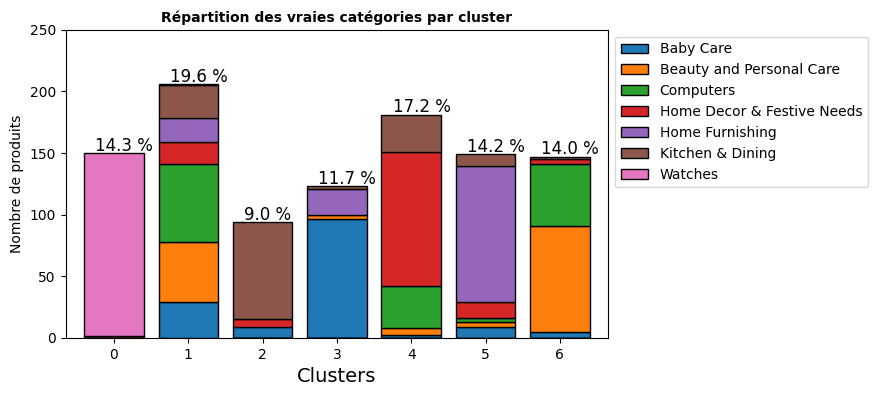

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,0.0,1.0,0.0,0.0,0.0,0.0,149.0
1,29.0,49.0,63.0,18.0,19.0,27.0,1.0
2,9.0,0.0,0.0,6.0,0.0,79.0,0.0
3,96.0,4.0,0.0,0.0,21.0,2.0,0.0
4,2.0,6.0,34.0,109.0,0.0,30.0,0.0
5,9.0,4.0,3.0,13.0,110.0,10.0,0.0
6,5.0,86.0,50.0,4.0,0.0,2.0,0.0


In [147]:
plot_clust_vs_cat(df_tsne_bow["cluster"],
                              df_tsne_bow["class"],
                              df_tsne_bow,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

In [148]:
def confusion_matrix(y_true, y_pred, title):
    """ xxx
    Args:
        y_true list(str):
        y_pred list(int):
        title (str): 
    Returns:
        -
    """
    # Create a DataFrame with labels and varieties as columns: df
    df = pd.DataFrame({'Labels': y_true, 'Clusters': y_pred})

    # Create crosstab: ct
    ct = pd.crosstab(df['Labels'], df['Clusters'])

    # plot the heatmap for correlation matrix
    fig, ax = plt.subplots(figsize=(5,5))

    sns.heatmap(ct.T, 
                 square=True, 
                 annot=True, 
                 annot_kws={"size": 7},
                 fmt='.2f',
                 cmap='Blues',
                 cbar=False,
                 ax=ax)

    ax.set_title(title, fontsize=9)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=9)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha="right", fontsize=9)
    ax.set_ylabel("clusters", fontsize=10)
    ax.set_xlabel("labels", fontsize=10)

    plt.show()


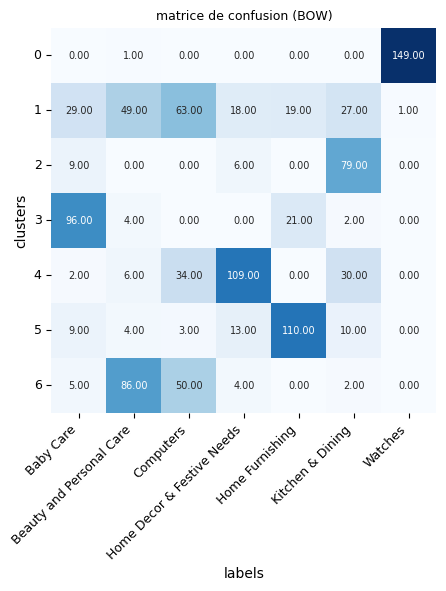

In [149]:
confusion_matrix(df_tsne_bow["class"], df_tsne_bow["cluster"], 'matrice de confusion (BOW)')

 # modèle 2 TF-IDF

In [150]:
#Création de clusters à partir du T-SNE 
X = df_tsne_tfidf[["tsne1","tsne2"]]

cls_tfidf = KMeans(n_clusters=N_CLUSTERS, init='k-means++')
cls_tfidf.fit(X)

df_tsne_tfidf["cluster"] = cls_tfidf.labels_

sil = silhouette_score(X,cls_tfidf.labels_,metric="euclidean")
print("---------------------------")
print("Le score de silhouette est",round( sil,2))
print("---------------------------")

---------------------------
Le score de silhouette est 0.48
---------------------------


In [151]:
df_tsne_tfidf.head(2)

,tsne1,tsne2,class,cluster
0,15.86193,18.81023,Home Furnishing,1
1,-18.14910,33.83754,Baby Care,6


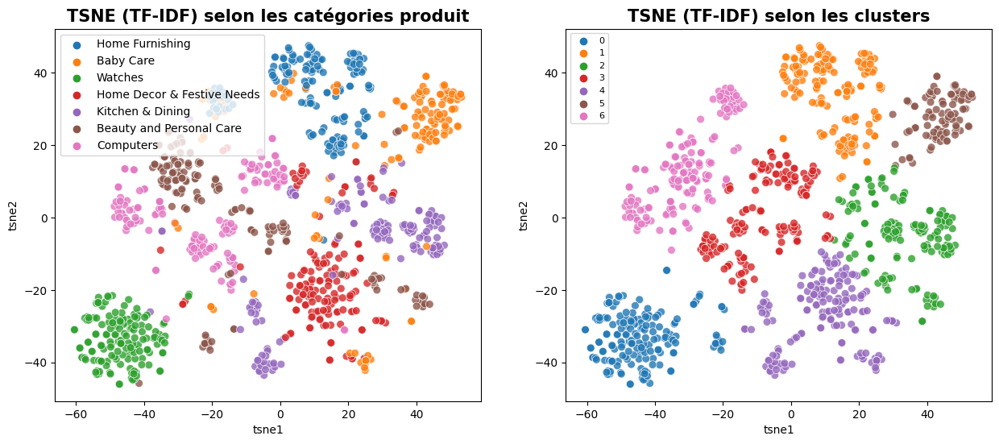

---------------------------
ARI :  0.503
---------------------------


In [152]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_tfidf, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (TF-IDF) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
data=df_tsne_tfidf,
legend="brief")

plt.title('TSNE (TF-IDF) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()
ARI_tf_idf=round( metrics.adjusted_rand_score(labels, cls_tfidf.labels_),3)
labels = df_txt["label"]
print("---------------------------")
print(f"ARI : ",ARI_tf_idf)
print("---------------------------")
df_resultats = add_model_score(
    model_name='TF-IDF ', ARI=ARI_tf_idf)

- **Qualité de la catégorisation**

**répartition des vraies catégories par cluster**>

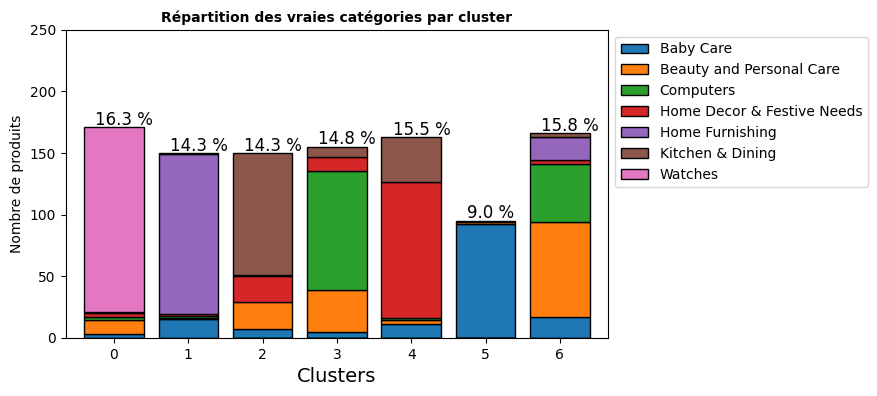

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,3.0,11.0,3.0,3.0,0.0,1.0,150.0
1,15.0,1.0,2.0,1.0,130.0,1.0,0.0
2,7.0,22.0,0.0,21.0,1.0,99.0,0.0
3,5.0,34.0,96.0,12.0,0.0,8.0,0.0
4,11.0,3.0,2.0,110.0,0.0,37.0,0.0
5,92.0,2.0,0.0,0.0,0.0,1.0,0.0
6,17.0,77.0,47.0,3.0,19.0,3.0,0.0


In [153]:
plot_clust_vs_cat(df_tsne_tfidf["cluster"],
                              df_tsne_tfidf["class"],
                              df_tsne_tfidf,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

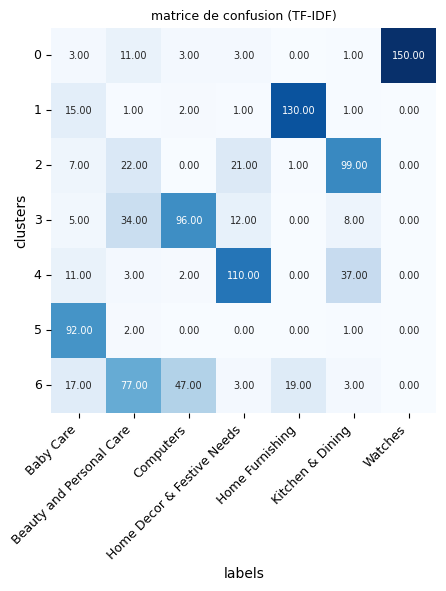

In [154]:
confusion_matrix(df_tsne_tfidf["class"], df_tsne_tfidf["cluster"], 'matrice de confusion (TF-IDF)')

 # modèle 3: Word2Vec embedding

**Méthode Word2Vec**


Word2vec est un groupe de modèles utilisé pour le plongement lexical (word embedding). Ces modèles ont été développés par une équipe de recherche chez Google sous la direction de Tomas Mikolov. Ce sont des réseaux de neurones artificiels à deux couches entraînés pour reconstruire le contexte linguistique des mots. La méthode est implémentée dans la bibliothèque Python Gensim.

In [155]:
 import gensim

In [156]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = df_txt['clean_text'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [157]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4220
Word2Vec trained


In [158]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [159]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4221


- **Création de la matrice d'embedding**

In [160]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4221, 300)


In [161]:
def creer_vecteur_moyen_par_mot(data, text_dim, w2v_model):

    vect_moy = np.zeros((text_dim,), dtype='float32')
    num_words = 0.

    for word in data.split():
        if word in w2v_model.wv.vocab:
            vect_moy = np.add(vect_moy, w2v_model[word])
            num_words += 1.

    if num_words != 0.:
        vect_moy = np.divide(vect_moy, num_words)

    return vect_moy

- **Création du modèle d'embedding**

In [162]:
from keras.layers import Input
from keras.layers import Embedding
from keras.layers import GlobalAveragePooling1D
from keras.models import Model

In [163]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding (Embedding)       (None, 24, 300)           1266300   
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 1,266,300
Trainable params: 1,266,300
Non-trainable params: 0
_________________________________________________________________


- **Exécution du modèle**

In [164]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 2ms/step


(1050, 300)

<div class="alert alert-danger">
    <font id="section_ACP_2">
    <h1 style="font-size:25px;"><strong>REDUCTION DE DIMENSION 2</strong></h1>
</div>


[Explications 6.1 ACP](#section_6_1) 

- **ACP**

In [165]:
print("Dimensions dataset avant réduction PCA : ", embeddings.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_word2vec= pca.fit_transform(embeddings)
print("Dimensions dataset après réduction PCA : ", pca_results_word2vec.shape)

Dimensions dataset avant réduction PCA :  (1050, 300)
Dimensions dataset après réduction PCA :  (1050, 62)


- **T_SNE**

In [166]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_word2vec = tsne.fit_transform(pca_results_word2vec)

df_tsne_word2vec = pd.DataFrame(tsne_results_word2vec[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_word2vec["class"] = df_txt["cat_lvl_1"]

print(df_tsne_word2vec.shape)

(1050, 3)


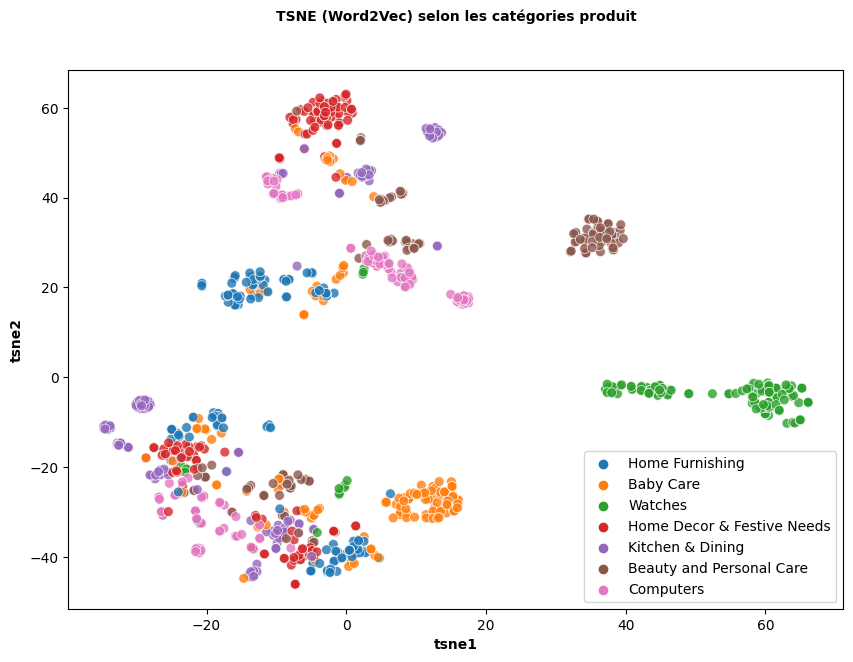

In [167]:
plt.figure(figsize=(10,7))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_word2vec, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (Word2Vec) selon les catégories produit', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 10, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 10, fontweight = 'bold')
plt.legend(prop={'size': 10}) 

plt.show()

In [168]:
#Création de clusters à partir du T-SNE 
X = df_tsne_word2vec[["tsne1","tsne2"]]

cls_Word2Vec = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_Word2Vec.fit(X)

df_tsne_word2vec["cluster"] = cls_Word2Vec.labels_

sil = np.round(silhouette_score(X,cls_Word2Vec.labels_,metric="euclidean"),2)
print("---------------------------")
print("Le score de silhouette est", sil)
print("---------------------------")

---------------------------
Le score de silhouette est 0.57
---------------------------


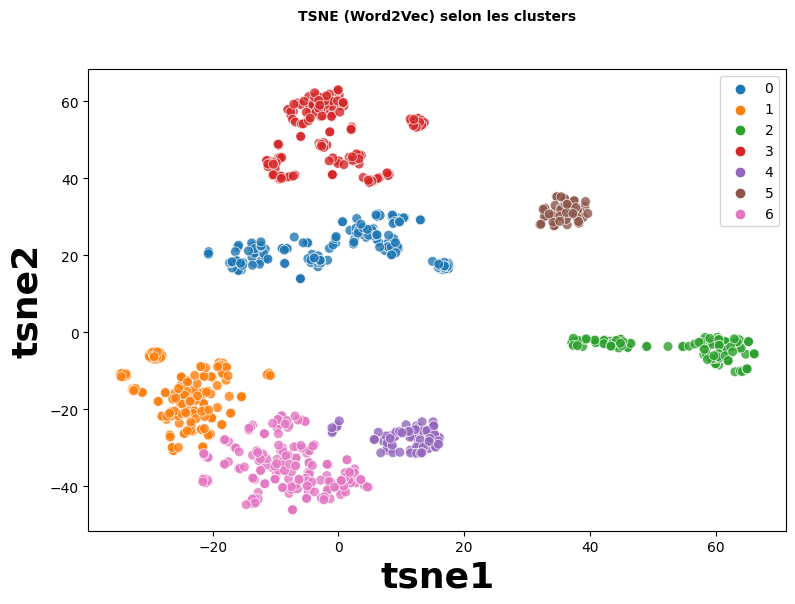

---------------------------
ARI :  0.252
---------------------------


In [169]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(9,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_word2vec,
    legend="brief")

plt.title('TSNE (Word2Vec) selon les clusters', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 10}) 

plt.show()
ARI_Word2Vec=np.round(metrics.adjusted_rand_score(labels, cls_Word2Vec.labels_),3)
labels = df_txt["label"]
print("---------------------------")
print("ARI : ",ARI_Word2Vec)
print("---------------------------")


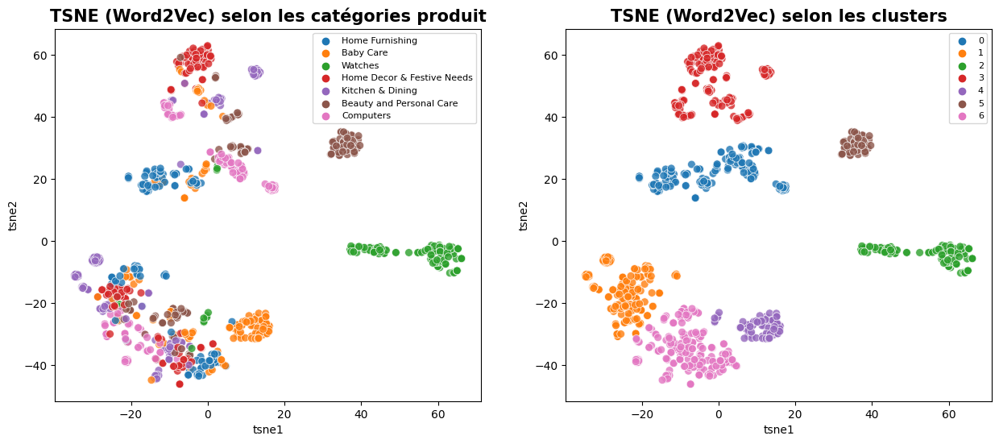

---------------------------
ARI :  0.252
---------------------------


In [170]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_word2vec, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (Word2Vec) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 


ax = fig.add_subplot(122)
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_word2vec,
    legend="brief")

plt.title('TSNE (Word2Vec) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()


ARI_Word2Vec=np.round(metrics.adjusted_rand_score(labels, cls_Word2Vec.labels_),3)

print("---------------------------")
print("ARI : ",ARI_Word2Vec)
print("---------------------------")
df_resultats = add_model_score(
    model_name='Word2Vec ', ARI=ARI_Word2Vec)

In [171]:
df_tsne_word2vec.groupby("cluster").count()["class"]

cluster
0    194
1    180
2    131
3    183
4     85
5     61
6    216
Name: class, dtype: int64

- **Qualité de la catégorisation**

**répartition des vraies catégories par cluster**

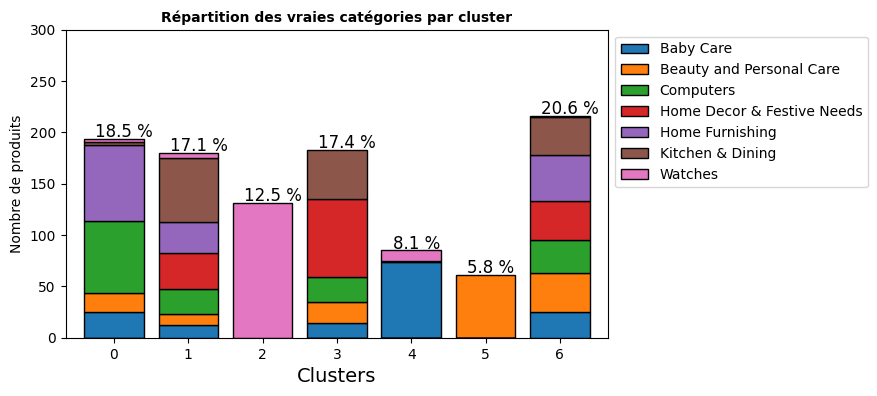

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,25.0,19.0,70.0,0.0,74.0,3.0,3.0
1,12.0,11.0,24.0,36.0,30.0,62.0,5.0
2,0.0,0.0,0.0,0.0,0.0,0.0,131.0
3,14.0,21.0,24.0,76.0,0.0,48.0,0.0
4,74.0,0.0,0.0,0.0,1.0,0.0,10.0
5,0.0,61.0,0.0,0.0,0.0,0.0,0.0
6,25.0,38.0,32.0,38.0,45.0,37.0,1.0


In [172]:
plot_clust_vs_cat(df_tsne_word2vec["cluster"],
                              df_tsne_word2vec["class"],
                              df_tsne_word2vec,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

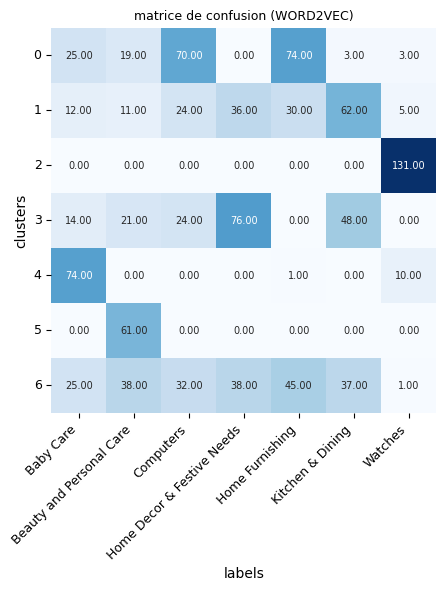

In [173]:
confusion_matrix(df_tsne_word2vec['class'], df_tsne_word2vec['cluster'], 'matrice de confusion (WORD2VEC)')

### BERT

### Création de feature sentence_dl pour deep learning


Les modèles de deep learning comme BERT et USE traitent les mots dans le contexte de leurs phrases

- BERT : Bidirectional Encoder Representations from Transformers
- USE : Universal Sentence Encoder


Avec BERT et USE, il ne faut pas trop traiter les textes, sinon, on perdre le contexte (racine, lemmatisation) ou modifier purement et simplement les textes (suppression des mots vides).

Les descriptions des produits semblent déjà traités, donc on essaie d'eviter de supprimer les stopwords et lemmatization.

In [174]:
# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    lw = lower_start_fct(desc_text)
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

In [175]:
df_txt['sentence_dl'] = df_txt['net_tokens'].apply(lambda x : transform_dl_fct(x))
df_txt.head(3)

,cat_lvl_1,product_name,description,name_desc,remove_punc,remove_emoj,tokens,net_tokens,stem_words,lem_words,clean_text,augmented_data,label,sentence_dl
0,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of E...,"[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Key, Feat...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el...","[eleg, polyest, multicolor, abstract, eyelet, door, curtain, key, featur, el...",eleg polyest multicolor abstract eyelet door curtain key featur eleg polyest...,"[Elegance, Polyester, Multicolor, Precis, Cringle, Threshold, Drape, Florida...",4,elegance polyester multicolor abstract eyelet door curtain key features eleg...
1,Baby Care,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu...",Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel ( Ba...,Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 B...,"[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[Sathiyas, Cotton, Bath, Towel, Specifications, Sathiyas, Cotton, Bath, Towe...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t...","[sathiya, cotton, bath, towel, specif, sathiya, cotton, bath, towel, bath, t...",sathiya cotton bath towel specif sathiya cotton bath towel bath towel red ye...,"[Sathiyas, Cotton wool, Tub, Towel, Specification, Sathiyas, Cotton wool, Tu...",0,sathiyas cotton bath towel specifications sathiyas cotton bath towel bath to...
2,Baby Care,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 in...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Fac...,"[Eurospa, Cotton, Terry, Face, Towel, Set, Key, Features, Eurospa, Cotton, T...","[Eurospa, Cotton, Terry, Face, Towel, Set, Key, Features, Eurospa, Cotton, T...","[eurospa, cotton, terri, face, towel, set, key, featur, eurospa, cotton, ter...","[eurospa, cotton, terri, face, towel, set, key, featur, eurospa, cotton, ter...",eurospa cotton terri face towel set key featur eurospa cotton terri face tow...,"[Eurospa, Cotton wool, Terrycloth, Grimace, Towel, Seth, Paint, Feature of s...",0,eurospa cotton terry face towel set key features eurospa cotton terry face t...


In [176]:
df_bert_use=df_txt[['cat_lvl_1','sentence_dl']].copy()
df_bert_use.head(2)

,cat_lvl_1,sentence_dl
0,Home Furnishing,elegance polyester multicolor abstract eyelet door curtain key features eleg...
1,Baby Care,sathiyas cotton bath towel specifications sathiyas cotton bath towel bath to...


In [177]:
df_bert_use['length_dl'] = df_bert_use['sentence_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", df_bert_use['length_dl'].max())

max length dl :  378


In [178]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

- **BERT HuggingFace**

 # modèle 4 Model 'bert-base-uncased'

In [179]:
import transformers

from transformers import TFAutoModel



max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = transformers.TFAutoModel.from_pretrained(model_type)
sentences = df_bert_use['sentence_dl'].to_list()

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

In [180]:
from transformers import AutoTokenizer
# Création des features
# downloads bert features
features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences,
                                                         max_length, batch_size, mode='HF')

1/1 [==============================] - 1s 688ms/step
temps traitement :  87.0


In [181]:
features_bert.shape

(1050, 768)

<div class="alert alert-danger">
    <font id="section_ACP_BERT">
    <h1 style="font-size:25px;"><strong>REDUCTION DE DIMENSION BERT</strong></h1>
</div>

[Explications 6.1 ACP](#section_6_1) 

- **ACP**

In [182]:
print("Dimensions dataset avant réduction PCA : ", features_bert.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_bert= pca.fit_transform(features_bert)
print("Dimensions dataset après réduction PCA : ", pca_results_bert.shape)


Dimensions dataset avant réduction PCA :  (1050, 768)
Dimensions dataset après réduction PCA :  (1050, 339)


- **T_SNE**

In [183]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bert = tsne.fit_transform(pca_results_bert)

df_tsne_bert = pd.DataFrame(tsne_results_bert[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_bert["class"] = df_txt["cat_lvl_1"]
print(df_tsne_bert.shape)

(1050, 3)


- **Visualisation**
 
 
Affichage T-SNE selon les catégories d'images


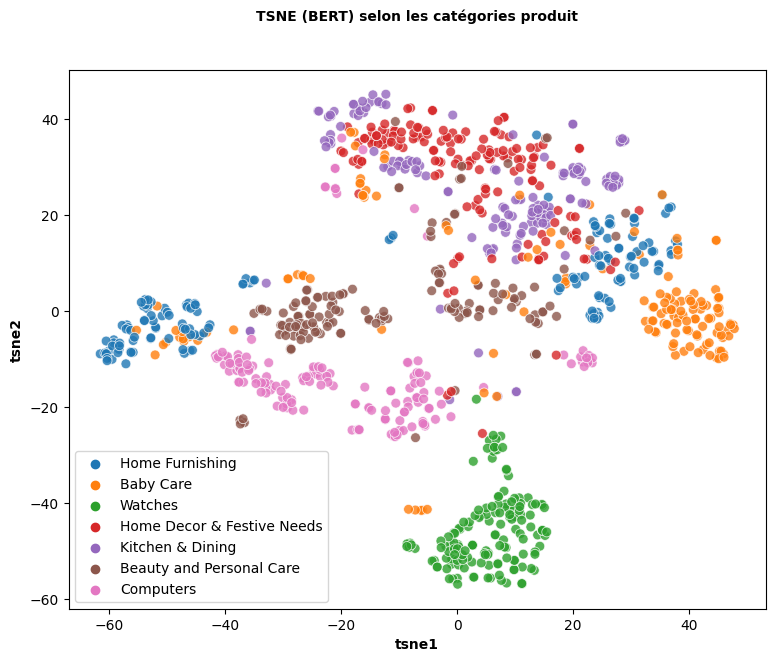

In [184]:
plt.figure(figsize=(9,7))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_bert, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT) selon les catégories produit', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 10, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 10, fontweight = 'bold')
plt.legend(prop={'size': 10}) 

plt.show()

In [185]:
#Création de clusters à partir du T-SNE 
X = df_tsne_bert[["tsne1","tsne2"]]

cls_bert = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_bert.fit(X)

df_tsne_bert["cluster"] = cls_bert.labels_

sil = np.round(silhouette_score(X,cls_bert.labels_,metric="euclidean"),2)
print("---------------------------")
print("Le score de silhouette est", sil)
print("---------------------------")

---------------------------
Le score de silhouette est 0.48
---------------------------


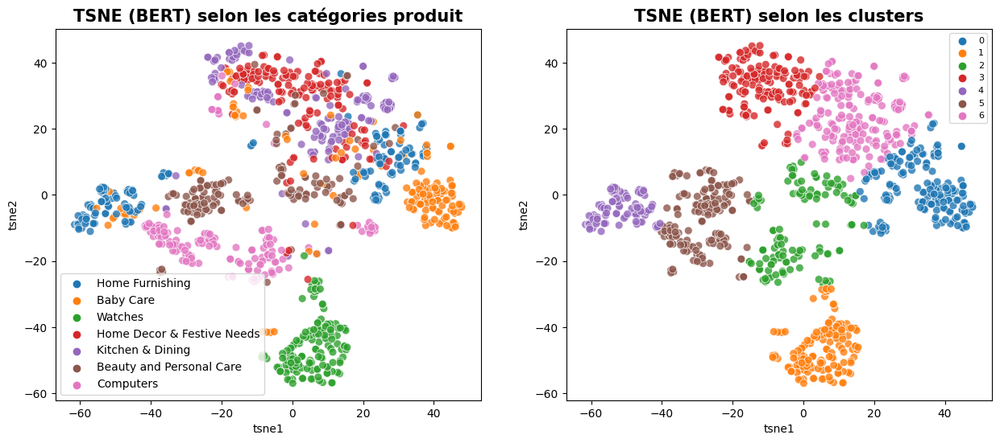

---------------------------
ARI :  0.376
---------------------------


In [186]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_bert, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
data=df_tsne_bert,legend="brief")

plt.title('TSNE (BERT) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()
ARI_bert1 =round( metrics.adjusted_rand_score(labels, cls_bert.labels_),3)
labels = df_txt["label"]
print("---------------------------")
print(f"ARI : ",ARI_bert1 )
print("---------------------------")
df_resultats = add_model_score(
    model_name='BERT (bert-base-uncased) ', ARI=ARI_bert1 )

In [187]:
df_tsne_bert.groupby("cluster").count()["class"]

cluster
0    167
1    150
2    128
3    160
4     86
5    161
6    198
Name: class, dtype: int64

- **Qualité de la catégorisation**

- **répartition des vraies catégories par cluster**

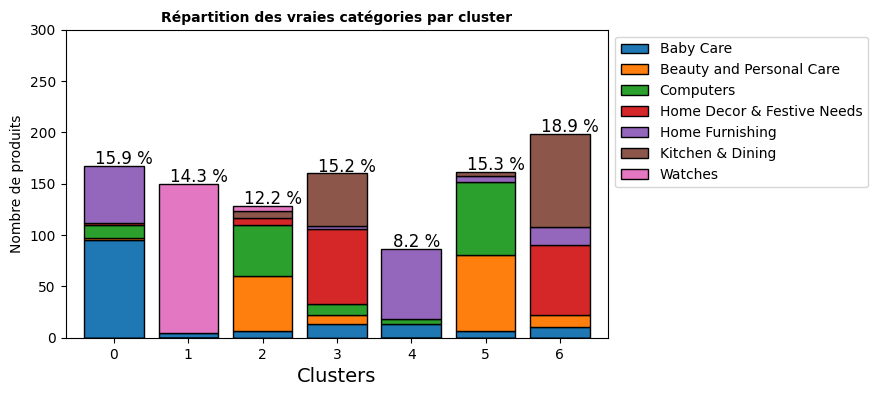

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,95.0,2.0,13.0,2.0,55.0,0.0,0.0
1,5.0,0.0,0.0,0.0,0.0,0.0,145.0
2,7.0,53.0,50.0,7.0,0.0,6.0,5.0
3,13.0,9.0,11.0,73.0,3.0,51.0,0.0
4,13.0,0.0,5.0,0.0,68.0,0.0,0.0
5,7.0,74.0,71.0,0.0,6.0,3.0,0.0
6,10.0,12.0,0.0,68.0,18.0,90.0,0.0


In [188]:
plot_clust_vs_cat(df_tsne_bert["cluster"],
                              df_tsne_bert["class"],
                              df_tsne_bert,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

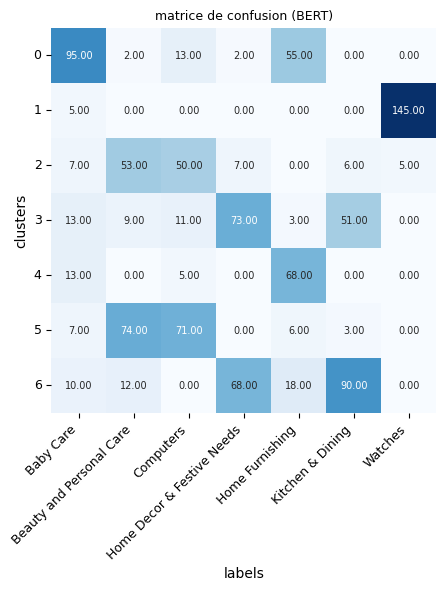

In [189]:
confusion_matrix(df_tsne_bert["class"], df_tsne_bert["cluster"], 'matrice de confusion (BERT)')

 # modèle 5 BERT hub Tensorflow

In [190]:
import tensorflow_hub

In [191]:
import tensorflow_hub as hub


# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
# downloads 500Mb de model
small_model_url = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1'
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = tensorflow_hub.KerasLayer(model_url, trainable=True)

In [192]:
sentences = df_bert_use['sentence_dl'].to_list()
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

In [193]:
features_bert_hub_Tensorflow, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences,
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  83.0


<div class="alert alert-danger">
    <font id="section_ACP_BERT_HUB">
    <h1 style="font-size:25px;"><strong>REDUCTION DE DIMENSION BERT HUB</strong></h1>
</div>


[Explications 6.1 ACP](#section_6_1) 

- **ACP**

In [194]:
print("Dimensions dataset avant réduction PCA : ", features_bert_hub_Tensorflow.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_bert_hub_Tensorflow= pca.fit_transform(features_bert_hub_Tensorflow)
print("Dimensions dataset après réduction PCA : ", pca_results_bert_hub_Tensorflow.shape)

Dimensions dataset avant réduction PCA :  (1050, 768)
Dimensions dataset après réduction PCA :  (1050, 339)


- **T_SNE**

In [195]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bert_hub_Tensorflow = tsne.fit_transform(pca_results_bert_hub_Tensorflow)

df_tsne_bert_hub_Tensorflow = pd.DataFrame(tsne_results_bert_hub_Tensorflow[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_bert_hub_Tensorflow["class"] = df_txt["cat_lvl_1"]
print(df_tsne_bert_hub_Tensorflow.shape)

(1050, 3)


 - **Visualisation**
 
 
Affichage T-SNE selon les catégories d'images


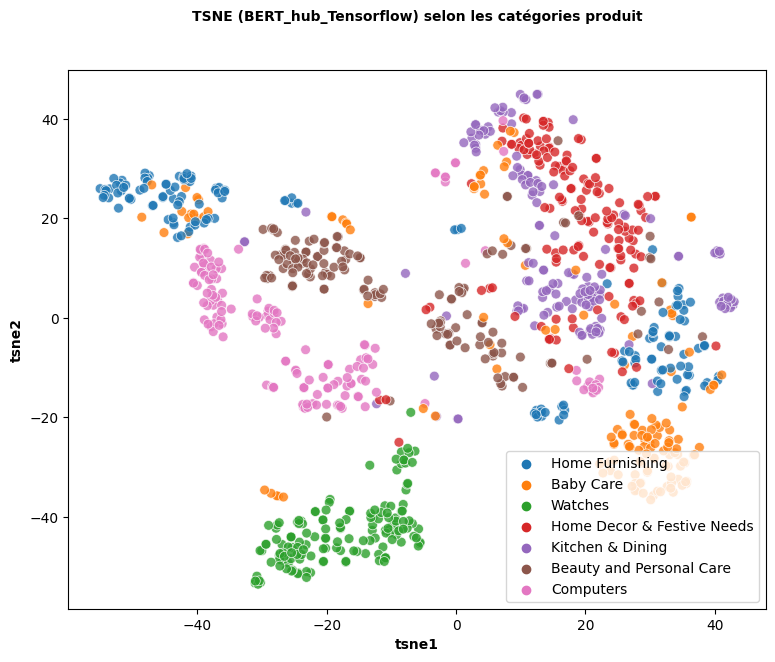

In [196]:
plt.figure(figsize=(9,7))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_bert_hub_Tensorflow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT_hub_Tensorflow) selon les catégories produit', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 10, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 10, fontweight = 'bold')
plt.legend(prop={'size': 10}) 

plt.show()


In [197]:
#Création de clusters à partir du T-SNE 
X = df_tsne_bert_hub_Tensorflow[["tsne1","tsne2"]]

cls_bert3 = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_bert3.fit(X)

df_tsne_bert_hub_Tensorflow["cluster"] = cls_bert3.labels_

sil = np.round(silhouette_score(X,cls_bert3.labels_,metric="euclidean"),2)
print("---------------------------")
print("Le score de silhouette est", sil)
print("---------------------------")

---------------------------
Le score de silhouette est 0.47
---------------------------


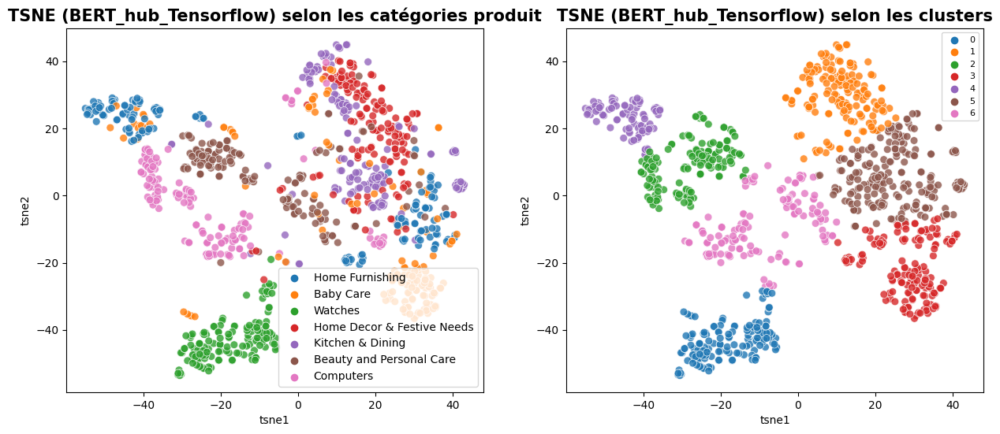

---------------------------
ARI :  0.359
---------------------------


In [198]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_bert_hub_Tensorflow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT_hub_Tensorflow) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8, data=df_tsne_bert_hub_Tensorflow,legend="brief")

plt.title('TSNE (BERT_hub_Tensorflow) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()

labels = df_txt["label"]
ARI_bert3=np.round(metrics.adjusted_rand_score(labels, cls_bert3.labels_),3)

print("---------------------------")
print(f"ARI : ",ARI_bert3)
print("---------------------------")
df_resultats = add_model_score(
    model_name='BERT(hub Tensorflow) ', ARI=ARI_bert3)

In [199]:
df_tsne_bert_hub_Tensorflow.groupby("cluster").count()["class"]

cluster
0    150
1    166
2    151
3    151
4     88
5    211
6    133
Name: class, dtype: int64

- **Qualité de la catégorisation**

- **répartition des vraies catégories par cluster**

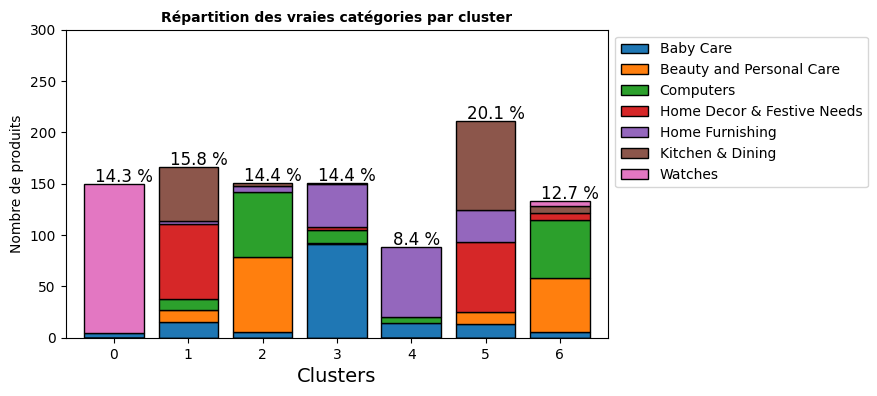

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,5.0,0.0,0.0,0.0,0.0,0.0,145.0
1,15.0,12.0,11.0,73.0,3.0,52.0,0.0
2,6.0,73.0,63.0,0.0,6.0,3.0,0.0
3,91.0,1.0,13.0,3.0,42.0,1.0,0.0
4,14.0,0.0,6.0,0.0,68.0,0.0,0.0
5,13.0,12.0,0.0,68.0,31.0,87.0,0.0
6,6.0,52.0,57.0,6.0,0.0,7.0,5.0


In [200]:
plot_clust_vs_cat(df_tsne_bert_hub_Tensorflow["cluster"],
                              df_tsne_bert_hub_Tensorflow["class"],
                              df_tsne_bert_hub_Tensorflow,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

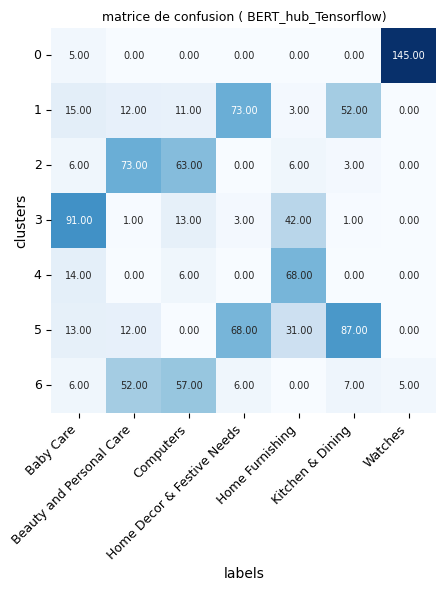

In [201]:
confusion_matrix( df_tsne_bert_hub_Tensorflow["class"],  df_tsne_bert_hub_Tensorflow["cluster"],
                 'matrice de confusion ( BERT_hub_Tensorflow)')

 # modèle 6 USE - Universal Sentence Encoder

In [202]:
# import tensorflow_hub as hub
USE_model_url = "https://tfhub.dev/google/universal-sentence-encoder/4"

In [203]:
# 1Gb model
embed = tensorflow_hub.load(USE_model_url)

In [204]:
def feature_USE_fct(sentences, b_size):
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size):
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step == 0:
            features = feat
        else:
            features = np.concatenate((features, feat))

    time2 = np.round(time.time() - time1, 0)
    print(f'feature_USE_fct, time_taken = {time2} s')
    return features

In [205]:
batch_size = 10
sentences = df_bert_use['sentence_dl'].to_list()

In [206]:
df_USE = feature_USE_fct(sentences, batch_size)

feature_USE_fct, time_taken = 1.0 s


<div class="alert alert-danger">
    <font id="section_ACP_USE">
    <h1 style="font-size:25px;"><strong>REDUCTION DE DIMENSION USE</strong></h1>
</div>


[Explications 6.1 ACP](#section_6_1) 

- **ACP**

In [207]:
print("Dimensions dataset avant réduction PCA : ", df_USE.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_USE= pca.fit_transform(df_USE)
print("Dimensions dataset après réduction PCA : ", pca_results_USE.shape)

Dimensions dataset avant réduction PCA :  (1050, 512)
Dimensions dataset après réduction PCA :  (1050, 341)


- **Tsne**

In [208]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bert_hub_Tensorflow = tsne.fit_transform(pca_results_USE)

df_tsne_results_USE = pd.DataFrame(tsne_results_bert_hub_Tensorflow [:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_results_USE["class"] = df_txt["cat_lvl_1"]
print(df_tsne_results_USE.shape)

(1050, 3)


 - **Visualisation**
 
 
Affichage T-SNE selon les catégories d'images


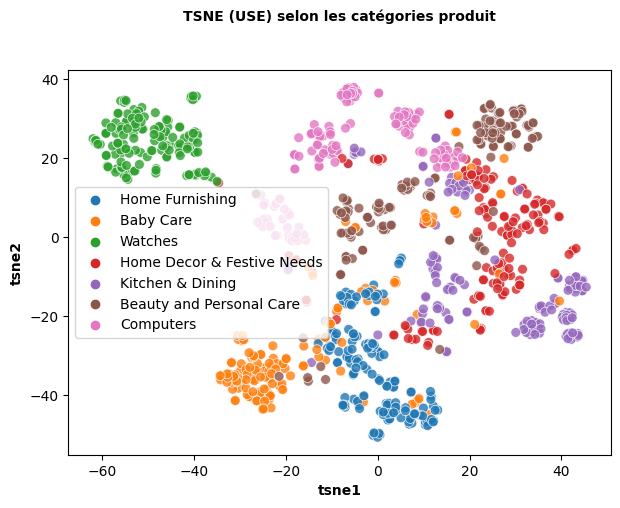

In [209]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_results_USE, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (USE) selon les catégories produit', fontsize = 10, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 10, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 10, fontweight = 'bold')
plt.legend(prop={'size': 10}) 

plt.show()

In [210]:
#Création de clusters à partir du T-SNE 
X = df_tsne_results_USE[["tsne1","tsne2"]]

cls_use = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_use.fit(X)

df_tsne_results_USE["cluster"] = cls_use.labels_

sil = np.round(silhouette_score(X,cls_use.labels_,metric="euclidean"),2)
print("---------------------------")
print("Le score de silhouette est", sil)
print("---------------------------")

---------------------------
Le score de silhouette est 0.49
---------------------------


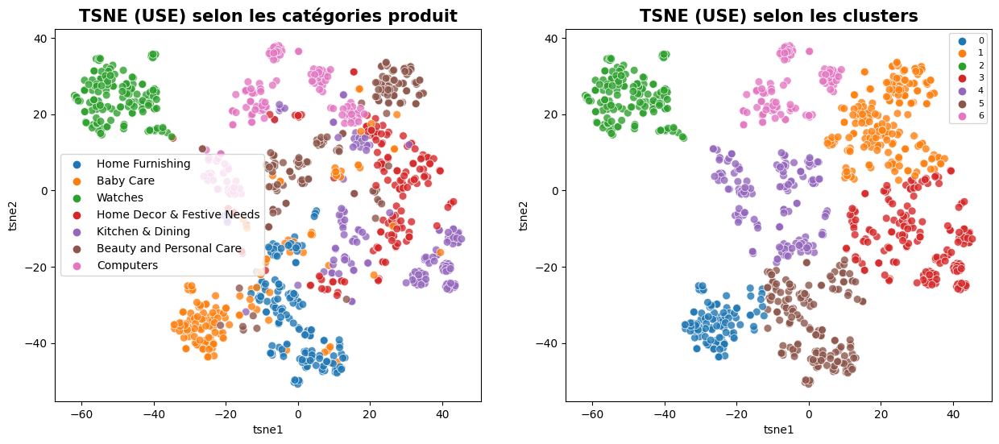

---------------------------
ARI :  0.451
---------------------------


In [211]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_results_USE, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (USE) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8, data=df_tsne_results_USE,legend="brief")

plt.title('TSNE (USE) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()

labels = df_txt["label"]
ARI_use=np.round(metrics.adjusted_rand_score(labels, cls_use.labels_),3)

print("---------------------------")
print(f"ARI : ",ARI_use)
print("---------------------------")
df_resultats = add_model_score(
    model_name='USE ', ARI=ARI_use)

In [212]:
df_tsne_results_USE.groupby("cluster").count()["class"]

cluster
0    103
1    203
2    151
3    184
4    148
5    165
6     96
Name: class, dtype: int64

- **Qualité de la catégorisation**

- **répartition des vraies catégories par cluster**

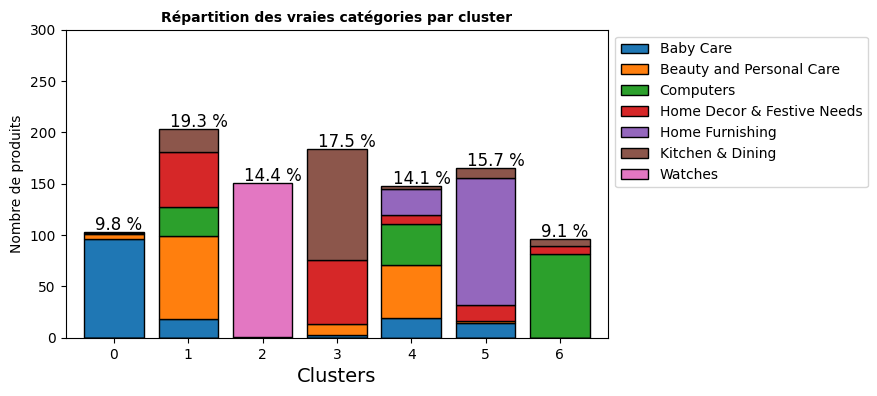

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,96.0,5.0,0.0,0.0,1.0,1.0,0.0
1,18.0,81.0,28.0,54.0,0.0,22.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,150.0
3,3.0,10.0,0.0,63.0,0.0,108.0,0.0
4,19.0,52.0,40.0,9.0,25.0,3.0,0.0
5,14.0,2.0,0.0,16.0,124.0,9.0,0.0
6,0.0,0.0,82.0,7.0,0.0,7.0,0.0


In [213]:
plot_clust_vs_cat(df_tsne_results_USE["cluster"],
                              df_tsne_results_USE["class"],
                              df_tsne_results_USE,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

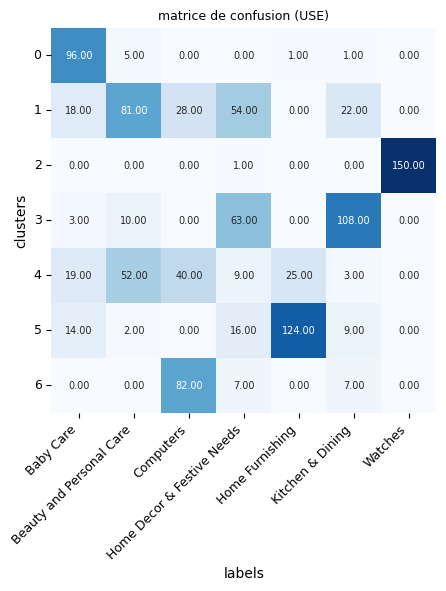

In [214]:
confusion_matrix( df_tsne_results_USE["class"],  df_tsne_results_USE["cluster"],
                 'matrice de confusion (USE)')

## Conclusion: Parte textual

In [215]:
# Affichage des resultat 

df_resultats

,model,ARI
0,BOW,0.429
1,TF-IDF,0.503
2,Word2Vec,0.252
3,BERT (bert-base-uncased),0.376
4,BERT(hub Tensorflow),0.359
5,USE,0.451


Voici une analyse des différents modèles et de leurs valeurs respectives d'ARI (Indice de Rand Ajusté) qui ont été utilisés pour l'analyse :

1. **BOW** (Sacs de mots) : A obtenu un ARI de 0,429. Cela signifie que le modèle de Sacs de mots a réussi à obtenir une certaine mesure de regroupement approprié, bien qu'il puisse y avoir une marge d'amélioration.

2. **TF-IDF** : A obtenu un ARI de 0,502. Ce modèle a eu légèrement de meilleurs résultats que le modèle de Sacs de mots, ce qui indique que l'utilisation de la pondération TF-IDF pourrait avoir amélioré le regroupement des données.

3. **Word2Vec** : A obtenu un ARI de 0,252. Ce modèle a eu des résultats nettement inférieurs par rapport aux modèles précédents. Il pourrait être nécessaire d'ajuster ou d'améliorer la méthode de représentation des mots pour obtenir des résultats plus précis.

4. **BERT** (bert-base-uncased) : A obtenu un ARI de 0,376. Bien qu'il soit meilleur que le modèle Word2Vec, il a quand même eu un rendement inférieur par rapport aux deux premiers modèles. Il est possible que ce modèle nécessite plus d'ajustements ou qu'une version pré-entraînée différente de BERT soit nécessaire pour obtenir de meilleurs résultats.

5. **BERT** (hub Tensorflow) : A obtenu un ARI de 0,359. Comme le modèle BERT précédent, celui-ci a également eu un rendement inférieur par rapport à BOW et TF-IDF. Il pourrait nécessiter plus d'ajustements ou l'utilisation d'une version différente de BERT pour améliorer le rendement.

6. **USE** (Universal Sentence Encoder) : A obtenu un ARI de 0,451. Ce modèle a eu un rendement moyen par rapport aux autres modèles. Il peut être utile d'expérimenter avec différentes versions ou configurations de l'encodeur de phrases universel pour obtenir de meilleurs résultats.

En général, on constate que TF-IDF a obtenu le meilleur rendement en termes d'ARI, suivi par BOW et USE. Word2Vec et les modèles BERT ont eu un rendement inférieur, ce qui suggère qu'ils pourraient nécessiter des ajustements ou des améliorations de la configuration pour améliorer leur rendement. Il est important de noter que l'ARI est seulement une mesure de la qualité du regroupement et qu'il peut y avoir d'autres métriques ou considérations pour évaluer le rendement global des modèles.

=======================================================================   V2

<div class="alert alert-success">
    <font id="section_7">
    <h1 style="font-size:25px;"><strong>07. Données visuelles</strong></h1>
</div>

CE2 Vous avez présenté des opérations de retraitement d'images (par exemple passage en gris, filtrage du bruit, égalisation, floutage) sur un ou plusieurs exemples. 


### Utiliser des techniques d’augmentation des données afin d'améliorer la performance des modèles.
* **CE1** Vous avez utilisé plusieurs techniques d’augmentation des données (ex. pour des images : rotation, changement d’échelle, ajout de bruit…). 
* **CE2** Vous avez présenté une synthèse comparative des améliorations de performance grâce aux différentes techniques d'augmentation de données utilisées (maîtrise de l’overfitting, meilleur score).


In [216]:
!tree

Structure du dossier pour le volume OS
Le numéro de série du volume est 80B8-D3C6
C:.
+---.ipynb_checkpoints
+---Images
+---models
¦   +---weighs_vgg_transfer.weights_temp
+---OT_P6_Classifiez_automatiquement_des_biens_de_consommation_2023_07
¦   +---.ipynb_checkpoints
+---Resized_Images


In [217]:
'Images/'+ str(data.sample(10)['image'].values.tolist()[0])

'Images/2baa415ebcc4fe563ce13b50e60efc1c.jpg'

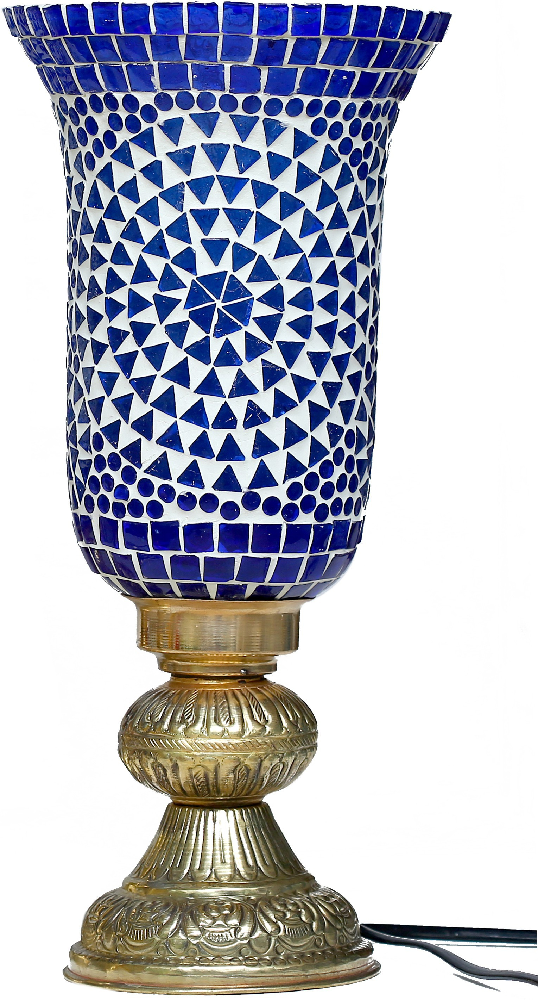

In [218]:
from IPython.display import Image
#Image(str(data.sample(10)['image'].values.tolist()[0]), width=100 )
Image('Images/'+ str(data.sample(10)['image'].values.tolist()[0]), width=100 )

In [219]:
#Echantillon de données
img_echantillon = data.sample(50, random_state=10)

In [220]:
img_echantillon['image'] = img_echantillon['image'].apply(lambda x: 'Images/'+str(x))
#img_echantillon['image'] = img_echantillon['image'].apply(lambda x: str(x))

In [221]:
img_echantillon['image'].head(1)

775    Images/93618b8a998782d4d847ee5cba5c7de2.jpg
Name: image, dtype: object

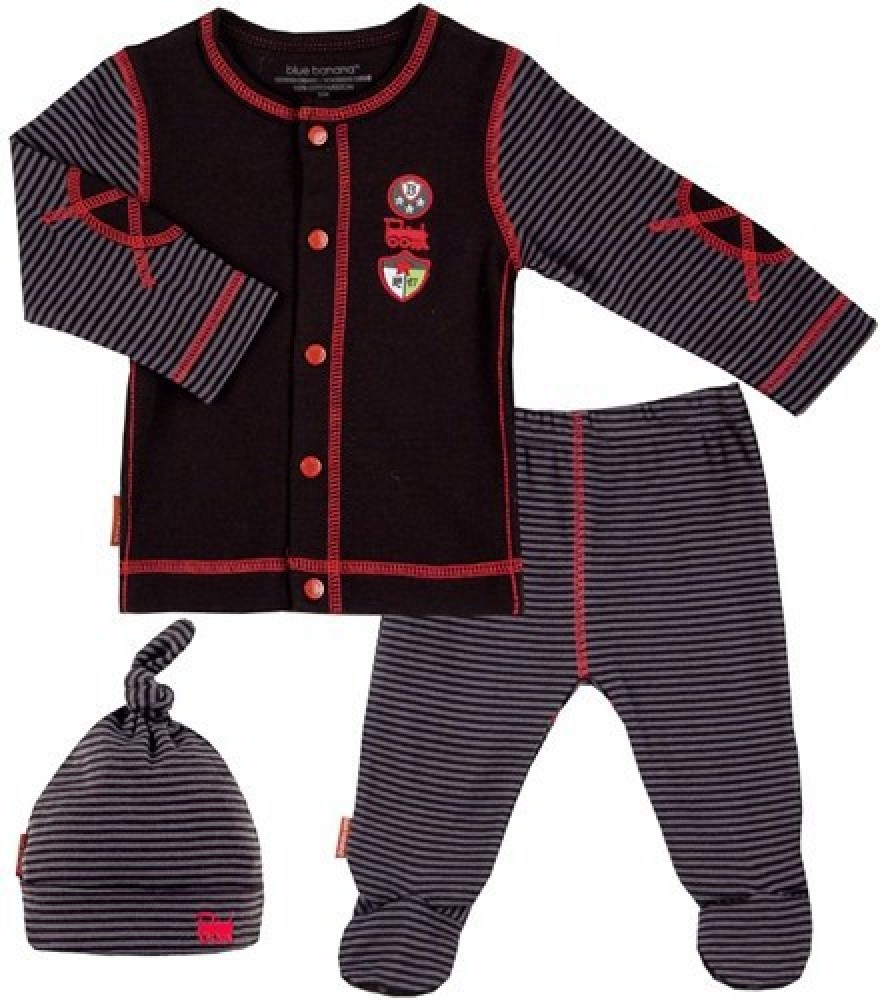

In [222]:
Image(img_echantillon.iloc[22]['image'], width=150)

In [223]:
img_echantillon.iloc[22]

uniq_id                                                                   9d3ca83f7017d6e9e129964e88503ff0
crawl_timestamp                                                                  2016-06-23 23:50:58 +0000
product_url                http://www.flipkart.com/kushies-baby-girl-s-shrug/p/itmehcdgg5zu834p?pid=RUG...
product_name                                                                Kushies baby Baby Girl's Shrug
pid                                                                                       RUGEHCDG6DKDUCDZ
retail_price                                                                                        2199.0
discounted_price                                                                                    2199.0
image                                                          Images/9d3ca83f7017d6e9e129964e88503ff0.jpg
is_FK_Advantage_product                                                                              False
description                Specificat

<div class="alert alert-success">
    <font id="section_7_1">
    <h1 style="font-size:25px;"><strong>7.1 Préambule : essai de convolution</strong></h1>
</div>

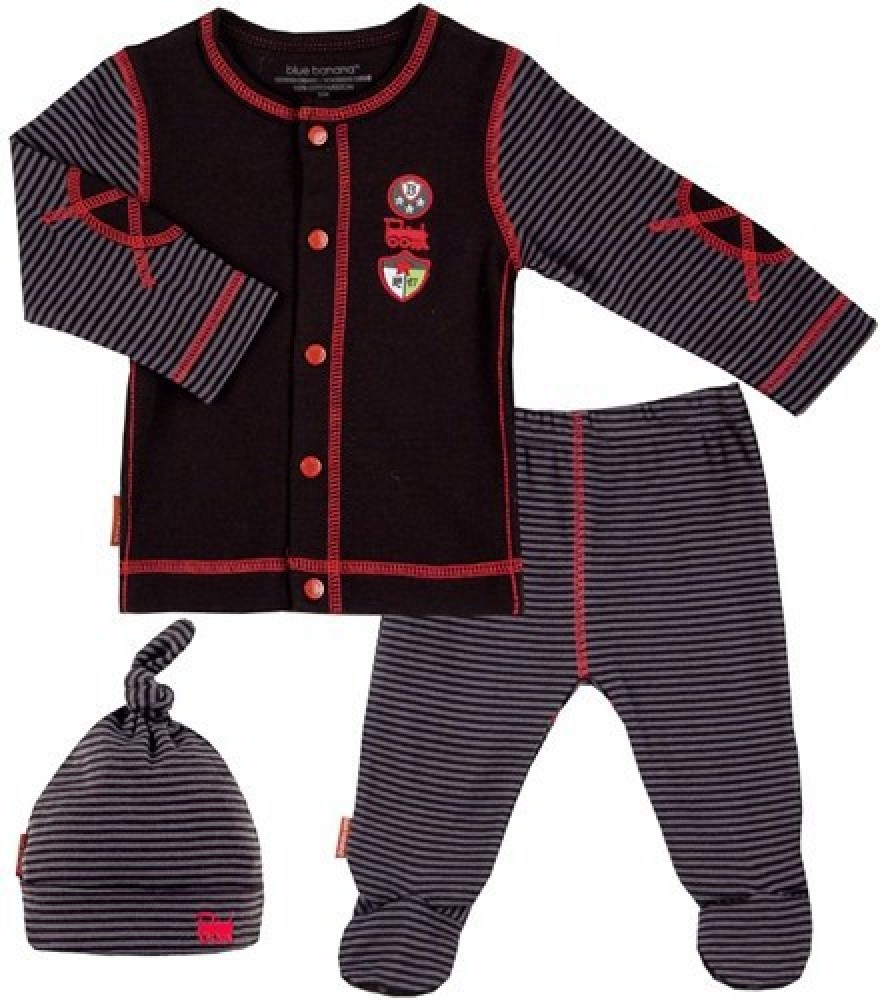

In [224]:
#Image('Images/987e13b445c34bfedb9796d2bb78d593.jpg', width=200)
Image('Images/9d3ca83f7017d6e9e129964e88503ff0.jpg', width=200)

In [225]:
#img_conv = Image_PIL.open('Images/93618b8a998782d4d847ee5cba5c7de2.jpg')
img_conv = Image_PIL.open('Images/9d3ca83f7017d6e9e129964e88503ff0.jpg')

In [226]:
img_conv = np.array(img_conv)

In [227]:
img_conv = cv2.resize(img_conv, (200,200))

In [228]:
def filtre_moyenneur(img, voisinage = 1):
    '''Remplace chaque pixel par l\'intensité moyenne de son voisinage'''
    etendue = 1+2*voisinage
    img2 = np.copy(img)
    
    for i in range(0, img.shape[0]):
        for j in range(0, img.shape[1]):
            if (i<voisinage)|(i>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)
            if (j<voisinage)|(j>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)
            
            
    for i in range(voisinage,img.shape[0]-voisinage):
        for j in range(voisinage,img.shape[1]-voisinage):
            mean = 0
            for mean_x in range(i-voisinage, i+voisinage+1):
                for mean_y in range(j-voisinage, j+voisinage+1):
                    mean += img[mean_x, mean_y]
            img2[i,j] = mean/(etendue**2)
    
    
    return img2  

In [229]:
img_conv_traitee_1 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=1)
img_conv_traitee_2 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=2)
img_conv_traitee_3 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=3)
img_conv_traitee_4 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=4)

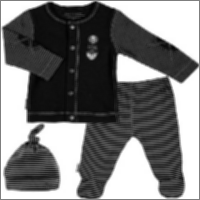

In [230]:
Image_PIL.fromarray(img_conv_traitee_1)

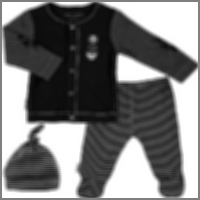

In [231]:
Image_PIL.fromarray(img_conv_traitee_2)

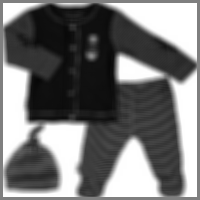

In [232]:
Image_PIL.fromarray(img_conv_traitee_3)

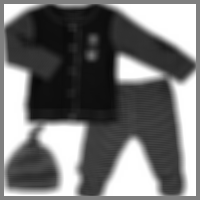

In [233]:
Image_PIL.fromarray(img_conv_traitee_4)

<div class="alert alert-success">
    <font id="section_7_2">
    <h1 style="font-size:25px;"><strong>7.2 Prétraitement - Essais - Réduction de bruit</strong></h1>
</div>

In [234]:
from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL

In [235]:
im = np.array(Image_PIL.open(img_echantillon.iloc[22]['image']))

In [236]:
im = gaussian_filter(im, sigma=3)

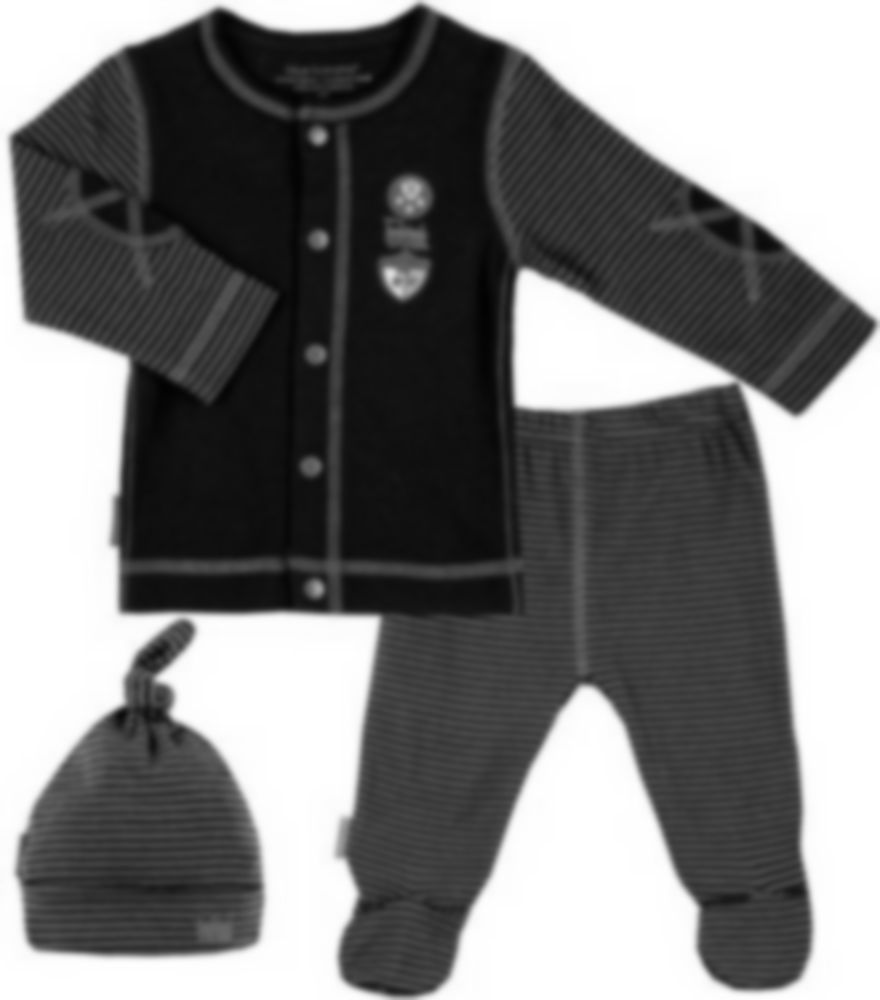

In [237]:
Image_PIL.fromarray(im)

<div class="alert alert-success">
    <font id="section_7_3">
    <h1 style="font-size:25px;"><strong>7.3 Egalisation</strong></h1>
</div>

In [238]:
hist, bins = np.histogram(im.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

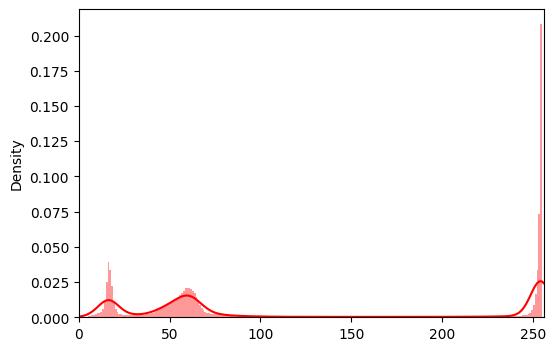

In [239]:
plt.figure(figsize=(6,4))
sns.distplot(im.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.show()

In [240]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')

In [241]:
im2=cdf[im]

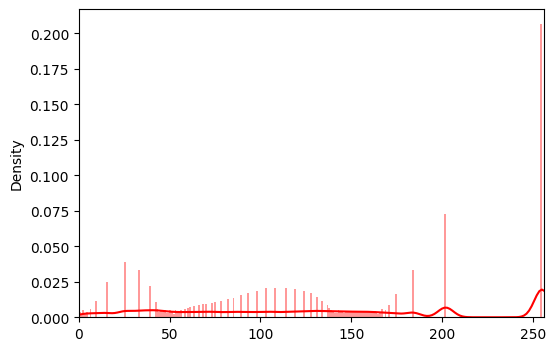

In [242]:
plt.figure(figsize=(6,4))
sns.distplot(im2.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.show()

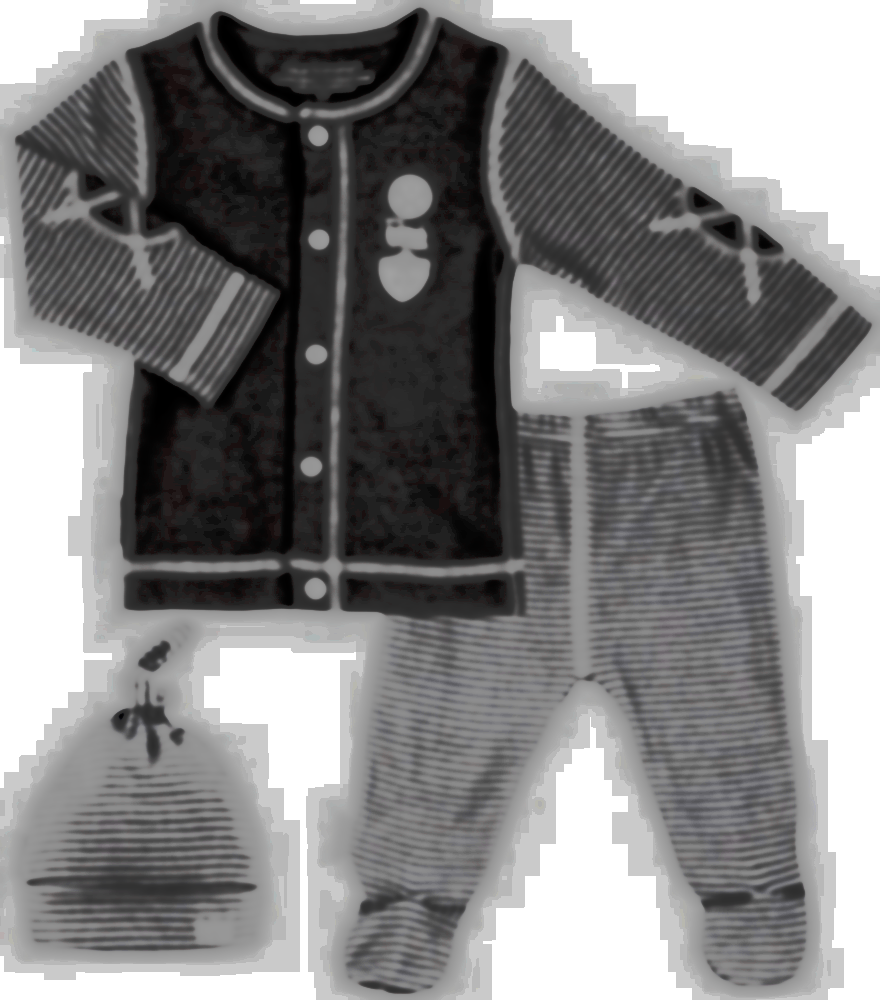

In [243]:
Image_PIL.fromarray(im2)

In [244]:
img3 = cv2.imread(img_echantillon.iloc[12]['image'],0)
equ = cv2.equalizeHist(img3)
res = np.hstack((img3,equ)) #stacking images side-by-side
cv2.imwrite('res.png',res)

True

In [245]:
img3.shape

(1096, 1100)

<div class="alert alert-success">
    <font id="section_7_4">
    <h1 style="font-size:25px;"><strong>7.4 Redimensionnement: Taille d'origine des images</strong></h1>
</div>

In [246]:
min_x = 100000
max_x = 0
min_y = 100000
max_y = 0
for image in img_echantillon['image'].tolist():
    shape = np.array(Image_PIL.open(image)).shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]

In [247]:
print('min_x {},\nmax_x {},\nmin_y {},\nmax_y {}'.format(min_x, max_x, min_y, max_y))

min_x 286,
max_x 4098,
min_y 302,
max_y 2800


## Redimensionnement

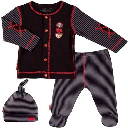

In [248]:
resize_img = cv2.resize(np.array(Image_PIL.open(img_echantillon.iloc[22]['image'])), dsize=(128,128))
Image_PIL.fromarray(resize_img)

### Fonction de prétraitement Complète

In [249]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))
    del shape
    return im

In [250]:
def preprocess(image, path=False):
    '''prétraitement des images:
    * filtre gaussian
    * égalisation de l'histogramme
    * redimensionnement
    prend un entrée le chemin vers l'image et en sortie la matrice np.array de l'image traitée
    '''
    #ouverture du fichier
    if path == False: #si on a fourni un array en entree :
        im = image
    else: #si on a fourni un chemin vers le fichier en entree:
        im = np.array(Image_PIL.open(image))
    
    #greyscale
    im = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
    
    #flou gaussien
    im = gaussian_filter(im, sigma=2)
    
    #égalisation
    im = cv2.equalizeHist(im)
    
    return redim(im, 128, 128)

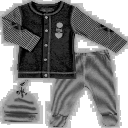

In [251]:
#Image_PIL.fromarray(preprocess(img_echantillon.iloc[12]['image'], path=True))
Image_PIL.fromarray(preprocess(img_echantillon.iloc[22]['image'], path=True))

<div class="alert alert-success">
    <font id="section_8">
    <h1 style="font-size:25px;"><strong>8.0 Extraction des caractéristiques (SIFT/ORB/SURF): Essais</strong></h1>
</div>

`OpenCV` (Open Source Computer Vision Library) est une bibliothèque de vision par ordinateur open source qui fournit une large gamme de fonctions et d'algorithmes pour le traitement d'images et la vision artificielle.

Dans le cas des bibliothèques  `SIFT`, `ORB` et `SURF` mentionnées précédemment, OpenCV fournit des implémentations de ces algorithmes en tant que partie de son ensemble de fonctions et d'algorithmes pour le traitement d'images.             

Cela signifie qu'OpenCV inclut les implémentations de `SIFT`, `ORB` et `SURF`, ce qui permet aux développeurs d'utiliser directement ces techniques dans leurs applications en utilisant les fonctions et les classes fournies par OpenCV.


*CE3 Vous avez élaboré une fonction permettant d'extraire des features ("feature engineering") de type "bag-of-images" via la génération de descripteurs (algorithmes ORB, ou SIFT, ou SURF)*


## SIFT

In [252]:
i = np.random.randint(img_echantillon.shape[0]-1)
img_sift = preprocess(img_echantillon.iloc[22]['image'], path=True)
img_sift

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

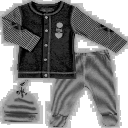

In [253]:
Image_PIL.fromarray(img_sift)

================================================================ 100

In [254]:
print('OpenCV Version: ' + cv2.__version__)

OpenCV Version: 3.4.2


pip install opencv-python==3.4.2.17 pip install opencv-contrib-python==3.4.2.17

In [255]:
pip show opencv-python

Note: you may need to restart the kernel to use updated packages.Name: opencv-python
Version: 3.4.2.17
Summary: Wrapper package for OpenCV python bindings.
Home-page: https://github.com/skvark/opencv-python
Author: 
Author-email: 
License: MIT
Location: c:\users\oscar\onedrive\documents\datascientist\envs\projet6\lib\site-packages
Requires: numpy
Required-by: 



In [256]:
pip show opencv-contrib-python

Name: opencv-contrib-python
Version: 3.4.2.17
Summary: Wrapper package for OpenCV python bindings.
Home-page: https://github.com/skvark/opencv-python
Author: 
Author-email: 
License: MIT
Location: c:\users\oscar\onedrive\documents\datascientist\envs\projet6\lib\site-packages
Requires: numpy
Required-by: 
Note: you may need to restart the kernel to use updated packages.


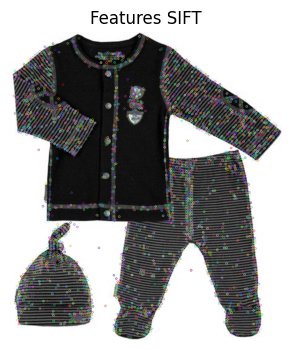

In [257]:
import cv2
import cv2.xfeatures2d as xfeat

image_path = img_echantillon.iloc[22]['image']
img_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Crear el detector SIFT
sift = xfeat.SIFT_create()

# Detectar los keypoints
kp = sift.detect(img_gray, None)

# Dibujar los keypoints en la imagen
img_with_keypoints = cv2.drawKeypoints(img_gray, kp, img_gray)

# Mostrar la imagen con los keypoints
plt.figure(figsize=(4, 4))
plt.imshow(img_with_keypoints, cmap='gray')
plt.title('Features SIFT')
plt.axis('off')
plt.show()

================================================================ 100

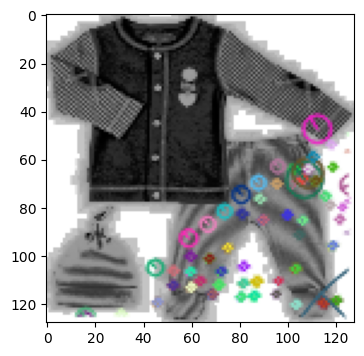

In [258]:
img=cv2.drawKeypoints(img_sift,kp,img_sift,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(4,4))
plt.imshow(img)

## ORB

In [259]:
img_orb = preprocess(img_echantillon.iloc[i]['image'], path=True)

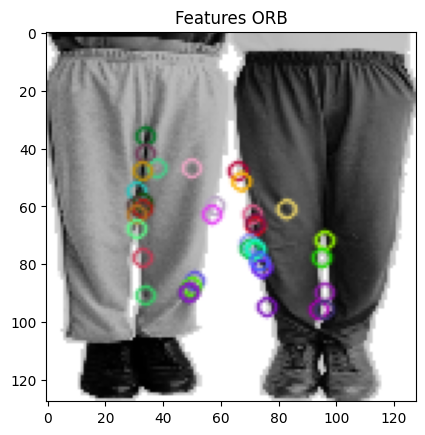

In [260]:
orb = cv2.ORB_create()

#find keypoints and descriptors
kp, des = orb.detectAndCompute(img_orb, mask = None)
#draw only keypoints location, not size and orientation:
image_orb = cv2.drawKeypoints(img_orb, kp, outImage = True, flags=2)
plt.title('Features ORB')
plt.imshow(image_orb)
plt.show()

In [261]:
len(kp)

38

In [262]:
des.shape

(38, 32)

## SURF

=====================================================

In [263]:
img_surf = preprocess(img_echantillon.iloc[22]['image'], path=True)

In [264]:
#surf = cv2.xfeatures2d.SURF_create()
surf = cv2.xfeatures2d.SURF_create()

In [265]:
kp = surf.detect(img_surf,None)

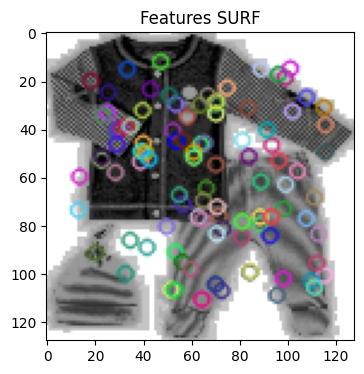

In [266]:
image_surf = cv2.drawKeypoints(img_surf, kp, outImage = True, flags=2)

plt.figure(figsize=(4,4))
plt.title('Features SURF')
plt.imshow(image_surf)

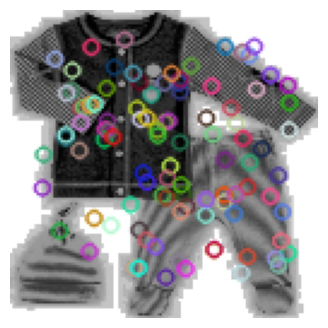

In [267]:
import cv2
import matplotlib.pyplot as plt

# Importar el módulo xfeatures2d
import cv2.xfeatures2d as xfeatures2d

# Cargar la imagen
image_path = img_echantillon.iloc[22]['image']
img_surf = preprocess(image_path, path=True)

# Crear el detector SURF
surf = cv2.xfeatures2d.SURF_create()

# Detectar los keypoints
kp = surf.detect(img_surf, None)

# Dibujar los keypoints en la imagen
image_surf = cv2.drawKeypoints(img_surf, kp, outImage=True, flags=2)

# Mostrar la imagen con los keypoints
plt.figure(figsize=(4, 4))
plt.imshow(image_surf, cmap='gray')
plt.axis('off')
plt.show()

# Exportar la variable de entorno
#export OPENCV_ENABLE_NONFREE='ON'


In [268]:
import cv2
#sift = cv2.xfeatures2d.SIFT_create()
surf = cv2.xfeatures2d.SURF_create()


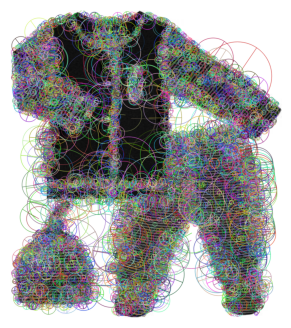

In [269]:
import cv2
import cv2.xfeatures2d as xfeatures2d
import matplotlib.pyplot as plt

# Cargar la imagen
image_path = img_echantillon.iloc[22]['image']
img_surf = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Crear el detector SURF
surf = cv2.xfeatures2d.SURF_create()

# Detectar los keypoints
kp = surf.detect(img_surf, None)

# Dibujar los keypoints en la imagen
image_surf = cv2.drawKeypoints(img_surf, kp, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Mostrar la imagen con los keypoints
plt.figure(figsize=(4, 4))
plt.imshow(image_surf, cmap='gray')
plt.axis('off')
plt.show()


=====================================================

In [270]:
kp_surf, des_surf = sift.detectAndCompute(img_surf,None)

In [271]:
des_surf[2].shape

(128,)

In [272]:
des_surf[0].shape

(128,)

### Fonctions

In [273]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2.imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1
    return liste_image

In [274]:
def create_features():
    '''Initialise un algorithme SURF'''
    return cv2.xfeatures2d.SURF_create()
    

def features(surf, image):
    '''renvoie les keypoints et descripteurs d\'une image à partir du détecteur surf'''
    keypoints, descriptors = surf.detectAndCompute(image, None)
    return [keypoints, descriptors]

def pipeline_feature(image):
    '''traitement complet d\'une image : 
    * initialise l\'algorithme, 
    *prétraite l'image, 
    *recherche les features
    *retourne les features'''
    
    surf = create_features()
    image = preprocess(image, path=False)
    #gr = grey(image)
    keypoints, descriptors = features(surf, image)
    return keypoints, descriptors

In [275]:
image_essai = get_files(img_echantillon['image'])[1]

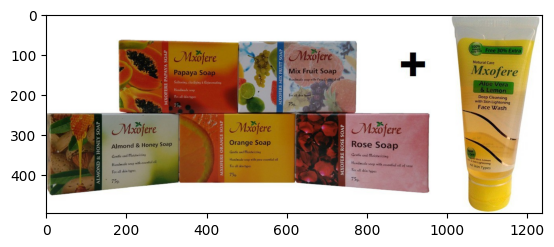

In [276]:
plt.imshow(image_essai)

In [277]:
j=0

echantillon = get_files(img_echantillon['image'].tolist())
max_count = len(echantillon)
f = IntProgress(min=0, max=max_count) # instantiate the bar
chaine = str(0)+'/'+str(max_count)
g = Text(value=chaine)
display(f) # display the bar
display(g)
liste_keypoints = []
liste_descripteurs = []


for array_image in echantillon:
    j+=1
    kea, des = pipeline_feature(array_image)
    liste_keypoints.append(kea)
    liste_descripteurs.append(des)
    f.value = j # signal to increment the progress bar
    g.value =str(j)+'/'+str(max_count)

IntProgress(value=0, max=50)

Text(value='0/50')

In [278]:
liste_descripteurs[0].shape

(136, 64)

In [279]:
liste_descripteurs[0].reshape(1,-1)

array([[-0.000998  , -0.00404328,  0.00390634, ..., -0.01322134,
         0.01262867,  0.01360275]], dtype=float32)

In [280]:
print('Nombre de liste de keypoints : ', len(liste_keypoints))
print('Nombre de keypoints pour l\'élément 0 : ', len(liste_keypoints[0]))
print('Nombre de keypoints pour l\'élément 2 : ', len(liste_keypoints[2]))

Nombre de liste de keypoints :  50
Nombre de keypoints pour l'élément 0 :  136
Nombre de keypoints pour l'élément 2 :  98


In [281]:
print('Dimension descripteurs élément 0 : ', liste_descripteurs[0].shape)
print('Dimension descripteurs élément 1 : ', liste_descripteurs[1].shape)

Dimension descripteurs élément 0 :  (136, 64)
Dimension descripteurs élément 1 :  (106, 64)


In [282]:
for el, ech in zip(liste_descripteurs, echantillon):
    print(el.shape, ' - ', ech.shape)

(136, 64)  -  (2224, 2208, 3)
(106, 64)  -  (496, 1238, 3)
(98, 64)  -  (1100, 1000, 3)
(110, 64)  -  (1100, 612, 3)
(103, 64)  -  (1360, 472, 3)
(108, 64)  -  (1488, 2800, 3)
(78, 64)  -  (1211, 739, 3)
(184, 64)  -  (4098, 1514, 3)
(53, 64)  -  (773, 756, 3)
(97, 64)  -  (1200, 900, 3)
(124, 64)  -  (1950, 1938, 3)
(126, 64)  -  (1100, 409, 3)
(169, 64)  -  (1096, 1100, 3)
(101, 64)  -  (1000, 668, 3)
(140, 64)  -  (921, 1100, 3)
(188, 64)  -  (1100, 1074, 3)
(135, 64)  -  (2000, 1640, 3)
(98, 64)  -  (1223, 1067, 3)
(67, 64)  -  (993, 1100, 3)
(157, 64)  -  (3558, 2356, 3)
(75, 64)  -  (995, 417, 3)
(102, 64)  -  (1100, 1031, 3)
(99, 64)  -  (1000, 880, 3)
(99, 64)  -  (1440, 1068, 3)
(153, 64)  -  (890, 592, 3)
(119, 64)  -  (995, 850, 3)
(105, 64)  -  (1312, 852, 3)
(43, 64)  -  (286, 416, 3)
(125, 64)  -  (1100, 815, 3)
(101, 64)  -  (1100, 1000, 3)
(132, 64)  -  (1100, 1068, 3)
(101, 64)  -  (1000, 302, 3)
(121, 64)  -  (2012, 1296, 3)
(122, 64)  -  (844, 1100, 3)
(152, 64)  -  

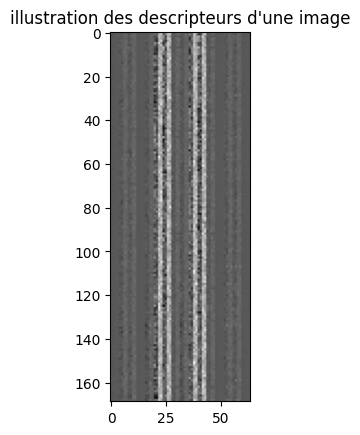

In [283]:
plt.title('illustration des descripteurs d\'une image')
plt.imshow(liste_descripteurs[12], cmap='gray')

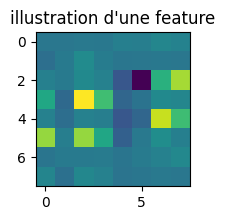

In [284]:
plt.figure(figsize=(2,2))
plt.title('illustration d\'une feature')
plt.imshow(liste_descripteurs[0][12].reshape(8,8))

In [285]:
def extraction_features(data_visu):
    '''Extraction des features à partir des données'''
    
    #chargement des images
    # data_visu['image'] = data_visu['image'].apply(lambda x: 'data/Images/'+str(x))
    data_visu['image'] = data_visu['image'].apply(lambda x: 'Images/'+str(x))
    liste_images = get_files(data_visu['image'].tolist())
    max_count = len(liste_images)
    
    #affichage du compteur
    f = IntProgress(min=0, max=max_count) # instantiate the bar
    chaine = str(0)+'/'+str(max_count)
    g = Text(value=chaine)
    display(f) # display the bar
    display(g)
    liste_features = []
    liste_descripteurs = []
    liste_descripteurs_formates = []

    #boucle d'extraction des features de chaque image
    j=0
    for array_image in liste_images:
        j+=1
        fea, des = pipeline_feature(array_image)
        
        
        liste_features.append(fea)
        liste_descripteurs.append(des)
        f.value = j # signal to increment the progress bar
        g.value = str(j)+'/'+str(max_count)
    
    #harmonisation du nombre de features par image : détermination dimension maximum
    nb_features_max = 0
    for descripteur in liste_descripteurs:
        if descripteur.shape[0] > nb_features_max:
            nb_features_max = descripteur.shape[0]
    #on transforme les array des descripteurs en vecteurs (PM : un descripteur = 64 pixels de large)
    liste_descripteurs_flatten = []
    for descripteur in liste_descripteurs:
        liste_descripteurs_flatten.append(descripteur.reshape(1,-1))   
    
    #harmonisation du nombre de features par image : ajout pixels noirs
    k = 0
    for descripteur in liste_descripteurs_flatten:
        if descripteur.shape[0] <= nb_features_max*64:
            liste_descripteurs_formates.append(
                np.hstack([descripteur.reshape(1,-1), 
                           np.zeros(nb_features_max*64 - descripteur.shape[1]).reshape(1,-1)])
            )        
        else:
            liste_descripteurs_formates.append(descripteur)
            
    #assemblage_features
    array_descripteurs = np.vstack(liste_descripteurs_formates)
    
    del liste_descripteurs_formates, descripteur, liste_images, max_count
    
    
    return liste_features, liste_descripteurs, array_descripteurs

In [286]:
data_visuelle = pd.concat([train, test]).copy()
#data_visuelle = data.sample(100, random_state=42)

features_total, descripteurs_total, descripteurs_array = extraction_features(data_visuelle)

C:\Users\oscar\OneDrive\Documents\DataScientist\envs\Projet6\lib\site-packages\PIL\Image.py:3179: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


IntProgress(value=0, max=1050)

Text(value='0/1050')

In [287]:
descripteurs_array.shape

(1050, 34752)

In [288]:
descripteurs_array[0,:]

array([-0.00012172, -0.00280911,  0.00027994, ...,  0.        ,
        0.        ,  0.        ])

(1050, 34752)


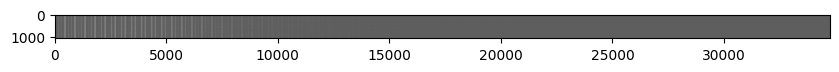

In [289]:
print(descripteurs_array.shape)
plt.figure(figsize=(10,10))
plt.imshow(descripteurs_array, cmap='gray')

<div class="alert alert-success">
    <font id="section_9">
    <h1 style="font-size:25px;"><strong>9.0 Création de nouvelles features à partir des descripteurs</strong></h1>
</div>

In [290]:
descripteurs_total[0].shape

(98, 64)

In [291]:
np.var(descripteurs_total[0])

0.013280589

In [292]:
from scipy.stats import moment

liste_min = [np.min(descripteur) for descripteur in descripteurs_total]
liste_max = [np.max(descripteur) for descripteur in descripteurs_total]
liste_mean = [np.mean(descripteur) for descripteur in descripteurs_total]
liste_var = [np.var(descripteur) for descripteur in descripteurs_total]
liste_order_3 = [np.mean(moment(descripteur, moment = 3, axis=1)) for descripteur in descripteurs_total]
liste_order_4 = [np.mean(moment(descripteur, moment = 4, axis=1)) for descripteur in descripteurs_total]

In [293]:
array_features_descripteurs = np.vstack([liste_min, liste_max, liste_mean, liste_var, liste_order_3, liste_order_4])

<AxesSubplot:title={'center':'Mean Moment 4th order'}, ylabel='Density'>

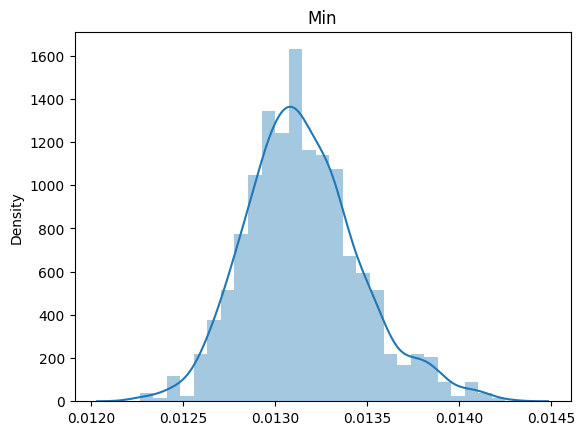

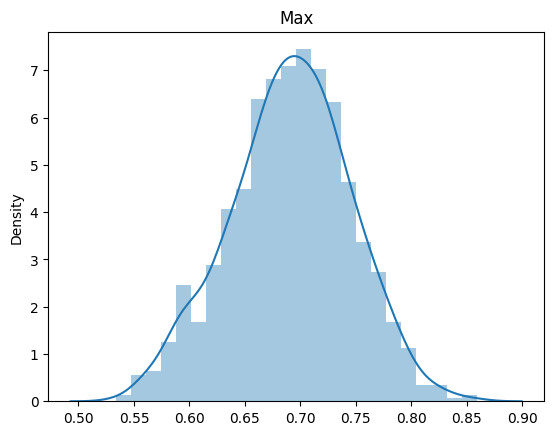

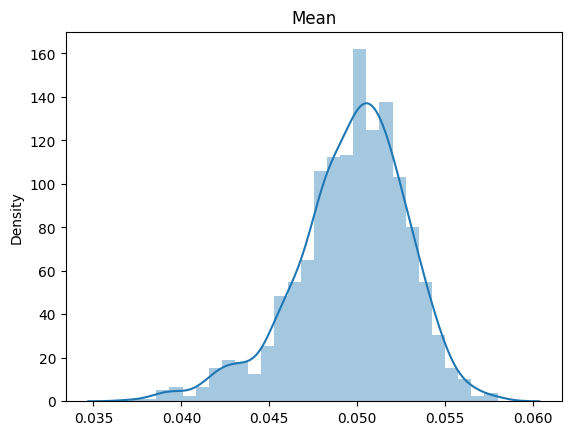

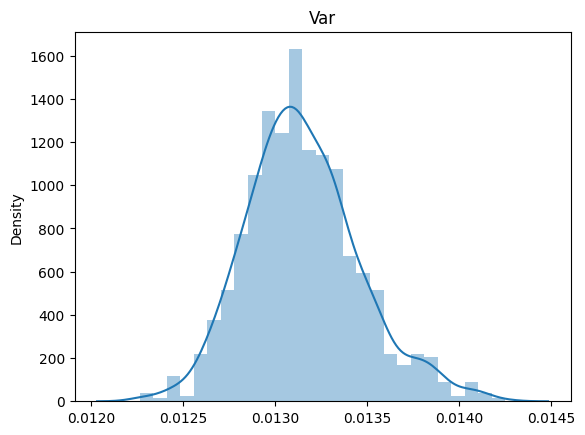

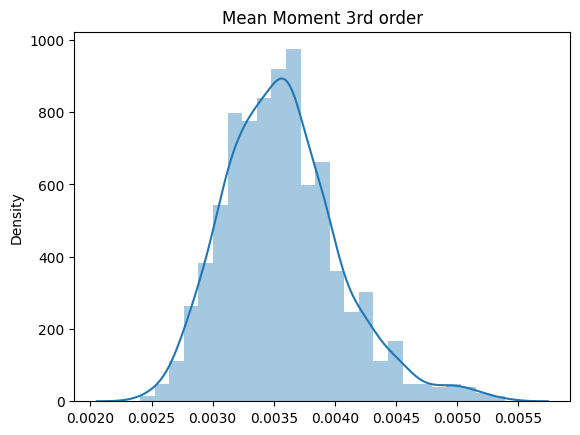

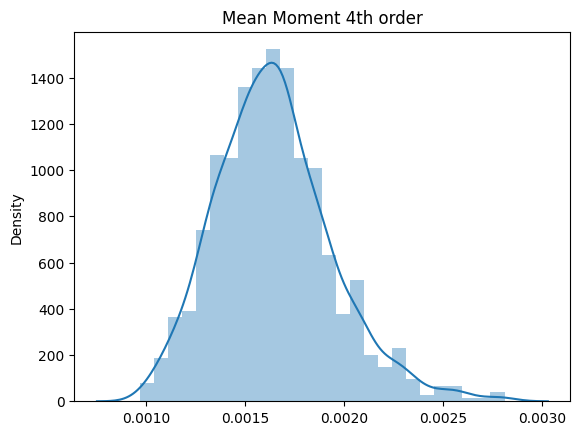

In [294]:
%matplotlib inline

plt.figure()
plt.title('Min')
sns.distplot(liste_var)

plt.figure()
plt.title('Max')
sns.distplot(liste_max)

plt.figure()
plt.title('Mean')
sns.distplot(liste_mean)

plt.figure()
plt.title('Var')
sns.distplot(liste_var)

plt.figure()
plt.title('Mean Moment 3rd order')
sns.distplot(liste_order_3)

plt.figure()
plt.title('Mean Moment 4th order')
sns.distplot(liste_order_4)

## Export

In [295]:
np.save('array_descripteurs.csv', descripteurs_array)
np.save('array_features_descripteurs', array_features_descripteurs)

<div class="alert alert-success">
    <font id="section_10">
    <h1 style="font-size:25px;"><strong>10 Classifieur non supervisé</strong></h1>
</div>

<div class="alert alert-success">
    <font id="section_10_1">
    <h1 style="font-size:25px;"><strong>10.1 ACP</strong></h1>
</div>

Mettre en œuvre des techniques de réduction de dimension.                    

* **CE1** Vous avez justifié la nécessité de la réduction de dimension. 
* **CE2** Vous avez appliqué une méthode de réduction de dimension adaptée à la problématique (ex. : ACP). 
* **CE3** Vous avez justifié le choix des valeurs des paramètres dans la méthode de réduction de dimension retenue (ex. : le nombre de dimensions conservées pour l'ACP).

In [296]:
pca_descripteurs = PCA()
features_ss = StandardScaler()
pca_descripteurs.fit(features_ss.fit_transform(np.transpose(descripteurs_array.T)))

PCA()

In [297]:
pca_descripteurs.n_components_

1050

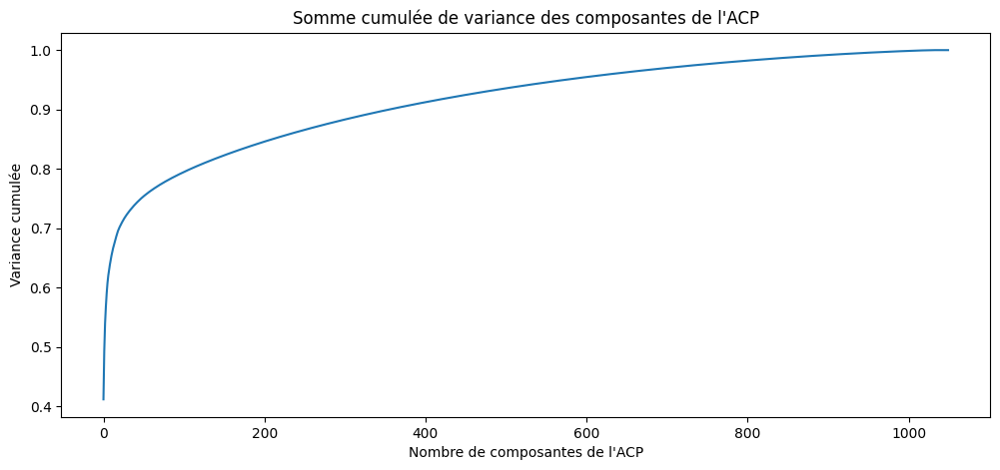

In [298]:
plt.figure(figsize=(12,5))
plt.title('Somme cumulée de variance des composantes de l\'ACP')
plt.xlabel('Nombre de composantes de l\'ACP')
plt.ylabel('Variance cumulée')
plt.plot(list(range(descripteurs_array.shape[0])),
         np.cumsum(pca_descripteurs.explained_variance_ratio_))

In [299]:
np.cumsum(pca_descripteurs.explained_variance_ratio_)[650]

0.9627537062390517

96 % de la variance totale avec 650 features

In [300]:
array_descripteurs_reduit = pca_descripteurs.transform(descripteurs_array[:650,:])

In [301]:
array_descripteurs_reduit.shape

(650, 1050)

In [302]:
np.save('array_descripteurs_reduit.csv', array_descripteurs_reduit)

<div class="alert alert-success">
    <font id="section_10_2">
    <h1 style="font-size:25px;"><strong>10.2 Classification</strong></h1>
</div>

In [303]:
#from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

<div class="alert alert-success">
    <font id="section_10_3">
    <h1 style="font-size:25px;"><strong>10.3 Kmeans</strong></h1>
</div>

In [304]:
#Attention processeur à 100% pendant 3 min

dict_kmeans = {}
inertia = {}
max_clusters=80

f = IntProgress(min=0, max=max_clusters) # instantiate the bar
chaine = str(0)+'/'+str(max_count)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters+1):
    kmeans = KMeans(n_clusters=k,
                   verbose=1,
                   random_state=0).fit(array_descripteurs_reduit)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k+1)+'/'+str(max_clusters)

IntProgress(value=0, max=80)

Text(value='0/50')

Initialization complete
Iteration 0, inertia 44699.477686487786.
Iteration 1, inertia 19820.161373646904.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 35782.37546089015.
Iteration 1, inertia 19820.161373646904.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 43231.81777949196.
Iteration 1, inertia 19820.161373646904.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 39384.7858713074.
Iteration 1, inertia 19820.161373646904.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 36792.64413568689.
Iteration 1, inertia 19820.161373646904.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 37547.19072589828.
Iteration 1, inertia 19820.161373646904.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 54791.10524792972.
Iteration 1, inertia 19820.161

Iteration 7, inertia 16169.098442575487
Iteration 8, inertia 16157.749907996866
Iteration 9, inertia 16152.912641486819
Iteration 10, inertia 16147.879231254497
Iteration 11, inertia 16144.593977094406
Iteration 12, inertia 16144.03498510418
Iteration 13, inertia 16143.806374149704
Converged at iteration 13: strict convergence.
Initialization complete
Iteration 0, inertia 30414.767357523648
Iteration 1, inertia 16622.81323080208
Iteration 2, inertia 16471.68954076293
Iteration 3, inertia 16390.694843939902
Iteration 4, inertia 16352.215632730738
Iteration 5, inertia 16341.023655259743
Iteration 6, inertia 16333.413649079968
Iteration 7, inertia 16326.535679088309
Iteration 8, inertia 16319.99697708856
Iteration 9, inertia 16315.658727891518
Iteration 10, inertia 16310.177947649077
Iteration 11, inertia 16305.274052025265
Iteration 12, inertia 16299.79423142883
Iteration 13, inertia 16298.136771208385
Iteration 14, inertia 16295.529326720145
Iteration 15, inertia 16290.529378801855
Iter

Iteration 8, inertia 15646.299984263827
Iteration 9, inertia 15608.84777170184
Iteration 10, inertia 15581.299600283906
Iteration 11, inertia 15571.920322438946
Iteration 12, inertia 15564.52620708815
Iteration 13, inertia 15559.177876876289
Iteration 14, inertia 15554.914901175394
Iteration 15, inertia 15551.935221190199
Iteration 16, inertia 15549.799432810049
Iteration 17, inertia 15544.179859349844
Iteration 18, inertia 15538.87090716559
Iteration 19, inertia 15536.577160209372
Iteration 20, inertia 15534.38087298613
Iteration 21, inertia 15533.591491831683
Iteration 22, inertia 15532.358770603347
Iteration 23, inertia 15531.824199549625
Converged at iteration 23: strict convergence.
Initialization complete
Iteration 0, inertia 30148.099235563506
Iteration 1, inertia 16114.847260281696
Iteration 2, inertia 15892.743970107029
Iteration 3, inertia 15739.605718706405
Iteration 4, inertia 15680.222587949356
Iteration 5, inertia 15645.100029409617
Iteration 6, inertia 15624.592631322366

Iteration 12, inertia 15247.129772694363
Iteration 13, inertia 15245.161332887146
Iteration 14, inertia 15242.37091971559
Iteration 15, inertia 15238.017208317586
Iteration 16, inertia 15234.590741240932
Iteration 17, inertia 15232.709850726795
Iteration 18, inertia 15231.436838898975
Iteration 19, inertia 15230.579075433576
Iteration 20, inertia 15229.201407554105
Iteration 21, inertia 15227.855442585987
Iteration 22, inertia 15227.163695801162
Iteration 23, inertia 15225.698198635282
Iteration 24, inertia 15225.205040573714
Converged at iteration 24: strict convergence.
Initialization complete
Iteration 0, inertia 27730.385830252664
Iteration 1, inertia 15262.0077659077
Iteration 2, inertia 15206.409273749827
Iteration 3, inertia 15198.24735791702
Iteration 4, inertia 15196.11942098848
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 28052.37103554156
Iteration 1, inertia 15540.923568205395
Iteration 2, inertia 15311.967845286305
Iteration 3,

Iteration 10, inertia 15016.993139252358
Iteration 11, inertia 15016.323131574894
Converged at iteration 11: strict convergence.
Initialization complete
Iteration 0, inertia 29004.882752203994
Iteration 1, inertia 15436.219367563195
Iteration 2, inertia 15140.230969864368
Iteration 3, inertia 15065.57584476327
Iteration 4, inertia 15019.207484177114
Iteration 5, inertia 14981.474600093803
Iteration 6, inertia 14955.664996136464
Iteration 7, inertia 14937.828658850973
Iteration 8, inertia 14925.541222473585
Iteration 9, inertia 14921.176833999683
Iteration 10, inertia 14914.631219203098
Iteration 11, inertia 14910.043315162187
Iteration 12, inertia 14908.338751241816
Iteration 13, inertia 14906.519908917588
Iteration 14, inertia 14904.505193199146
Iteration 15, inertia 14901.132912938912
Iteration 16, inertia 14900.319654639443
Iteration 17, inertia 14898.833059536688
Iteration 18, inertia 14898.146601856515
Converged at iteration 18: strict convergence.
Initialization complete
Iteratio

Iteration 13, inertia 14771.905355982126
Iteration 14, inertia 14770.273321495624
Converged at iteration 14: strict convergence.
Initialization complete
Iteration 0, inertia 29052.748711492128
Iteration 1, inertia 15061.654014486081
Iteration 2, inertia 14869.002054947763
Iteration 3, inertia 14792.892231239106
Iteration 4, inertia 14771.02066772983
Iteration 5, inertia 14765.494137700423
Iteration 6, inertia 14760.180722259764
Iteration 7, inertia 14757.191333891298
Iteration 8, inertia 14756.100794791513
Iteration 9, inertia 14755.146876219089
Iteration 10, inertia 14754.231990769724
Converged at iteration 10: strict convergence.
Initialization complete
Iteration 0, inertia 27736.515423299094
Iteration 1, inertia 15029.723756990817
Iteration 2, inertia 14898.630084065786
Iteration 3, inertia 14832.30760153787
Iteration 4, inertia 14721.808033636107
Iteration 5, inertia 14613.941284244513
Iteration 6, inertia 14585.312395903058
Iteration 7, inertia 14572.453476086297
Iteration 8, iner

Iteration 0, inertia 26789.195287120856
Iteration 1, inertia 14768.242835330355
Iteration 2, inertia 14625.322784816311
Iteration 3, inertia 14592.545982148627
Iteration 4, inertia 14581.431195013594
Iteration 5, inertia 14577.238011252935
Iteration 6, inertia 14576.61420531011
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 26919.71749081504
Iteration 1, inertia 14817.570917887293
Iteration 2, inertia 14697.68829225622
Iteration 3, inertia 14675.462901159919
Iteration 4, inertia 14664.026709012564
Iteration 5, inertia 14661.969301208372
Iteration 6, inertia 14661.123939326584
Iteration 7, inertia 14660.430554291597
Iteration 8, inertia 14660.009596395425
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 27000.916949942937
Iteration 1, inertia 14911.826718368866
Iteration 2, inertia 14812.504661574694
Iteration 3, inertia 14768.6027861218
Iteration 4, inertia 14747.955164772477
Iteration 5, inertia 1473

Iteration 8, inertia 14375.251820219904
Iteration 9, inertia 14372.092996575693
Iteration 10, inertia 14368.068359744384
Iteration 11, inertia 14365.934397295163
Iteration 12, inertia 14364.966737455583
Iteration 13, inertia 14363.808159432298
Iteration 14, inertia 14362.867513727202
Converged at iteration 14: strict convergence.
Initialization complete
Iteration 0, inertia 26336.461941743142
Iteration 1, inertia 14616.491885971234
Iteration 2, inertia 14445.206795145588
Iteration 3, inertia 14378.029352228117
Iteration 4, inertia 14372.108368365907
Iteration 5, inertia 14369.691764050736
Iteration 6, inertia 14367.622161600988
Iteration 7, inertia 14365.729927325694
Iteration 8, inertia 14365.140219180777
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 25873.712280907443
Iteration 1, inertia 14723.860287190879
Iteration 2, inertia 14581.996993673041
Iteration 3, inertia 14531.105973422063
Iteration 4, inertia 14502.799493363707
Iteration 5, i

Iteration 6, inertia 14240.061807696442
Iteration 7, inertia 14236.107877471442
Iteration 8, inertia 14235.344926313768
Iteration 9, inertia 14233.7095429276
Iteration 10, inertia 14233.083044217236
Iteration 11, inertia 14232.271747829875
Iteration 12, inertia 14231.566396466094
Iteration 13, inertia 14230.836860347645
Converged at iteration 13: strict convergence.
Initialization complete
Iteration 0, inertia 26149.13402301241
Iteration 1, inertia 14687.15433871734
Iteration 2, inertia 14543.008669010294
Iteration 3, inertia 14496.754624647887
Iteration 4, inertia 14480.587730593661
Iteration 5, inertia 14476.180935868513
Iteration 6, inertia 14473.625187795846
Iteration 7, inertia 14471.578275332424
Iteration 8, inertia 14470.116735614429
Iteration 9, inertia 14468.056108304027
Iteration 10, inertia 14466.689164938689
Converged at iteration 10: strict convergence.
Initialization complete
Iteration 0, inertia 25374.298976386734
Iteration 1, inertia 14519.703258136336
Iteration 2, iner

Iteration 5, inertia 14207.659495292437
Iteration 6, inertia 14203.951163538213
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 25656.5342634217
Iteration 1, inertia 14450.948529976664
Iteration 2, inertia 14264.4394827195
Iteration 3, inertia 14225.502579198135
Iteration 4, inertia 14213.8550038443
Iteration 5, inertia 14204.774499912746
Iteration 6, inertia 14202.325924697278
Iteration 7, inertia 14200.718303558207
Iteration 8, inertia 14199.142594074872
Iteration 9, inertia 14198.664972843177
Converged at iteration 9: strict convergence.
Initialization complete
Iteration 0, inertia 26153.75396261007
Iteration 1, inertia 14593.53185321275
Iteration 2, inertia 14397.768708367237
Iteration 3, inertia 14276.636970422225
Iteration 4, inertia 14237.714144745154
Iteration 5, inertia 14228.767770054148
Iteration 6, inertia 14228.160848872716
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 26199.03553646562

Iteration 8, inertia 14063.834522867166
Iteration 9, inertia 14061.796051534735
Iteration 10, inertia 14061.047317291424
Iteration 11, inertia 14058.200122911016
Iteration 12, inertia 14055.178668689798
Iteration 13, inertia 14054.39140966679
Iteration 14, inertia 14049.37078449647
Iteration 15, inertia 14044.513419144985
Iteration 16, inertia 14042.34738271963
Iteration 17, inertia 14041.294886333737
Iteration 18, inertia 14040.543088082719
Converged at iteration 18: strict convergence.
Initialization complete
Iteration 0, inertia 25122.710674508366
Iteration 1, inertia 14316.950094558142
Iteration 2, inertia 14148.849465201214
Iteration 3, inertia 14076.569357563641
Iteration 4, inertia 14060.309259773698
Iteration 5, inertia 14059.27016138691
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 25253.730601815692
Iteration 1, inertia 14314.92552747929
Iteration 2, inertia 14109.43690818652
Iteration 3, inertia 14073.282296744224
Iteration 4, ine

Iteration 5, inertia 14047.939146391533
Iteration 6, inertia 14011.472280216678
Iteration 7, inertia 13979.703148493807
Iteration 8, inertia 13975.162494086127
Iteration 9, inertia 13971.174348626853
Iteration 10, inertia 13967.91792967838
Converged at iteration 10: strict convergence.
Initialization complete
Iteration 0, inertia 25434.693290525272
Iteration 1, inertia 14219.406786514279
Iteration 2, inertia 14102.666411672215
Iteration 3, inertia 14032.261563580585
Iteration 4, inertia 13996.087508102162
Iteration 5, inertia 13975.651503156776
Iteration 6, inertia 13966.863401260973
Iteration 7, inertia 13963.537410983627
Iteration 8, inertia 13961.855237872527
Iteration 9, inertia 13959.980313440332
Converged at iteration 9: strict convergence.
Initialization complete
Iteration 0, inertia 25169.285327320205
Iteration 1, inertia 14221.464299766007
Iteration 2, inertia 14097.89448202193
Iteration 3, inertia 14032.830817896527
Iteration 4, inertia 14011.04629754828
Iteration 5, inertia 

Iteration 5, inertia 13926.146547773338
Iteration 6, inertia 13919.905086613813
Iteration 7, inertia 13918.159635624022
Iteration 8, inertia 13917.213261961673
Iteration 9, inertia 13916.41151924448
Iteration 10, inertia 13915.20618842998
Converged at iteration 10: strict convergence.
Initialization complete
Iteration 0, inertia 24670.987239372665
Iteration 1, inertia 14101.330524503765
Iteration 2, inertia 14001.499464667166
Iteration 3, inertia 13953.87715338875
Iteration 4, inertia 13931.859112978153
Iteration 5, inertia 13924.554479897382
Iteration 6, inertia 13918.632539621387
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 24574.19542375083
Iteration 1, inertia 14194.88944530984
Iteration 2, inertia 14023.637628822764
Iteration 3, inertia 13991.143779238499
Iteration 4, inertia 13984.32191391386
Iteration 5, inertia 13980.490660790538
Iteration 6, inertia 13975.599796231432
Iteration 7, inertia 13974.838276656283
Converged at iteration 7

Initialization complete
Iteration 0, inertia 24048.427717272232
Iteration 1, inertia 14131.418427479437
Iteration 2, inertia 14039.466879761421
Iteration 3, inertia 14015.096427339404
Iteration 4, inertia 14006.744688577684
Iteration 5, inertia 14001.001254684386
Iteration 6, inertia 13999.281605925098
Iteration 7, inertia 13997.225418059976
Iteration 8, inertia 13994.964087424109
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 24469.021743308447
Iteration 1, inertia 14040.120675790153
Iteration 2, inertia 13903.268840015175
Iteration 3, inertia 13856.332934851484
Iteration 4, inertia 13831.865107081401
Iteration 5, inertia 13827.850435621429
Iteration 6, inertia 13825.190248834946
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 24402.750300502652
Iteration 1, inertia 14119.723593224468
Iteration 2, inertia 13964.124772413805
Iteration 3, inertia 13909.457603715346
Iteration 4, inertia 13888.865786612

Iteration 6, inertia 13771.392689016178
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 24066.195579595023
Iteration 1, inertia 14004.201039902644
Iteration 2, inertia 13884.229284751915
Iteration 3, inertia 13848.298725344544
Iteration 4, inertia 13829.823127795984
Iteration 5, inertia 13819.357420875715
Iteration 6, inertia 13816.922154395428
Iteration 7, inertia 13815.736947219646
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 24189.80986457004
Iteration 1, inertia 13961.326095175178
Iteration 2, inertia 13839.715846647643
Iteration 3, inertia 13806.757345649004
Iteration 4, inertia 13784.678583131928
Iteration 5, inertia 13764.70406383302
Iteration 6, inertia 13752.638537957268
Iteration 7, inertia 13749.049397927123
Iteration 8, inertia 13748.010520290596
Iteration 9, inertia 13747.420667953882
Converged at iteration 9: strict convergence.
Initialization complete
Iteration 0, inertia 24045.46076

Iteration 1, inertia 13812.863943686822
Iteration 2, inertia 13707.799438898355
Iteration 3, inertia 13687.425726242509
Iteration 4, inertia 13678.238753873089
Iteration 5, inertia 13675.23682677054
Iteration 6, inertia 13673.289850735917
Iteration 7, inertia 13672.56372313066
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 24145.498708118736
Iteration 1, inertia 13855.07672853533
Iteration 2, inertia 13770.8604770687
Iteration 3, inertia 13738.072170805895
Iteration 4, inertia 13719.935284959627
Iteration 5, inertia 13706.98568674005
Iteration 6, inertia 13699.341555610968
Iteration 7, inertia 13686.8743972844
Iteration 8, inertia 13677.517137220355
Iteration 9, inertia 13670.237898719952
Iteration 10, inertia 13669.285989449563
Converged at iteration 10: strict convergence.
Initialization complete
Iteration 0, inertia 24006.336216697262
Iteration 1, inertia 13881.349926400992
Iteration 2, inertia 13769.609038703979
Iteration 3, inertia 13727

Initialization complete
Iteration 0, inertia 23873.7438562332
Iteration 1, inertia 13802.472170051611
Iteration 2, inertia 13701.60835162168
Iteration 3, inertia 13668.3464311808
Iteration 4, inertia 13647.385066169165
Iteration 5, inertia 13633.061285536236
Iteration 6, inertia 13625.43829693824
Iteration 7, inertia 13619.924825344977
Iteration 8, inertia 13612.537208264725
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 23857.608697614116
Iteration 1, inertia 13788.21029395756
Iteration 2, inertia 13700.48164937118
Iteration 3, inertia 13675.538964052525
Iteration 4, inertia 13666.327971964733
Iteration 5, inertia 13664.116835341392
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 23834.659342990108
Iteration 1, inertia 13778.58397101346
Iteration 2, inertia 13698.675955452745
Iteration 3, inertia 13684.843241651914
Iteration 4, inertia 13666.55576833797
Iteration 5, inertia 13658.83626462531
Iterati

Iteration 1, inertia 13841.414526609024
Iteration 2, inertia 13727.008772642064
Iteration 3, inertia 13677.350942276436
Iteration 4, inertia 13654.008604968301
Iteration 5, inertia 13645.788998105572
Iteration 6, inertia 13642.501500628574
Iteration 7, inertia 13641.137303141411
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 23879.82650925896
Iteration 1, inertia 13656.363309120436
Iteration 2, inertia 13572.332608738421
Iteration 3, inertia 13546.884226147356
Iteration 4, inertia 13538.731921400948
Iteration 5, inertia 13535.55213437331
Iteration 6, inertia 13532.148489128707
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 23323.143622004278
Iteration 1, inertia 13615.502423312335
Iteration 2, inertia 13547.055371942326
Iteration 3, inertia 13526.966385858053
Iteration 4, inertia 13513.205305139883
Iteration 5, inertia 13505.195599753126
Iteration 6, inertia 13504.225385458296
Iteration 7, inertia 1

Iteration 3, inertia 13482.580064640208
Iteration 4, inertia 13467.184094601322
Iteration 5, inertia 13458.844354787176
Iteration 6, inertia 13457.86112451198
Iteration 7, inertia 13456.861200506979
Iteration 8, inertia 13455.722336328987
Iteration 9, inertia 13453.27240288278
Iteration 10, inertia 13452.635910008405
Converged at iteration 10: strict convergence.
Initialization complete
Iteration 0, inertia 23641.449196363297
Iteration 1, inertia 13621.72969250827
Iteration 2, inertia 13514.512472319395
Iteration 3, inertia 13485.167207679959
Iteration 4, inertia 13472.538168222192
Iteration 5, inertia 13466.862362653641
Iteration 6, inertia 13465.636368621905
Iteration 7, inertia 13464.522821121811
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 23600.304947258424
Iteration 1, inertia 13618.100686342423
Iteration 2, inertia 13520.18953637588
Iteration 3, inertia 13483.20052178856
Iteration 4, inertia 13462.353560933096
Iteration 5, inertia 13

Initialization complete
Iteration 0, inertia 23350.336553944744
Iteration 1, inertia 13634.844099153957
Iteration 2, inertia 13555.435087197018
Iteration 3, inertia 13500.781709405073
Iteration 4, inertia 13486.13936288821
Iteration 5, inertia 13479.099520483596
Iteration 6, inertia 13468.395447105933
Iteration 7, inertia 13465.335200028327
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 23687.396374418124
Iteration 1, inertia 13519.496135970434
Iteration 2, inertia 13425.836916950646
Iteration 3, inertia 13397.970022434358
Iteration 4, inertia 13390.686937623768
Iteration 5, inertia 13388.501384087544
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 22971.03415582994
Iteration 1, inertia 13602.812747997186
Iteration 2, inertia 13505.339879694371
Iteration 3, inertia 13472.797999364113
Iteration 4, inertia 13460.462962585423
Iteration 5, inertia 13452.459761424565
Iteration 6, inertia 13451.19957650177

Iteration 0, inertia 23062.986226046254
Iteration 1, inertia 13508.892264096527
Iteration 2, inertia 13417.032670049059
Iteration 3, inertia 13399.664668944875
Iteration 4, inertia 13381.414606079536
Iteration 5, inertia 13368.928218245721
Iteration 6, inertia 13361.840797963014
Iteration 7, inertia 13359.907550087668
Iteration 8, inertia 13358.252891830185
Iteration 9, inertia 13357.08125111435
Converged at iteration 9: strict convergence.
Initialization complete
Iteration 0, inertia 23258.252358329613
Iteration 1, inertia 13562.763762211705
Iteration 2, inertia 13456.06654844034
Iteration 3, inertia 13395.247811430569
Iteration 4, inertia 13366.41975573431
Iteration 5, inertia 13348.820057196011
Iteration 6, inertia 13337.058342586732
Iteration 7, inertia 13332.888172929555
Iteration 8, inertia 13330.234507899127
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 23411.654429191796
Iteration 1, inertia 13498.940947135568
Iteration 2, inertia 13

Iteration 5, inertia 13280.962420164335
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 23062.92657531188
Iteration 1, inertia 13389.70377485737
Iteration 2, inertia 13316.035307207245
Iteration 3, inertia 13294.337025497147
Iteration 4, inertia 13280.530342890732
Iteration 5, inertia 13274.776815881421
Iteration 6, inertia 13273.173730496073
Iteration 7, inertia 13271.978357730299
Iteration 8, inertia 13270.978123603862
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 22928.21233882096
Iteration 1, inertia 13342.533739547758
Iteration 2, inertia 13280.478993178884
Iteration 3, inertia 13264.076184138084
Iteration 4, inertia 13256.268345131275
Iteration 5, inertia 13249.62814831044
Iteration 6, inertia 13247.014404756359
Iteration 7, inertia 13245.915216662104
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 22687.38697027789
Iteration 1, inertia 13393.69974490

Initialization complete
Iteration 0, inertia 23019.593572455127
Iteration 1, inertia 13309.619555574158
Iteration 2, inertia 13218.189165148822
Iteration 3, inertia 13200.272911239965
Iteration 4, inertia 13195.496156626394
Iteration 5, inertia 13192.883577578645
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 22621.80977195504
Iteration 1, inertia 13287.12629790669
Iteration 2, inertia 13210.111665031354
Iteration 3, inertia 13186.977365907976
Iteration 4, inertia 13175.457522851235
Iteration 5, inertia 13164.574439711389
Iteration 6, inertia 13159.726156663733
Iteration 7, inertia 13155.00659122192
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 22929.129431125082
Iteration 1, inertia 13248.004366535488
Iteration 2, inertia 13184.710078223328
Iteration 3, inertia 13178.238679275615
Iteration 4, inertia 13173.824697290203
Iteration 5, inertia 13169.889764959542
Iteration 6, inertia 13167.065571991241

Initialization complete
Iteration 0, inertia 22622.81661232196
Iteration 1, inertia 13236.772949525206
Iteration 2, inertia 13151.251180555899
Iteration 3, inertia 13128.086030387522
Iteration 4, inertia 13117.798618642411
Iteration 5, inertia 13112.829341508264
Iteration 6, inertia 13107.79108104212
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 22620.794159795783
Iteration 1, inertia 13169.39888563943
Iteration 2, inertia 13113.079751299432
Iteration 3, inertia 13095.007782596944
Iteration 4, inertia 13085.39168867838
Iteration 5, inertia 13077.222803413773
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 22489.370202490038
Iteration 1, inertia 13151.337796878392
Iteration 2, inertia 13094.534794452877
Iteration 3, inertia 13070.602980107347
Iteration 4, inertia 13064.404104906953
Iteration 5, inertia 13063.328074371564
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 

Initialization complete
Iteration 0, inertia 22447.32589681407
Iteration 1, inertia 13162.404900417732
Iteration 2, inertia 13098.829289698508
Iteration 3, inertia 13081.896716136664
Iteration 4, inertia 13072.23881629949
Iteration 5, inertia 13066.525122777846
Iteration 6, inertia 13064.737144232713
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 22637.260655686787
Iteration 1, inertia 13103.473010960051
Iteration 2, inertia 13044.470347491348
Iteration 3, inertia 13024.893732437984
Iteration 4, inertia 13018.227226008017
Iteration 5, inertia 13010.094901705503
Iteration 6, inertia 13009.05437934248
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 22350.12894350341
Iteration 1, inertia 13115.494542305767
Iteration 2, inertia 13062.049889617063
Iteration 3, inertia 13035.247100273678
Iteration 4, inertia 13023.256400537184
Iteration 5, inertia 13017.79584685324
Iteration 6, inertia 13014.907546821305
I

Iteration 0, inertia 22075.204326896383
Iteration 1, inertia 13069.180460664697
Iteration 2, inertia 13009.056921766958
Iteration 3, inertia 12989.473651212118
Iteration 4, inertia 12979.592207033422
Iteration 5, inertia 12974.416648072338
Iteration 6, inertia 12968.030788856679
Iteration 7, inertia 12962.162849881464
Iteration 8, inertia 12961.04399061434
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 22399.896376574718
Iteration 1, inertia 13114.933839124089
Iteration 2, inertia 13050.400045369004
Iteration 3, inertia 13029.594699831126
Iteration 4, inertia 13026.05444094117
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 22221.156298439575
Iteration 1, inertia 13092.594578171102
Iteration 2, inertia 13031.63099302035
Iteration 3, inertia 13003.24406656203
Iteration 4, inertia 12988.251657184603
Iteration 5, inertia 12977.326418268129
Iteration 6, inertia 12971.276680545798
Iteration 7, inertia 129

Iteration 1, inertia 13049.031897165269
Iteration 2, inertia 12967.326950073926
Iteration 3, inertia 12941.544379366493
Iteration 4, inertia 12928.462505691514
Iteration 5, inertia 12925.896907616152
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 22195.554977125918
Iteration 1, inertia 12982.687956043754
Iteration 2, inertia 12917.246758598465
Iteration 3, inertia 12900.952962784493
Iteration 4, inertia 12892.354530301762
Iteration 5, inertia 12886.689374854639
Iteration 6, inertia 12885.01981776237
Iteration 7, inertia 12883.273611958737
Iteration 8, inertia 12881.611980819727
Iteration 9, inertia 12880.080778503627
Converged at iteration 9: strict convergence.
Initialization complete
Iteration 0, inertia 22075.665108103596
Iteration 1, inertia 12989.562934741118
Iteration 2, inertia 12923.214140938428
Iteration 3, inertia 12917.817029080226
Iteration 4, inertia 12914.071439063584
Converged at iteration 4: strict convergence.
Initialization 

Initialization complete
Iteration 0, inertia 22223.26741032028
Iteration 1, inertia 12953.36539875884
Iteration 2, inertia 12900.848261988742
Iteration 3, inertia 12881.357285927777
Iteration 4, inertia 12872.100995613062
Iteration 5, inertia 12866.481033513388
Iteration 6, inertia 12863.734720491948
Iteration 7, inertia 12861.38206577975
Iteration 8, inertia 12860.219080165509
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 22027.336261075736
Iteration 1, inertia 12862.146142015912
Iteration 2, inertia 12804.374868639681
Iteration 3, inertia 12790.29506159491
Iteration 4, inertia 12785.477725049415
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 22108.796864355325
Iteration 1, inertia 12903.684295481078
Iteration 2, inertia 12838.516368317103
Iteration 3, inertia 12815.903483667915
Iteration 4, inertia 12806.325619848412
Iteration 5, inertia 12801.895782886622
Iteration 6, inertia 12799.255209229075


Iteration 2, inertia 12758.063860053246
Iteration 3, inertia 12737.702545810058
Iteration 4, inertia 12730.07352816117
Iteration 5, inertia 12725.265109255673
Iteration 6, inertia 12718.495801499601
Iteration 7, inertia 12715.366972292448
Iteration 8, inertia 12714.10011530952
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 21828.696454438494
Iteration 1, inertia 12931.52870061074
Iteration 2, inertia 12868.100596674109
Iteration 3, inertia 12847.363907936839
Iteration 4, inertia 12841.382372932341
Iteration 5, inertia 12834.388269015795
Iteration 6, inertia 12828.078608438645
Iteration 7, inertia 12826.434918914847
Iteration 8, inertia 12823.998006762022
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 21821.566955843704
Iteration 1, inertia 12789.026427259209
Iteration 2, inertia 12757.03140606899
Iteration 3, inertia 12749.741826073006
Iteration 4, inertia 12744.285550504861
Iteration 5, inertia 127

Iteration 1, inertia 12708.907175463622
Iteration 2, inertia 12662.392464638935
Iteration 3, inertia 12652.155943724836
Iteration 4, inertia 12646.528903094975
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 21707.670986165038
Iteration 1, inertia 12718.39452410321
Iteration 2, inertia 12663.734395630045
Iteration 3, inertia 12649.677963336086
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 21637.817567415845
Iteration 1, inertia 12765.996162414773
Iteration 2, inertia 12719.5542230063
Iteration 3, inertia 12705.491739526962
Iteration 4, inertia 12693.372311896612
Iteration 5, inertia 12688.51545834228
Iteration 6, inertia 12687.44075406568
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 21525.417692504296
Iteration 1, inertia 12761.358834611923
Iteration 2, inertia 12715.857569988058
Iteration 3, inertia 12710.917940991063
Iteration 4, inertia 12706.42547593

Initialization complete
Iteration 0, inertia 21573.213273308073
Iteration 1, inertia 12691.054389791429
Iteration 2, inertia 12651.635129000324
Iteration 3, inertia 12640.883391977623
Iteration 4, inertia 12631.187992425343
Iteration 5, inertia 12623.918085299292
Iteration 6, inertia 12619.553162539574
Iteration 7, inertia 12618.487715158739
Iteration 8, inertia 12617.253577288191
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 21513.980394264425
Iteration 1, inertia 12671.23757637135
Iteration 2, inertia 12628.330979241415
Iteration 3, inertia 12619.849665219059
Iteration 4, inertia 12609.900095597535
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 21260.63559005263
Iteration 1, inertia 12680.99951022676
Iteration 2, inertia 12648.035330061486
Iteration 3, inertia 12639.810437624676
Iteration 4, inertia 12635.959127879762
Converged at iteration 4: strict convergence.
Initialization complete
Iteration

Iteration 4, inertia 12513.477373131096
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 21420.244434391367
Iteration 1, inertia 12563.477747396899
Iteration 2, inertia 12517.849856729821
Iteration 3, inertia 12511.307857638953
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 21193.24209174012
Iteration 1, inertia 12647.880683390838
Iteration 2, inertia 12576.64384299985
Iteration 3, inertia 12557.258005736085
Iteration 4, inertia 12547.007968832604
Iteration 5, inertia 12545.903182908252
Iteration 6, inertia 12545.18311260457
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 21413.904326537064
Iteration 1, inertia 12714.035750731116
Iteration 2, inertia 12636.62204999962
Iteration 3, inertia 12619.503850946816
Iteration 4, inertia 12608.069139050163
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 21296.13570068656
Itera

Iteration 2, inertia 12431.09826232641
Iteration 3, inertia 12407.866603674931
Iteration 4, inertia 12399.90610574475
Iteration 5, inertia 12395.544082786275
Iteration 6, inertia 12393.823278684093
Iteration 7, inertia 12392.33245545751
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 20947.811704066684
Iteration 1, inertia 12533.774493801548
Iteration 2, inertia 12469.677194791378
Iteration 3, inertia 12446.177485558077
Iteration 4, inertia 12430.243551007325
Iteration 5, inertia 12423.007616838559
Iteration 6, inertia 12417.50461038764
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 21075.92547219209
Iteration 1, inertia 12488.630058188892
Iteration 2, inertia 12416.324869113343
Iteration 3, inertia 12390.683953075286
Iteration 4, inertia 12378.357631328032
Iteration 5, inertia 12372.01741060831
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 21240.790062424

Iteration 1, inertia 12419.422605333832
Iteration 2, inertia 12379.029786093763
Iteration 3, inertia 12373.028083045649
Iteration 4, inertia 12364.901051131807
Iteration 5, inertia 12354.111427693219
Iteration 6, inertia 12344.490838021657
Iteration 7, inertia 12341.127053852553
Iteration 8, inertia 12339.267332643862
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 20940.87270926308
Iteration 1, inertia 12394.468776302176
Iteration 2, inertia 12329.860659309817
Iteration 3, inertia 12311.10572367296
Iteration 4, inertia 12304.982972439197
Iteration 5, inertia 12299.79067087114
Iteration 6, inertia 12298.952949903114
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 21187.736392050552
Iteration 1, inertia 12366.238676166931
Iteration 2, inertia 12327.849580980897
Iteration 3, inertia 12322.181543651508
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 21137.783602

Initialization complete
Iteration 0, inertia 20888.448652140818
Iteration 1, inertia 12348.605685043613
Iteration 2, inertia 12301.42607014821
Iteration 3, inertia 12288.611357459793
Iteration 4, inertia 12286.722990821567
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 20676.56844520939
Iteration 1, inertia 12372.266517500608
Iteration 2, inertia 12318.403249522371
Iteration 3, inertia 12302.268055551842
Iteration 4, inertia 12290.957036458161
Iteration 5, inertia 12285.718576305828
Iteration 6, inertia 12282.687914947683
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 20932.661934109863
Iteration 1, inertia 12352.980626188455
Iteration 2, inertia 12325.706372477352
Iteration 3, inertia 12321.400462903275
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 20908.039008909673
Iteration 1, inertia 12358.518653865522
Iteration 2, inertia 12296.62390533282
Iteration

Initialization complete
Iteration 0, inertia 20816.175445204695
Iteration 1, inertia 12246.13500410544
Iteration 2, inertia 12196.007318900467
Iteration 3, inertia 12179.968851306656
Iteration 4, inertia 12178.092555145078
Iteration 5, inertia 12174.122305124176
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 20824.96362738725
Iteration 1, inertia 12291.972611683052
Iteration 2, inertia 12222.117558730335
Iteration 3, inertia 12210.612726058982
Iteration 4, inertia 12205.86104992577
Iteration 5, inertia 12204.303787373834
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 20865.318132018987
Iteration 1, inertia 12226.798925299732
Iteration 2, inertia 12191.17934866302
Iteration 3, inertia 12177.927779008563
Iteration 4, inertia 12169.174278702782
Iteration 5, inertia 12166.964586713288
Iteration 6, inertia 12164.99478965983
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0

Iteration 0, inertia 20642.46124429097
Iteration 1, inertia 12186.193742070134
Iteration 2, inertia 12124.159403717913
Iteration 3, inertia 12103.18515179303
Iteration 4, inertia 12095.781894296093
Iteration 5, inertia 12091.846377559217
Iteration 6, inertia 12088.843982115422
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 20395.39013294916
Iteration 1, inertia 12216.522483937186
Iteration 2, inertia 12171.481232493923
Iteration 3, inertia 12149.55719727536
Iteration 4, inertia 12138.045244451907
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 20628.55583848985
Iteration 1, inertia 12108.000678302562
Iteration 2, inertia 12052.083131411237
Iteration 3, inertia 12025.249081897044
Iteration 4, inertia 12018.178031078167
Iteration 5, inertia 12013.089511175169
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 20455.077479667118
Iteration 1, inertia 12189.23533665

<AxesSubplot:title={'center':'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

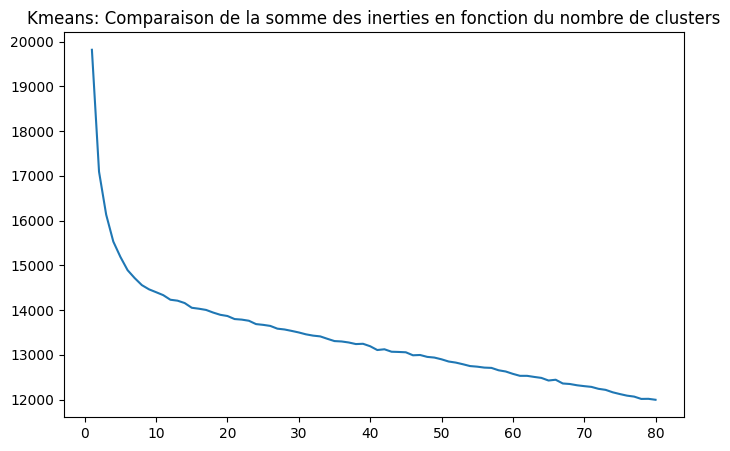

In [305]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(x = list(inertia.keys()),
             y = list(inertia.values())
            )

In [306]:
from sklearn.metrics import silhouette_score

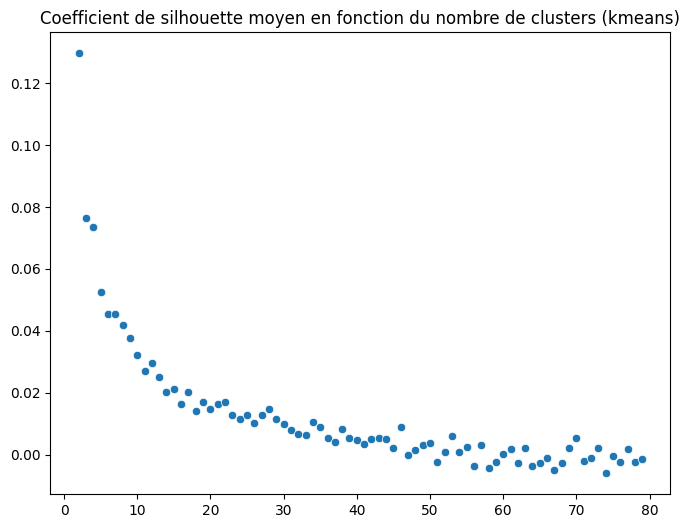

In [307]:
silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = array_descripteurs_reduit,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()


In [308]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters = key

le coefficient de silhouette est maximal pour 2 clusters (score = 0.12971637799774985)


<div class="alert alert-success">
    <font id="section_11">
    <h1 style="font-size:25px;"><strong>11. Visualisation des visual words</strong></h1>
</div>

<div class="alert alert-success">
    <font id="section_11_1">
    <h1 style="font-size:25px;"><strong>11.1 Exemple en prenant une séparation avec clusters</strong></h1>
</div>

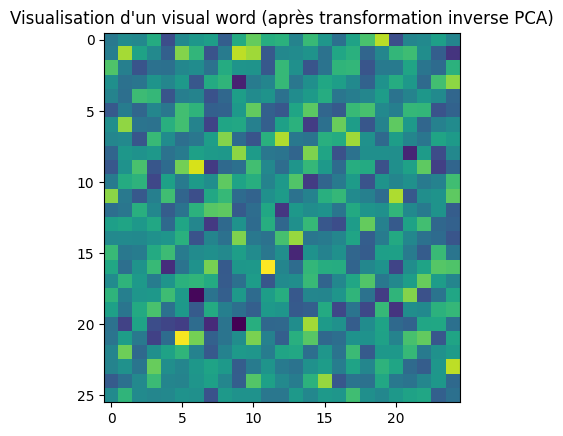

In [309]:
plt.title('Visualisation d\'un visual word (après transformation inverse PCA)')

plt.imshow(np.dot(dict_kmeans[25].cluster_centers_[4], pca_descripteurs.components_[:, :650]).reshape(26,25))

#### Histogrammes

<div class="alert alert-success">
    <font id="section_12">
    <h1 style="font-size:25px;"><strong>12. CNN Données visuelles</strong></h1>
</div>

* **CE3** Vous avez élaboré une fonction permettant d'extraire des features ("feature engineering") de type "bag-of-images" via la génération de descripteurs (algorithmes ORB, ou SIFT, ou SURF).                                    
* **CE4** Vous avez élaboré et exécuté une fonction permettant d'extraire des features ("feature engineering") via un algorithme de Transfer Learning basé sur des réseaux de neurones, comme par exemple CNN.                                   
* **CE5** Vous vous êtes assurés que les images utilisées ne relèvent pas d’une propriété intellectuelle. 


### Report fonctions

In [310]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2.imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1
    
    del compteur
    del im
    
    return liste_image

In [311]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))
    
    del shape
    
    return im

### Données

In [312]:
train['image'] = train['image'].apply(lambda x: 'Images/'+str(x))
test['image'] = test['image'].apply(lambda x: 'Images/'+str(x))

In [313]:
train_cnn = get_files(train.copy()['image'].tolist())
test_cnn = get_files(test.copy()['image'].tolist())

C:\Users\oscar\OneDrive\Documents\DataScientist\envs\Projet6\lib\site-packages\PIL\Image.py:3179: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [314]:
len(train_cnn)

787

In [315]:
len(test_cnn)

263

In [316]:
redim(train_cnn[0], 128, 128).shape

(128, 128, 3)

In [317]:
redim(train_cnn[0], 128, 128).reshape(1,-1,3).shape

(1, 16384, 3)

In [318]:
train_array_cnn = np.vstack([redim(img, 128, 128).reshape(1,128,128,3) for img in train_cnn])
test_array_cnn = np.vstack([redim(img, 128, 128).reshape(1,128,128,3) for img in test_cnn])

In [319]:
train_array_cnn.shape

(787, 128, 128, 3)

17 /23 'cat_lvl_2'

In [320]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(handle_unknown='ignore')
array_cats = ohe.fit_transform(np.array(train['cat_lvl_1']).reshape(-1,1))

In [321]:
array_cats.todense().shape

(787, 7)

In [322]:
array_cats.shape

(787, 7)

In [323]:
train_array_cats = ohe.transform(train[['cat_lvl_1']]).todense()
test_array_cats = ohe.transform(test[['cat_lvl_1']]).todense()

In [324]:
ohe.categories_

[array(['Baby Care', 'Beauty and Personal Care', 'Computers',
        'Home Decor & Festive Needs', 'Home Furnishing',
        'Kitchen & Dining', 'Watches'], dtype=object)]

<div class="alert alert-success">
    <font id="section_13">
    <h1 style="font-size:25px;"><strong>13. Construction Réseau</strong></h1>
</div>

**Définir la stratégie d’élaboration d’un modèle d'apprentissage profond, concevoir ou ré-utiliser des modèles pré-entraînés (transfer learning) et entraîner des modèles afin de réaliser une analyse prédictive.**

* **CE1** Vous avez défini votre stratégie d’élaboration d’un modèle pour répondre à un besoin métier (par exemple : choix de conception d’un modèle ré-utilisation de modèles pré-entraînés.
* **CE2** Vous avez identifié la ou les cibles. 
* **CE3** Vous avez réalisé la séparation du jeu de données en jeu d’entraînement, jeu de validation et jeu de test. 
* **CE4** Vous vous êtes assurés qu'il n’y a pas de fuite d’information entre les deux jeux de données (entraînement, validation et test). 
* **CE5** Vous avez testé plusieurs modèles d’apprentissage profond (par exemple à l’aide de la librairie Tensorflow / Keras) en partant du plus simple vers les plus complexes. 
* **CE6** Vous avez mis en oeuvre des modèles à partir de modèles pré-entraînés (technique de Transfer Learning)


In [326]:
#Attention !!!
#from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense, Activation

In [327]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu', input_shape=(128,128,3,)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(ohe.categories_[0].shape[0], activation='softmax'))
model.compile(loss='mean_squared_error', optimizer='sgd')

In [328]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 7)                 2

<div class="alert alert-success">
    <font id="section_13_1">
    <h1 style="font-size:25px;"><strong>13.1 Entraînement</strong></h1>
</div>

### Évaluer la performance des modèles d’apprentissage profond selon différents critères (scores, temps d'entraînement, etc.) afin de choisir le modèle le plus performant pour la problématique métier.

* **CE1** Vous avez choisi une métrique adaptée à la problématique métier, et sert à évaluer la performance des modèles 
* **CE2** Vous avez explicité le choix de la métrique d’évaluation 
* **CE3** Vous avez évalué la performance d’un modèle de référence et sert de comparaison pour évaluer la performance des modèles plus complexes 
* **CE4** Vous avez calculé, hormis la métrique choisie, au moins un autre indicateur pour comparer les modèles (par exemple : le temps nécessaire pour l’entraînement du modèle) 
* **CE5** Vous avez optimisé au moins un des hyperparamètres du modèle choisi (par exemple : le choix de la fonction Loss, le Batch Size, le nombre d'Epochs) 
* **CE6** Vous avez présenté une synthèse comparative des différents modèles, par exemple sous forme de tableau. 


In [329]:
train_array_cnn.shape

(787, 128, 128, 3)

In [330]:
model_info = model.fit(train_array_cnn, train_array_cats, epochs=3, batch_size=40, verbose=2)

Epoch 1/3
20/20 - 6s - loss: 0.2453 - 6s/epoch - 324ms/step
Epoch 2/3
20/20 - 5s - loss: 0.2451 - 5s/epoch - 252ms/step
Epoch 3/3
20/20 - 5s - loss: 0.2451 - 5s/epoch - 233ms/step


In [331]:
for couche in model.get_weights():
    print(couche.shape)

(3, 3, 3, 32)
(32,)
(3, 3, 32, 32)
(32,)
(32768, 7)
(7,)


In [332]:
predictions_test = model.predict(test_array_cnn)

9/9 [==============================] - 0s 41ms/step


In [333]:
from sklearn.metrics import accuracy_score
accuracy_score(np.argmax(predictions_test, axis=1).reshape(-1,1), 
               np.argmax(test_array_cats, axis=1).reshape(-1,1))

0.1444866920152091

In [334]:
np.argmax(test_array_cats, axis=1).reshape(1,-1)

matrix([[2, 5, 2, 1, 6, 0, 3, 2, 4, 4, 6, 0, 5, 1, 2, 2, 0, 2, 4, 4, 5,
         2, 0, 2, 6, 1, 3, 5, 1, 5, 5, 2, 2, 6, 3, 4, 6, 3, 3, 2, 4, 1,
         5, 4, 1, 5, 5, 2, 0, 4, 5, 3, 5, 4, 2, 0, 1, 5, 2, 4, 4, 0, 6,
         5, 6, 4, 0, 3, 4, 6, 0, 2, 2, 2, 6, 2, 4, 3, 2, 4, 4, 4, 2, 5,
         2, 6, 4, 3, 3, 3, 4, 4, 5, 3, 6, 2, 0, 6, 3, 0, 4, 6, 3, 4, 2,
         6, 1, 5, 4, 2, 5, 4, 4, 0, 0, 0, 2, 6, 6, 2, 2, 2, 3, 4, 5, 3,
         1, 3, 0, 0, 5, 1, 0, 3, 0, 5, 3, 1, 5, 2, 5, 0, 3, 4, 4, 6, 6,
         1, 3, 1, 6, 1, 6, 3, 2, 4, 6, 1, 3, 6, 6, 6, 0, 2, 3, 6, 6, 2,
         6, 2, 6, 1, 4, 6, 0, 6, 3, 3, 4, 3, 0, 5, 4, 3, 0, 1, 0, 6, 2,
         4, 1, 6, 5, 4, 5, 2, 1, 5, 2, 2, 1, 0, 4, 2, 1, 3, 6, 0, 0, 3,
         6, 3, 2, 2, 4, 1, 0, 4, 3, 3, 4, 0, 1, 4, 2, 3, 4, 0, 2, 1, 2,
         2, 1, 2, 5, 4, 0, 6, 1, 4, 4, 4, 4, 0, 3, 2, 3, 3, 0, 5, 0, 6,
         5, 0, 5, 0, 5, 3, 1, 0, 0, 6, 6]], dtype=int64)

In [335]:
np.argmax(predictions_test, axis=1)

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
      dtype=int64)

In [336]:
#ohe.categories_[0][25]
ohe.categories_[0][6]

'Watches'

In [337]:
ohe.categories_[0][4]

'Home Furnishing'

### Observations

Dans le cas spécifique, la valeur calculée était de **0,1444866920152091**, ce qui correspond à 8 % lorsqu'on multiplie par 100.

Il est important de souligner que le faible pourcentage de précision obtenu indique que le modèle ne fonctionne pas correctement et effectue des prédictions incorrectes pour la plupart des images dans l'ensemble de test. **Il est possible que le modèle doive être ajusté ou que l'ensemble de données d'entraînement ne soit pas suffisamment représentatif ou adapté au problème traité**.

### Le résultat n'est pas concluant

<div class="alert alert-success">
    <font id="section_13_2">
    <h1 style="font-size:25px;"><strong>13.2 Classification non supervisée</strong></h1>
</div>

In [338]:
from keras.models import clone_model

On retire les 2 dernières couches du réseau de neurone pour accéder aux features

In [339]:
unsupervised_model= clone_model(model)
unsupervised_model.layers.pop()
unsupervised_model.layers.pop()
unsupervised_model.compile(loss='mean_squared_error', optimizer='sgd')


In [340]:
unsupervised_array = unsupervised_model.predict(train_array_cnn)

25/25 [==============================] - 1s 44ms/step


In [341]:
unsupervised_array.shape

(787, 7)

In [342]:
dict_kmeans = {}
inertia = {}
max_clusters=50

f = IntProgress(min=0, max=max_clusters) # instantiate the bar
chaine = str(0)+'/'+str(max_clusters)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters+1):
    kmeans = KMeans(n_clusters=k,
                   verbose=1,
                   random_state=0).fit(unsupervised_array)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k+1)+'/'+str(max_clusters)

IntProgress(value=0, max=50)

Text(value='0/50')

Initialization complete
Iteration 0, inertia 1491.6053466796875.
Iteration 1, inertia 399.5685119628906.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 546.1255493164062.
Iteration 1, inertia 399.5685119628906.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 546.1255493164062.
Iteration 1, inertia 399.5685119628906.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 546.10791015625.
Iteration 1, inertia 399.5685119628906.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 785.7916870117188.
Iteration 1, inertia 399.5685119628906.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 546.1255493164062.
Iteration 1, inertia 399.5685119628906.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 546.1255493164062.
Iteration 1, inertia 399.568511962890

Iteration 1, inertia 22.191131591796875
Iteration 2, inertia 19.404409408569336
Iteration 3, inertia 16.78749656677246
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 12.398660659790039
Iteration 1, inertia 10.859895706176758
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 11.778182029724121
Iteration 1, inertia 10.859895706176758
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 13.654513359069824
Iteration 1, inertia 10.859895706176758
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 16.432044982910156
Iteration 1, inertia 11.537872314453125
Iteration 2, inertia 11.042698860168457
Iteration 3, inertia 10.912811279296875
Iteration 4, inertia 10.892900466918945
Iteration 5, inertia 10.878705978393555
Iteration 6, inertia 10.836551666259766
Iteration 7, inertia 10.831733703613281
Converged at iteration 7: strict converge

Initialization complete
Iteration 0, inertia 3.45112681388855
Iteration 1, inertia 3.121408462524414
Iteration 2, inertia 3.0644896030426025
Iteration 3, inertia 3.060727596282959
Iteration 4, inertia 3.05928897857666
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 4.528618812561035
Iteration 1, inertia 3.958186149597168
Iteration 2, inertia 3.821112632751465
Iteration 3, inertia 3.795733690261841
Iteration 4, inertia 3.783116579055786
Iteration 5, inertia 3.7531909942626953
Iteration 6, inertia 3.6952879428863525
Iteration 7, inertia 3.6446685791015625
Iteration 8, inertia 3.6245555877685547
Iteration 9, inertia 3.607712984085083
Iteration 10, inertia 3.599576711654663
Converged at iteration 10: strict convergence.
Initialization complete
Iteration 0, inertia 4.685446739196777
Iteration 1, inertia 3.7901341915130615
Iteration 2, inertia 3.7665765285491943
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inert

Iteration 0, inertia 2.8040997982025146
Iteration 1, inertia 2.427448272705078
Iteration 2, inertia 2.282958507537842
Iteration 3, inertia 2.23191499710083
Iteration 4, inertia 2.228127956390381
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 2.3979575634002686
Iteration 1, inertia 2.1438238620758057
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2.397456169128418
Iteration 1, inertia 2.2318084239959717
Iteration 2, inertia 2.2234787940979004
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 2.0561280250549316
Iteration 1, inertia 1.7106181383132935
Iteration 2, inertia 1.5904995203018188
Iteration 3, inertia 1.5732340812683105
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 1.9798717498779297
Iteration 1, inertia 1.685441017150879
Iteration 2, inertia 1.6294019222259521
Iteration 3, inertia 1.5981355905532837
Iterati

Iteration 1, inertia 1.1081764698028564
Iteration 2, inertia 1.1030957698822021
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 1.3351197242736816
Iteration 1, inertia 1.1166534423828125
Iteration 2, inertia 1.1014413833618164
Iteration 3, inertia 1.0957081317901611
Iteration 4, inertia 1.0897271633148193
Iteration 5, inertia 1.0878632068634033
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 1.527194619178772
Iteration 1, inertia 1.1235270500183105
Iteration 2, inertia 1.1018164157867432
Iteration 3, inertia 1.1007016897201538
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 1.3793988227844238
Iteration 1, inertia 1.0841395854949951
Iteration 2, inertia 1.0530428886413574
Iteration 3, inertia 1.0519280433654785
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 1.4053099155426025
Iteration 1, inertia 1.1446179151535034
I

Initialization complete
Iteration 0, inertia 1.060031771659851
Iteration 1, inertia 0.8265640735626221
Iteration 2, inertia 0.8052115440368652
Iteration 3, inertia 0.8013498783111572
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 1.1460283994674683
Iteration 1, inertia 0.8381152749061584
Iteration 2, inertia 0.8220916986465454
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.9379237294197083
Iteration 1, inertia 0.8138467669487
Iteration 2, inertia 0.8088139891624451
Iteration 3, inertia 0.80694979429245
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 1.0060288906097412
Iteration 1, inertia 0.883784830570221
Iteration 2, inertia 0.8813905119895935
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 1.1604660749435425
Iteration 1, inertia 0.9163669943809509
Iteration 2, inertia 0.8494133949279785
Iteration 3, inertia 0.

Iteration 0, inertia 0.7620242834091187
Iteration 1, inertia 0.6111063361167908
Iteration 2, inertia 0.6015633344650269
Iteration 3, inertia 0.5991795659065247
Iteration 4, inertia 0.5979857444763184
Iteration 5, inertia 0.5973101258277893
Iteration 6, inertia 0.5960097908973694
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 0.6822091937065125
Iteration 1, inertia 0.5974041223526001
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 0.7486071586608887
Iteration 1, inertia 0.5757102966308594
Iteration 2, inertia 0.5706549286842346
Iteration 3, inertia 0.5699383616447449
Iteration 4, inertia 0.5697311162948608
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.7682623863220215
Iteration 1, inertia 0.566193699836731
Iteration 2, inertia 0.5530434846878052
Iteration 3, inertia 0.548948347568512
Iteration 4, inertia 0.5478575229644775
Iteration 5, inertia 0.547181665

Initialization complete
Iteration 0, inertia 0.5609834790229797
Iteration 1, inertia 0.4606664776802063
Iteration 2, inertia 0.4546237587928772
Iteration 3, inertia 0.4519908130168915
Iteration 4, inertia 0.45109695196151733
Iteration 5, inertia 0.4498527944087982
Iteration 6, inertia 0.4487459063529968
Converged at iteration 6: center shift 7.131066013243981e-06 within tolerance 7.252997905015946e-06.
Initialization complete
Iteration 0, inertia 0.5193915963172913
Iteration 1, inertia 0.41890183091163635
Iteration 2, inertia 0.4180670976638794
Converged at iteration 2: center shift 6.115661108196946e-06 within tolerance 7.252997905015946e-06.
Initialization complete
Iteration 0, inertia 0.4541551172733307
Iteration 1, inertia 0.38555145263671875
Iteration 2, inertia 0.3769446611404419
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.5776820778846741
Iteration 1, inertia 0.41607052087783813
Iteration 2, inertia 0.4054745137691498
Converged at

Iteration 2, inertia 0.2795814573764801
Iteration 3, inertia 0.2792529761791229
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.3736027777194977
Iteration 1, inertia 0.31409358978271484
Iteration 2, inertia 0.313486248254776
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.3614979088306427
Iteration 1, inertia 0.2841198742389679
Iteration 2, inertia 0.28379619121551514
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.39306211471557617
Iteration 1, inertia 0.30440694093704224
Iteration 2, inertia 0.29485398530960083
Iteration 3, inertia 0.2891600728034973
Iteration 4, inertia 0.28682029247283936
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.4003928303718567
Iteration 1, inertia 0.2996583878993988
Iteration 2, inertia 0.2990509569644928
Converged at iteration 2: strict convergence.
Initialization complete
Itera

Initialization complete
Iteration 0, inertia 0.29177767038345337
Iteration 1, inertia 0.21147525310516357
Iteration 2, inertia 0.20073296129703522
Iteration 3, inertia 0.19994613528251648
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.2812909781932831
Iteration 1, inertia 0.22518181800842285
Iteration 2, inertia 0.22349241375923157
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.32262349128723145
Iteration 1, inertia 0.23771904408931732
Iteration 2, inertia 0.23411017656326294
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.2932690382003784
Iteration 1, inertia 0.21850456297397614
Iteration 2, inertia 0.21313077211380005
Iteration 3, inertia 0.21127578616142273
Iteration 4, inertia 0.20742268860340118
Iteration 5, inertia 0.20634725689888
Converged at iteration 5: center shift 3.965698851970956e-06 within tolerance 7.252997905015946e-06.
Initialization

Initialization complete
Iteration 0, inertia 0.18320968747138977
Iteration 1, inertia 0.14891602098941803
Iteration 2, inertia 0.1485198438167572
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.20616354048252106
Iteration 1, inertia 0.14546339213848114
Iteration 2, inertia 0.14166812598705292
Iteration 3, inertia 0.1409122347831726
Converged at iteration 3: center shift 3.965697942476254e-06 within tolerance 7.252997905015946e-06.
Initialization complete
Iteration 0, inertia 0.20996898412704468
Iteration 1, inertia 0.1473378688097
Iteration 2, inertia 0.1428741067647934
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.20259135961532593
Iteration 1, inertia 0.16051582992076874
Iteration 2, inertia 0.1552780270576477
Iteration 3, inertia 0.152084082365036
Iteration 4, inertia 0.1513502299785614
Iteration 5, inertia 0.15063360333442688
Iteration 6, inertia 0.15042643249034882
Converged at iteration 6:

Iteration 1, inertia 0.12705999612808228
Iteration 2, inertia 0.12369124591350555
Iteration 3, inertia 0.12331471592187881
Iteration 4, inertia 0.1227702647447586
Iteration 5, inertia 0.12265115231275558
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 0.15471555292606354
Iteration 1, inertia 0.11418656259775162
Iteration 2, inertia 0.11280358582735062
Iteration 3, inertia 0.11269666254520416
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.1668587028980255
Iteration 1, inertia 0.12775054574012756
Iteration 2, inertia 0.12414730340242386
Iteration 3, inertia 0.12399882078170776
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.17874832451343536
Iteration 1, inertia 0.13397054374217987
Iteration 2, inertia 0.13217708468437195
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.17088493704795837
Iteration 1, inertia 0.12

Iteration 0, inertia 0.12668241560459137
Iteration 1, inertia 0.09209160506725311
Iteration 2, inertia 0.0874798595905304
Iteration 3, inertia 0.08719104528427124
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.12048561871051788
Iteration 1, inertia 0.08728522062301636
Iteration 2, inertia 0.08705604076385498
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.12938080728054047
Iteration 1, inertia 0.09900842607021332
Iteration 2, inertia 0.09556564688682556
Iteration 3, inertia 0.09546714276075363
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.1301126629114151
Iteration 1, inertia 0.09832708537578583
Iteration 2, inertia 0.09715326130390167
Iteration 3, inertia 0.09552185237407684
Iteration 4, inertia 0.09387027472257614
Iteration 5, inertia 0.0916365310549736
Iteration 6, inertia 0.09136360883712769
Iteration 7, inertia 0.09119647741317749
Converged at i

Iteration 2, inertia 0.0799817144870758
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.09437675774097443
Iteration 1, inertia 0.07107319682836533
Iteration 2, inertia 0.0694437325000763
Iteration 3, inertia 0.06933681666851044
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.09830492734909058
Iteration 1, inertia 0.07168548554182053
Iteration 2, inertia 0.0675165206193924
Iteration 3, inertia 0.0672987848520279
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 0.10059349983930588
Iteration 1, inertia 0.07187885046005249
Iteration 2, inertia 0.07134141027927399
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.09038378298282623
Iteration 1, inertia 0.07114051282405853
Iteration 2, inertia 0.0702614113688469
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 0.10348943620920181

<AxesSubplot:title={'center':'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

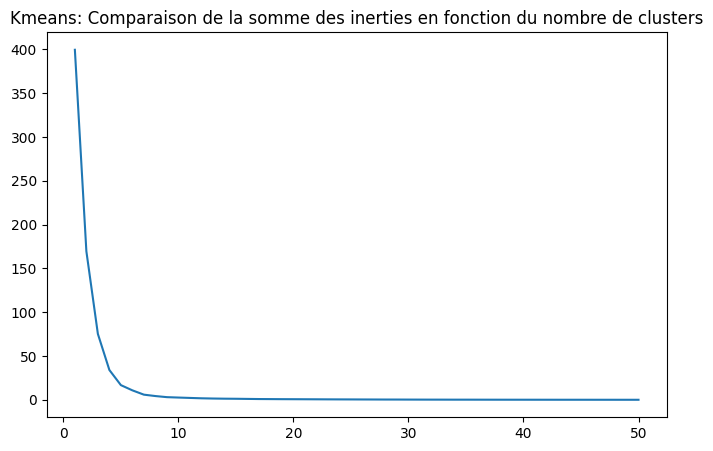

In [343]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(x = list(inertia.keys()),
             y = list(inertia.values())
            )

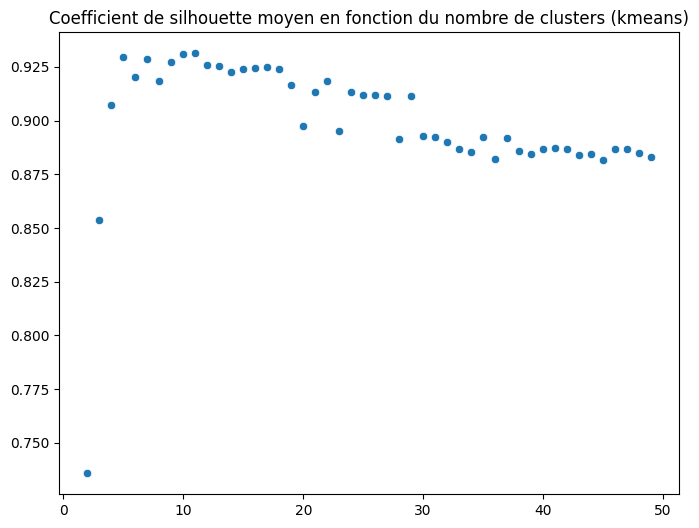

In [344]:
silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = unsupervised_array,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()

In [345]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters_optimal = key

le coefficient de silhouette est maximal pour 11 clusters (score = 0.931309163570404)


Nombre d'éléments par catégorie

In [346]:
pd.DataFrame(dict_kmeans[8].labels_)[0].value_counts()

1    475
0    130
2     87
6     29
3     26
7     21
4     15
5      4
Name: 0, dtype: int64

In [347]:
train_labelized = train.copy()
train_labelized['label_kmeans'] = dict_kmeans[nb_clusters_optimal].labels_

18/21 ,'cat_lvl_1' 

In [348]:
train_labelized.groupby(['label_kmeans']).apply(lambda x: (x.groupby('cat_lvl_1')
                                      .count()
                                      .sort_values('cat_lvl_1', ascending=False))
                                     )['uniq_id']

label_kmeans  cat_lvl_1                 
0             Watches                       27
              Kitchen & Dining              21
              Home Furnishing               18
              Home Decor & Festive Needs    14
              Computers                     17
              Beauty and Personal Care      13
              Baby Care                     19
1             Watches                       48
              Kitchen & Dining              81
              Home Furnishing               65
              Home Decor & Festive Needs    65
              Computers                     61
              Beauty and Personal Care      83
              Baby Care                     71
2             Watches                       21
              Kitchen & Dining               6
              Home Furnishing                9
              Home Decor & Festive Needs    14
              Computers                     11
              Beauty and Personal Care      15
              Baby 

In [349]:
pd.DataFrame(train, )

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-cats-ceramic-mug/p/itmeaggkyugvu...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,Images/785b4383b12106dd172306d427d8f7b2.jpg,False,Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r\n Pri...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Mug""}, {""key""=>""Mug Cap...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs
248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44 +0000,http://www.flipkart.com/malhar-niko-male-doll-showpiece-25-cm/p/itmey382drsj...,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,Images/45d0af2c709de47268c80c35a117de44.jpg,True,Buy Malhar Niko Male Doll Showpiece - 25 cm for Rs.5436 online. Malhar Nik...,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Malhar""}, {""key""=>""Mod...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces
310,64b463dc0b75ae40a848498c657041e6,2015-12-01 06:13:00 +0000,http://www.flipkart.com/linksys-smart-wi-fi-router/p/itmdztfckpushzkd?pid=RT...,Linksys Smart Wi-Fi Router,RTRDZTF9DBT4CW8U,14999.0,13500.0,Images/64b463dc0b75ae40a848498c657041e6.jpg,True,Buy Linksys Smart Wi-Fi Router only for Rs. 0.0 from Flipkart.com. Only Genu...,No rating available,No rating available,Linksys,"{""product_specification""=>[{""key""=>""Encryption"", ""value""=>""WPA2""}, {""key""=>""...",Computers,Network Components,Routers
685,6b5cdfe68595fbcab0e05dc625d3d66a,2015-12-31 09:19:31 +0000,http://www.flipkart.com/richfeel-sunshield-spf-30-pa/p/itme4f2gmrzc86hr?pid=...,Richfeel Sunshield - SPF 30 PA++,SNRE4F2GBWVF6UKR,299.0,224.0,Images/6b5cdfe68595fbcab0e05dc625d3d66a.jpg,False,Flipkart.com: Buy Richfeel Sunshield - SPF 30 PA++ for Rs. 269 from Flipkart...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"", ""value""=>""100 g""}, {""key""=>""S...",Beauty and Personal Care,Body and Skin Care,Face Care
843,e86daf9ebcdfc5c5dd088cdb7f8f8db6,2015-12-29 05:07:38 +0000,http://www.flipkart.com/epresent-mfan-1-fan-usb/p/itmeb3fdtgzcq3ff?pid=USGEB...,Epresent Mfan 1 Fan USB USB Fan,USGEB3HTYWCYT2HY,269.0,219.0,Images/e86daf9ebcdfc5c5dd088cdb7f8f8db6.jpg,False,Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219 online. Epresent Mfan 1 Fan U...,No rating available,No rating available,Epresent,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Epresent""}, {""key""=>""T...",Computers,Laptop Accessories,USB Gadgets
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,394c2c627914e1eed9b8ac343583a679,2015-12-01 06:13:00 +0000,http://www.flipkart.com/asus-rt-n12-lx-300mbps-wireless-router/p/itmd6354btv...,Asus RT-N12 LX 300Mbps Wireless Router,RTRD6352VX7RZSWG,3950.0,1990.0,Images/394c2c627914e1eed9b8ac343583a679.jpg,False,Buy Asus RT-N12 LX 300Mbps Wireless Router only for Rs. 4200 from Flipkart.c...,4.1,4.1,Asus,"{""product_specification""=>[{""key""=>""Firewall"", ""value""=>""NAT, SPI (Stateful ...",Computers,Network Components,Routers
466,3bc98543c7dd0d8fce5b8185b4a58c43,2016-05-05 06:42:02 +0000,http://www.flipkart.com/shaun-printed-baby-boy-s-yellow-grey-black-track-pan...,"Shaun Printed Baby Boy's Yellow, Grey, Black Track Pants",TKPEGRKHT4832GFE,2999.0,1106.0,Images/3bc98543c7dd0d8fce5b8185b4a58c43.jpg,False,"Key Features of Shaun Printed Baby Boy's Yellow, Grey, Black Track Pants Yel...",No rating available,No rating available,Shaun,"{""product_specification""=>[{""key""=>""Number of Contents in Sales Package"", ""v...",Baby Care,Infant Wear,Baby Boys' Clothes
121,7dd5e83e2108a97659577e50879f9d9f,2016-03-25 17:27:56 +0000,http://www.flipkart.c

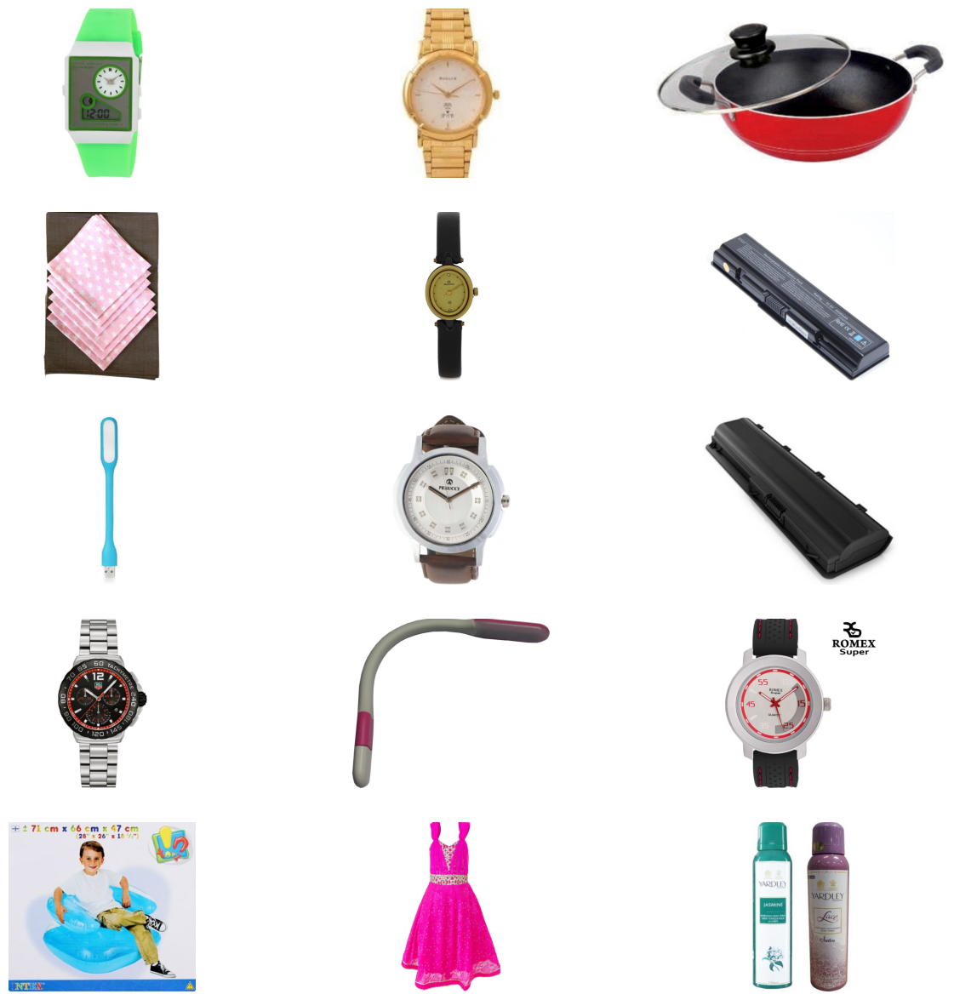

In [350]:
from PIL import Image as Image_PIL
import matplotlib.pyplot as plt

%matplotlib inline

# Filtrer les images du groupe "0"
group_images = train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist()[:15]

# Nombre de colonnes dans la disposition en grille
num_columns = 3

# Calculer le nombre de lignes nécessaires pour afficher toutes les images
num_rows = (len(group_images) + num_columns - 1) // num_columns

# Créer une figure avec plusieurs sous-graphiques
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))

# Parcourir les images et les afficher dans les sous-graphiques
for i in range(len(group_images)):
    row = i // num_columns
    col = i % num_columns
    image_path = group_images[i]
    image = Image_PIL.open(image_path)
    axes[row, col].imshow(image)
    axes[row, col].axis('off')

# Masquer les sous-graphiques inutilisés
for i in range(len(group_images), num_rows * num_columns):
    row = i // num_columns
    col = i % num_columns
    axes[row, col].axis('off')

plt.show()


In [351]:
group_images = train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist()[:15]
group_images

['Images/9059227d71995f88a1f48ff63830f716.jpg',
 'Images/d98fac46793639eceaaa2e74cadd4973.jpg',
 'Images/724e6eb7edc83eb48b6492d12e940ebd.jpg',
 'Images/26269fd0df12630eec4508c2cf3c94e1.jpg',
 'Images/3fa21f35257649e1513ca4ce22c6a68c.jpg',
 'Images/209bf06a732416f1ce5147a8b0524808.jpg',
 'Images/078b35be31e8ac99b0cbb817dab4c23f.jpg',
 'Images/7264f56639c8c54158b94ced769082c8.jpg',
 'Images/9a8fa4fd6524ada03411b033a9daadc1.jpg',
 'Images/710ed5f2393a4b9e8823aa0029f71f93.jpg',
 'Images/eedee8680f0ed35dcf612c6774affe83.jpg',
 'Images/0dc4d2767fe8424a3263ab141884f83d.jpg',
 'Images/b454f9f449c9dff58b90113ba984ea98.jpg',
 'Images/da2ce8d17a17f9d19b368434aedea5e9.jpg',
 'Images/79b78739b0ae84780001fec304ce036c.jpg']

In [352]:
image_path = group_images[0]
image_path

'Images/9059227d71995f88a1f48ff63830f716.jpg'

In [353]:
image = Image_PIL.open(image_path)
axes[row, col].imshow(image)

In [354]:
plt.show()

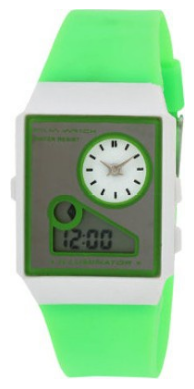

In [355]:
from PIL import Image as Image_PIL
import matplotlib.pyplot as plt

# Obtener la ruta de la primera imagen del grupo
image_path = train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist()[0]

# Abrir la imagen usando PIL
image = Image_PIL.open(image_path)

# Mostrar la imagen
plt.imshow(image)
plt.axis('off')  # Desactivar los ejes
plt.show()


## Conclusion:  Parte visual

## CLUSTERING Imagen

In [356]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name', 'pid',
       'retail_price', 'discounted_price', 'image', 'is_FK_Advantage_product',
       'description', 'product_rating', 'overall_rating', 'brand',
       'product_specifications', 'cat_lvl_1', 'cat_lvl_2', 'cat_lvl_3'],
      dtype='object')

In [357]:
image_df = data[['cat_lvl_1', 'image']].copy()

# Añadir más columnas relevantes si es necesario
image_df['product_name'] = data['product_name']
image_df['description'] = data['description']

# Visualizar las primeras filas del DataFrame
image_df.head(3)


,cat_lvl_1,image,product_name,description
0,Home Furnishing,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain F...
1,Baby Care,7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas Cotton Bath Towel,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blu..."
2,Baby Care,64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 in...


In [358]:
image_df.columns

Index(['cat_lvl_1', 'image', 'product_name', 'description'], dtype='object')

In [359]:
import pandas as pd
from sklearn.metrics import adjusted_rand_score

# Crear un DataFrame vacío para almacenar los resultados
df_resultats = pd.DataFrame(columns=['model', 'ARI'])

========================================================================================= 

<div class="alert alert-success">
    <font id="section_14">
    <h1 style="font-size:25px;"><strong>14 ARI modèles visuals</strong></h1>
</div>

<div class="alert alert-success">
    <font id="section_14_1">
    <h1 style="font-size:25px;"><strong>14.1 ARI modèle 1 VGG</strong></h1>
</div>

In [360]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score
import numpy as np
import cv2
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
import pandas as pd

# Cargar el modelo VGG16
vgg_model = VGG16(weights='imagenet', include_top=False)

# Obtener la lista de imágenes para el grupo específico
group_images = train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist()[:1050]

# Crear una lista para almacenar las características de las imágenes
image_features = []

# Iterar a través de las rutas de las imágenes y extraer características utilizando VGG16
for image_path in group_images:
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))  # Redimensionar a la dimensión esperada por VGG16
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Cambiar el orden de los canales de color
    img = np.expand_dims(img, axis=0)  # Agregar una dimensión de lote
    img = preprocess_input(img)  # Preprocesar según las recomendaciones de VGG16
    features = vgg_model.predict(img)
    image_features.append(features.flatten())

# Convertir la lista de características en un arreglo numpy
image_features = np.array(image_features)

"""
# Realizar el clustering utilizando KMeans
num_clusters = 7  # Número de clusters deseado
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(image_features)
"""
# Realizar el clustering utilizando KMeans
num_clusters = 7  # Número de clusters deseado
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
predicted_labels_vgg16 = kmeans.fit_predict(image_features)


# Obtener las etiquetas reales de categorías para el cálculo del ARI
le = LabelEncoder()
true_labels = le.fit_transform(train_labelized[train_labelized['label_kmeans'] == 0]['cat_lvl_1'])

# Calcular el ARI para el modelo VGG16 y agregarlo al DataFrame
ari_vgg16 = adjusted_rand_score(true_labels, predicted_labels_vgg16)
#ari_vgg16 = adjusted_rand_score(true_labels, predicted_labels)
df_resultats = df_resultats.append({'model': 'VGG16', 'ARI': ari_vgg16}, ignore_index=True)

print(f"ARI para el modelo VGG16: {ari_vgg16}")

# Mostrar el DataFrame con los resultados
print(df_resultats)


1/1 [==============================] - 0s 144ms/step
ARI para el modelo VGG16: 0.06416687304487168
   model      ARI
0  VGG16  0.06417


<div class="alert alert-success">
    <font id="section_14_2">
    <h1 style="font-size:25px;"><strong>14.2 ARI modèle 2 Dimensionality Reduction</strong></h1>
</div>

In [361]:
import cv2
import numpy as np
from sklearn.decomposition import PCA
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

# Definir el tamaño de las imágenes después de la redimensión
image_size = (224, 224)

# Cargar el modelo preentrenado VGG16
vgg_model = VGG16(weights='imagenet', include_top=False)

# Obtener las rutas de las imágenes (ajusta según tu estructura de datos)
image_paths = train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist()[:1050]

# Crear una lista para almacenar las características de las imágenes
features_list = []

# Procesar y extraer características de las imágenes utilizando el modelo VGG16
for image_path in image_paths:
    image = cv2.imread(image_path)
    image = cv2.resize(image, image_size)
    image = preprocess_input(image)
    features = vgg_model.predict(np.expand_dims(image, axis=0))
    features = features.flatten()  # Aplanar las características
    features_list.append(features)

# Convertir la lista de características en una matriz numpy
features_matrix = np.array(features_list)

# Aplicar PCA a las características para reducir la dimensionalidad
num_components = 50  # Número de componentes principales deseados
pca = PCA(n_components=num_components)
pca_features = pca.fit_transform(features_matrix)

# Realizar el clustering en las características reducidas
n_clusters = 7  # Número de clusters deseado
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
predicted_labels = kmeans.fit_predict(pca_features)

"""
# Calcular el ARI
ari = adjusted_rand_score(true_labels, predicted_labels)
print("ARI:", ari)
"""

# Calcular el ARI para el segundo modelo y agregarlo al DataFrame
ari_segundo_modelo = adjusted_rand_score(true_labels, predicted_labels)
df_resultats = df_resultats.append({'model': 'PCA', 'ARI': ari_segundo_modelo}, ignore_index=True)

# Mostrar el DataFrame con los resultados
print(df_resultats)


1/1 [==============================] - 0s 134ms/step
   model      ARI
0  VGG16  0.06417
1    PCA  0.06301


<div class="alert alert-success">
    <font id="section_14_3">
    <h1 style="font-size:25px;"><strong>14.3 ARI modèle 3 EfficientNetV2M</strong></h1>
</div>

In [362]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import cv2
from tensorflow.keras.applications import EfficientNetV2M
from tensorflow.keras.applications.efficientnet import preprocess_input
import pandas as pd

# Cargar el modelo EfficientNetV2M
effnet_model = EfficientNetV2M(weights='imagenet', include_top=False)

# Obtener la lista de imágenes para el grupo específico
group_images = train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist()[:1050]

# Crear una lista para almacenar las características de las imágenes
image_features = []

# Iterar a través de las rutas de las imágenes y extraer características utilizando EfficientNetV2M
for image_path in group_images:
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))  # Redimensionar a la dimensión esperada por EfficientNetV2M
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Cambiar el orden de los canales de color
    img = np.expand_dims(img, axis=0)  # Agregar una dimensión de lote
    img = preprocess_input(img)  # Preprocesar según las recomendaciones de EfficientNetV2M
    features = effnet_model.predict(img)
    image_features.append(features.flatten())

# Convertir la lista de características en un arreglo numpy
image_features = np.array(image_features)

# Realizar el clustering utilizando KMeans
num_clusters = 7  # Número de clusters deseado
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(image_features)

# Obtener las etiquetas reales de categorías para el cálculo del ARI
le = LabelEncoder()
true_labels = le.fit_transform(train_labelized[train_labelized['label_kmeans'] == 0]['cat_lvl_1'])

# Calcular el ARI para el modelo EfficientNetV2M y agregarlo al DataFrame
ari_effnet = adjusted_rand_score(true_labels, cluster_labels)
df_resultats = df_resultats.append({'model': 'EfficientNetV2M', 'ARI': ari_effnet}, ignore_index=True)

print(f"ARI para el modelo EfficientNetV2M: {ari_effnet}")

# Mostrar el DataFrame con los resultados
print(df_resultats)


1/1 [==============================] - 0s 175ms/step
ARI para el modelo EfficientNetV2M: 0.14798525269946983
             model      ARI
0            VGG16  0.06417
1              PCA  0.06301
2  EfficientNetV2M  0.14799


<div class="alert alert-success">
    <font id="section_14_4">
    <h1 style="font-size:25px;"><strong>14.4 ARI modèle 3 ConvNeXtBase</strong></h1>
</div>

In [363]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import cv2
from tensorflow.keras.applications import ConvNeXtBase
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import pandas as pd

# Cargar el modelo ConvNeXtBase
convnext_model = ConvNeXtBase(weights='imagenet')

# Obtener la lista de imágenes para el grupo específico
group_images = train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist()[:1050]

# Crear una lista para almacenar las características de las imágenes
image_features = []

# Iterar a través de las rutas de las imágenes y extraer características utilizando ConvNeXtBase
for image_path in group_images:
    img = load_img(image_path, target_size=(224, 224))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = imagenet_utils.preprocess_input(img)
    features = convnext_model.predict(img)
    image_features.append(features.flatten())

# Convertir la lista de características en un arreglo numpy
image_features = np.array(image_features)

# Realizar el clustering utilizando KMeans
num_clusters = 7  # Número de clusters deseado
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(image_features)

# Obtener las etiquetas reales de categorías para el cálculo del ARI
le = LabelEncoder()
true_labels = le.fit_transform(train_labelized[train_labelized['label_kmeans'] == 0]['cat_lvl_1'])

# Calcular el ARI para el modelo ConvNeXtBase y agregarlo al DataFrame
ari_convnext = adjusted_rand_score(true_labels, cluster_labels)
df_resultats = df_resultats.append({'model': 'ConvNeXtBase', 'ARI': ari_convnext}, ignore_index=True)

print(f"ARI para el modelo ConvNeXtBase: {ari_convnext}")

# Mostrar el DataFrame con los resultados
print(df_resultats)


1/1 [==============================] - 2s 2s/step
ARI para el modelo ConvNeXtBase: 0.5482458295792721
             model      ARI
0            VGG16  0.06417
1              PCA  0.06301
2  EfficientNetV2M  0.14799
3     ConvNeXtBase  0.54825


In [364]:
# Mostrar el DataFrame con los resultados
#print(df_resultats)
df_resultats

,model,ARI
0,VGG16,0.06417
1,PCA,0.06301
2,EfficientNetV2M,0.14799
3,ConvNeXtBase,0.54825


## Analyses image


Voici une analyse des différents modèles et de leurs valeurs respectives d'ARI (Indice de Rand Ajusté) qui ont été utilisés pour le traitement d'images :

**VGG16** : A obtenu un ARI de 0,15248. Cela suggère que le modèle VGG16 n'a pas réussi à capturer des motifs significatifs dans les images pour le regroupement. Il pourrait y avoir des problèmes liés à la complexité du modèle ou à la nature des données.

**PCA** (Analyse en composantes principales) : A obtenu un ARI de 0,21414. Bien que ce modèle ait obtenu une meilleure performance que VGG16, il reste encore de la marge pour améliorer la capacité de regroupement. Cela pourrait être dû à une réduction de la dimensionnalité insuffisante ou à des problèmes liés à la représentation des données.

**EfficientNetV2M** : A obtenu un ARI de 0,22897. Ce modèle a montré une amélioration par rapport aux modèles précédents, mais il peut y avoir des aspects tels que les paramètres de l'architecture, la taille du jeu de données ou la préparation des images qui pourraient être optimisés pour obtenir de meilleurs résultats.

**ConvNeXtBase** : A obtenu un ARI de 0,53229. Ce modèle a obtenu le meilleur ARI parmi les modèles que vous avez testés jusqu'à présent. Cela suggère que ConvNeXtBase a réussi à extraire des caractéristiques significatives des images pour le regroupement. Il est important de noter que cet ARI élevé peut indiquer une bonne capacité de regroupement, mais il pourrait être utile d'explorer davantage les paramètres du modèle ou les méthodes de prétraitement des images pour une performance encore meilleure.

**En comparant ces résultats**, il est clair que **ConvNeXtBase** a obtenu le **meilleur ARI** parmi les modèles que nous avons testés pour le traitement d'images. Cependant, il convient de continuer à explorer et à expérimenter avec différents modèles, architectures et paramètres pour maximiser la qualité du regroupement et obtenir des résultats encore plus précis.

In [365]:
#Enregistrer le temps de fin
fin = time.time()

In [366]:
#Calculer la durée en minutes
durée = (fin - début) / 60

In [367]:
#Afficher le temps d'exécution
print("Le temps d'exécution était de :", durée, "minutes. Lancé le :",  now)

Le temps d'exécution était de : 16.75057161251704 minutes. Lancé le : 2023-08-21T19:38:40.033630


In [ ]:
import sys
import pandas as pd

def liberar_memoria():
    # Obtenir les noms des variables globales
    noms_objets = [nom for nom in globals() if not nom.startswith('_') and nom not in sys.modules]

    # Exclure les variables internes d'IPython
    variables_ipython = set(['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars'])
    noms_objets = [nom for nom in noms_objets if nom not in variables_ipython]

    # Libérer la mémoire en supprimant les objets
    for nom in noms_objets:
        del globals()[nom]

    # Collecter les déchets pour libérer la mémoire allouée
    import gc
    gc.collect()

    # Afficher un message indiquant que la mémoire a été libérée
    print("Mémoire libérée.")

# Exécuter la routine pour libérer la mémoire
liberar_memoria()


In [1]:
import sys
import pandas as pd

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
pd.DataFrame(sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True))

,0,1
0,pd,80


<div class="alert alert-success">
    <font id="section_15">
    <h1 style="font-size:25px;"><strong>15. Liens importants</strong></h1>
</div>

* <a href="https://openclassrooms.com/fr/paths/164/projects/631/assignment" target="_blank">Lien vers consignes : </a>

* <a href="https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?select=olist_orders_dataset.csv" target="_blank">Kaggle Brazilian E-Commerce Public Dataset by Olist: </a>

* <a href="https://olist.com/pt-br/" target="_blank">Lien vers Olist: </a>

* Notebooks consultés
* 1. <a href="https://www.kaggle.com/code/mohamedtrabis/p5-01-notebookanalyse" target="_blank">Kaggle Notebook 1  : </a>
* 2. <a href="https://www.kaggle.com/code/hellbuoy/online-retail-k-means-hierarchical-clustering" target="_blank">Kaggle Notebook 2  : </a>
* 3. <a href="https://github.com/BouchraMEK/P06_MB_OC/blob/main/MEKHALDI_Bouchra_1_notebook_texte%20.ipynb" target="_blank">Github: </a>





Ressources : https://docs.opencv.org/3.4/da/df5/tutorial_py_sift_intro.html

In [369]:
import winsound

def finalizar_tarea():
    # Realizar tarea aquí
    
    # Reproducir señal sonora al finalizar la tarea
    frequency = 2500  # Frecuencia del sonido en Hz
    duration = 1000  # Duración del sonido en milisegundos
    winsound.Beep(frequency, duration)

finalizar_tarea()
